# Progetto Streaming Data

In [1]:
#Importo le librerie che mi potrebbero servire:
import numpy as np
import pandas as pd
import matplotlib as mpl
import datetime
from dateutil.parser import parse 
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings
import os
import matplotlib.dates as mdates
import calendar
from calendar import monthrange
from datetime import timedelta
plt.rcParams.update({'figure.figsize': (10, 7), 'figure.dpi': 120})
warnings.filterwarnings('ignore')
import datetime as dt

In [2]:
#Importo i dati del progetto:
dati = pd.read_csv("/Users/matteo/Desktop/DATA SCIENCE/Streaming data/Progetto Streaming Data/TrainingSet.csv", sep=';', header=0, low_memory=False)
dati_originale = dati

In [3]:
dati.head()

,DATA,Ora,VALORE
0,2018-09-01,1,3646742
1,2018-09-01,2,3273110
2,2018-09-01,3,3069245
3,2018-09-01,4,2969621
4,2018-09-01,5,2944116


In [4]:
#Osservo la presenza dei nomi delle feature che sono in maiuscolo, posso pensare di cambiarli per una maggiore comprensione:
dati.rename(columns={"DATA": "Data", "VALORE": "Valore"}, inplace=True)
dati.head()

,Data,Ora,Valore
0,2018-09-01,1,3646742
1,2018-09-01,2,3273110
2,2018-09-01,3,3069245
3,2018-09-01,4,2969621
4,2018-09-01,5,2944116


In [5]:
#Shape del dataset:
print("Shape del dataset: " ,dati.shape)
#Ho verificato che abbiamo a disposizione indicativamente 17519 osservazioni:
print("Describe del dataset:")
print( dati.describe())
#Eseguo un describe sui dati per avere maggiori informazioni sulle ore e sul valore riportato:
print("INFO ()")
print(dati.info());

Shape del dataset:  (17518, 3)
Describe del dataset:
                Ora        Valore
count  17518.000000  1.751800e+04
mean      12.501085  4.235628e+06
std        6.922035  1.258343e+06
min        1.000000  1.796490e+06
25%        7.000000  3.156970e+06
50%       13.000000  4.187692e+06
75%       18.750000  5.147029e+06
max       24.000000  9.099482e+06
INFO ()
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17518 entries, 0 to 17517
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Data    17518 non-null  object
 1   Ora     17518 non-null  int64 
 2   Valore  17518 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 410.7+ KB
None


In [6]:
#Osservando le Ore mi rendo conto che le ore sono dal formato 1-24, ma questo non risulta molto comodo, quindi cambio il valore delle ore:
dati['Ora']=dati['Ora'] - 1
dati.head()

,Data,Ora,Valore
0,2018-09-01,0,3646742
1,2018-09-01,1,3273110
2,2018-09-01,2,3069245
3,2018-09-01,3,2969621
4,2018-09-01,4,2944116


In [7]:
dati['Ora'] = dati['Ora'].astype(str)

In [8]:
#Creo la feature con la data e ora aggregata. Sarò utilizzata come index per tutto il corso del progetto.
dati['DataeOra']=pd.to_datetime(dati['Data'] + '-' + dati['Ora'], format = "%Y-%m-%d-%H")

In [10]:
dati.head()

,Data,Ora,Valore,DataeOra
0,2018-09-01,0,3646742,2018-09-01 00:00:00
1,2018-09-01,1,3273110,2018-09-01 01:00:00
2,2018-09-01,2,3069245,2018-09-01 02:00:00
3,2018-09-01,3,2969621,2018-09-01 03:00:00
4,2018-09-01,4,2944116,2018-09-01 04:00:00


In [11]:
#Estraggo il mese ed il giorno per considerazioni successive:
dati['Mese']= dati['DataeOra'].dt.month
dati['Giorno']= dati["DataeOra"].dt.day
dati['Anno']= dati["DataeOra"].dt.year

In [12]:
dati.head()

,Data,Ora,Valore,DataeOra,Mese,Giorno,Anno
0,2018-09-01,0,3646742,2018-09-01 00:00:00,9,1,2018
1,2018-09-01,1,3273110,2018-09-01 01:00:00,9,1,2018
2,2018-09-01,2,3069245,2018-09-01 02:00:00,9,1,2018
3,2018-09-01,3,2969621,2018-09-01 03:00:00,9,1,2018
4,2018-09-01,4,2944116,2018-09-01 04:00:00,9,1,2018


In [13]:
#Definisco una funzione per la rimozione delle colonne non desiderate:
def remove_unwanted_cols(dataset, cols):
    for col in cols:
        del dataset[col]
    return dataset
#Esplorazione dei valori NaN:
analisinulldati_complessivi = pd.DataFrame(dati.isna().sum())
analisinulldati_complessivi = analisinulldati_complessivi.reset_index(drop = False)
analisinulldati_complessivi = analisinulldati_complessivi.rename(columns={"index": "Nome_variabile", 0 : "elementi_null"})
analisinulldati_complessivi = analisinulldati_complessivi.sort_values("elementi_null", ascending= False).reset_index()
analisinulldati_complessivi["elementi_totali"] = 17518
analisinulldati_complessivi["elementi_corretti"] = analisinulldati_complessivi["elementi_totali"] - analisinulldati_complessivi["elementi_null"]
analisinulldati_complessivi = remove_unwanted_cols(analisinulldati_complessivi, ['index'])
analisinulldati_complessivi = analisinulldati_complessivi[analisinulldati_complessivi.elementi_null != 0]
analisinulldati_complessivi["percentuale_null"] = (analisinulldati_complessivi["elementi_null"] * 100)/ analisinulldati_complessivi["elementi_totali"]
analisinulldati_complessivi
#Tramite queste operazioni stabilisco il numero di valori mancanti e verifico che non ci sono valori mancanti nel dataset.

,Nome_variabile,elementi_null,elementi_totali,elementi_corretti,percentuale_null


In [14]:
#Vado a creare un nuovo dataset nel quale la feature "DataeOra" sono come index:
dati.head()

,Data,Ora,Valore,DataeOra,Mese,Giorno,Anno
0,2018-09-01,0,3646742,2018-09-01 00:00:00,9,1,2018
1,2018-09-01,1,3273110,2018-09-01 01:00:00,9,1,2018
2,2018-09-01,2,3069245,2018-09-01 02:00:00,9,1,2018
3,2018-09-01,3,2969621,2018-09-01 03:00:00,9,1,2018
4,2018-09-01,4,2944116,2018-09-01 04:00:00,9,1,2018


In [15]:
rangedate = pd.date_range(start=dati["DataeOra"].min(), end=dati["DataeOra"].max(), freq='H')
dati.set_index('DataeOra', inplace=True)
dati.reindex(rangedate)

,Data,Ora,Valore,Mese,Giorno,Anno
2018-09-01 00:00:00,2018-09-01,0,3646742.0,9.0,1.0,2018.0
2018-09-01 01:00:00,2018-09-01,1,3273110.0,9.0,1.0,2018.0
2018-09-01 02:00:00,2018-09-01,2,3069245.0,9.0,1.0,2018.0
2018-09-01 03:00:00,2018-09-01,3,2969621.0,9.0,1.0,2018.0
2018-09-01 04:00:00,2018-09-01,4,2944116.0,9.0,1.0,2018.0
...,...,...,...,...,...,...
2020-08-31 19:00:00,2020-08-31,19,4284919.0,8.0,31.0,2020.0
2020-08-31 20:00:00,2020-08-31,20,4400006.0,8.0,31.0,2020.0
2020-08-31 21:00:00,2020-08-31,21,3965396.0,8.0,31.0,2020.0
2020-08-31 22:00:00,2020-08-31,22,3442262.0,8.0,31.0,2020.0


In [16]:
dati.index.rename('DataeOra', inplace=True)
dati.head()

,Data,Ora,Valore,Mese,Giorno,Anno
DataeOra,,,,,,
2018-09-01 00:00:00,2018-09-01,0,3646742,9,1,2018
2018-09-01 01:00:00,2018-09-01,1,3273110,9,1,2018
2018-09-01 02:00:00,2018-09-01,2,3069245,9,1,2018
2018-09-01 03:00:00,2018-09-01,3,2969621,9,1,2018
2018-09-01 04:00:00,2018-09-01,4,2944116,9,1,2018


In [17]:
#Osservo la presenza di dati mancanti che provvedo a gestire.
dati[dati.index == '2019-03-31 01:00:00']

,Data,Ora,Valore,Mese,Giorno,Anno
DataeOra,,,,,,
2019-03-31 01:00:00,2019-03-31,1,3039997,3,31,2019


In [18]:
dati.loc[pd.to_datetime('2019-03-31 02:00:00')] = [pd.NaT,pd.NaT,pd.NaT, pd.NaT, pd.NaT, pd.NaT]
dati = dati.sort_index()

In [19]:
dati.loc[pd.to_datetime('2020-03-29 02:00:00')] = [pd.NaT,pd.NaT,pd.NaT, pd.NaT, pd.NaT, pd.NaT]
dati = dati.sort_index()

In [20]:
dati[dati.index == '2020-03-29 02:00:00']

,Data,Ora,Valore,Mese,Giorno,Anno
DataeOra,,,,,,
2020-03-29 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
#as professor said, for the two missing time values ​​I insert the value of the previous hour
dati.loc['2019-03-31 02:00:00']["Valore"] = dati.loc['2019-03-31 01:00:00']["Valore"]
dati.loc['2020-03-29 02:00:00']["Valore"] = dati.loc['2020-03-29 01:00:00']["Valore"]

In [22]:
dati[dati.index == '2020-03-29 02:00:00']

,Data,Ora,Valore,Mese,Giorno,Anno
DataeOra,,,,,,
2020-03-29 02:00:00,NaN,NaN,2329514,NaN,NaN,NaN


In [23]:
dati[dati.index == '2019-03-31 02:00:00']

,Data,Ora,Valore,Mese,Giorno,Anno
DataeOra,,,,,,
2019-03-31 02:00:00,NaN,NaN,3039997,NaT,NaT,NaT


In [24]:
dati1 = dati

In [25]:
from datetime import datetime

In [27]:
dati1["Data"] = dati1["Data"].astype(str)

In [29]:
dati1 = dati1.dropna()

In [30]:
#[SI PUò RIMUOVERE, HO MESSO UN'ALTRA OPZIONE DOPO]
#Vado a verificare che effettivamente vi siano tutti i giorni legati
from datetime import datetime
#dati["Data"] = dati["Data"].apply(lambda x: dt.datetime.strftime(x, '%Y-%m-%d'))
colonnadataeora = dati1["Data"].tolist()

newlistcolonnadataeora = []
for i in colonnadataeora:
  if i not in newlistcolonnadataeora:
    newlistcolonnadataeora.append(i)

#newlistcolonnadataeora = " ".join([str(i) for i in newlistcolonnadataeora])
counters = {}
for t in newlistcolonnadataeora:
    month = datetime.strptime(t, "%Y-%m-%d").strftime('%m')
    if month in counters:
        counters[month] += 1
    else:
        counters[month] = 1

for k,v in counters.items():
    print('{}-{}'.format(k,v))


#Posso osservare come al mese di Maggio vi sia un giorno in meno, vado ad osservare meglio il fenomeno:

09-60
10-62
11-60
12-62
01-62
02-57
03-62
04-60
05-61
06-60
07-62
08-62


In [31]:
dati["Mese"].value_counts()

1     1488
7     1488
8     1488
10    1488
12    1488
3     1486
5     1464
4     1440
6     1440
9     1440
11    1440
2     1368
Name: Mese, dtype: int64

In [32]:
#Posso osservare che il giorno mancante è il 31 Maggio, ora non mi resta che capire di che anno:
dati["Giorno"][dati["Mese"] == 5].value_counts()

1     48
17    48
30    48
29    48
28    48
27    48
26    48
25    48
24    48
23    48
22    48
21    48
20    48
19    48
18    48
16    48
2     48
15    48
14    48
13    48
12    48
11    48
10    48
9     48
8     48
7     48
6     48
5     48
4     48
3     48
31    24
Name: Giorno, dtype: int64

In [33]:
#La differenza si può osservare nell'anno 2020, quindi il giorno mancante con anche le ore mancanti, è il giorno 31 Maggio 2020. Devo decidere come gestire questa mancanza di dati.
dati["Anno"][dati["Mese"] == 5].value_counts()

2019    744
2020    720
Name: Anno, dtype: int64

In [34]:
#Procedo inizialmente a inserire i valori mancanti nel giorno 31 maggio del 2019:
a=0
for i in pd.date_range(start="2020-05-31 00:00:00", end="2020-05-31 23:00:00", freq='H'):
  dati.loc[i,'Valore']=(dati.loc[pd.to_datetime(i)-dt.timedelta(days=14),'Valore']+dati.loc[pd.to_datetime(i)+dt.timedelta(days=14),'Valore'])/2
  a=a+1

In [35]:
#Posso verificare che il giorno del 31 maggio ci siano adesso tutti i valori che abbiamo inserito, come media dei 14 giorni precedenti e successivi:
dati[dati.index == "2020-05-31 05:00:00"]

,Data,Ora,Valore,Mese,Giorno,Anno
DataeOra,,,,,,
2020-05-31 05:00:00,NaN,NaN,2054630.0,NaN,NaN,NaN


In [36]:
#Uso il sort_index() per permettere così al mio index di essere ordinato come valori temporali.
dati = dati.sort_index()
dati.tail()

,Data,Ora,Valore,Mese,Giorno,Anno
DataeOra,,,,,,
2020-08-31 19:00:00,2020-08-31,19,4284919,8,31,2020
2020-08-31 20:00:00,2020-08-31,20,4400006,8,31,2020
2020-08-31 21:00:00,2020-08-31,21,3965396,8,31,2020
2020-08-31 22:00:00,2020-08-31,22,3442262,8,31,2020
2020-08-31 23:00:00,2020-08-31,23,2932544,8,31,2020


In [37]:
#Se dovessi quindi ri-osservare i valori NaN, certametne avrei adesso dei valori in determinate colonne:
analisinulldati_complessivi = pd.DataFrame(dati.isna().sum())
analisinulldati_complessivi = analisinulldati_complessivi.reset_index(drop = False)
analisinulldati_complessivi = analisinulldati_complessivi.rename(columns={"index": "Nome_variabile", 0 : "elementi_null"})
analisinulldati_complessivi = analisinulldati_complessivi.sort_values("elementi_null", ascending= False).reset_index()
analisinulldati_complessivi["elementi_totali"] = 17518
analisinulldati_complessivi["elementi_corretti"] = analisinulldati_complessivi["elementi_totali"] - analisinulldati_complessivi["elementi_null"]
analisinulldati_complessivi = remove_unwanted_cols(analisinulldati_complessivi, ['index'])
analisinulldati_complessivi = analisinulldati_complessivi[analisinulldati_complessivi.elementi_null != 0]
analisinulldati_complessivi["percentuale_null"] = (analisinulldati_complessivi["elementi_null"] * 100)/ analisinulldati_complessivi["elementi_totali"]
analisinulldati_complessivi

#Corrispondono appunto a 24 che erano le ore mancanti del giorno mancante del 31 maggio 2020. Devono essere gestiti per le analisi successive.

,Nome_variabile,elementi_null,elementi_totali,elementi_corretti,percentuale_null
0,Ora,26,17518,17492,0.148419
1,Mese,26,17518,17492,0.148419
2,Giorno,26,17518,17492,0.148419
3,Anno,26,17518,17492,0.148419
4,Data,24,17518,17494,0.137002


In [38]:
#Estraggo il mese ed il giorno per considerazioni successive:
dati['Anno']= dati.index.year
dati['Mese']= dati.index.month
dati['Giorno']= dati.index.day
dati['Ora']= dati.index.hour
dati['Giornosettimana'] = dati.index.day_name()

In [39]:
#Se dovessi quindi ri-osservare i valori NaN, certametne avrei adesso dei valori in determinate colonne:
analisinulldati_complessivi = pd.DataFrame(dati.isna().sum())
analisinulldati_complessivi = analisinulldati_complessivi.reset_index(drop = False)
analisinulldati_complessivi = analisinulldati_complessivi.rename(columns={"index": "Nome_variabile", 0 : "elementi_null"})
analisinulldati_complessivi = analisinulldati_complessivi.sort_values("elementi_null", ascending= False).reset_index()
analisinulldati_complessivi["elementi_totali"] = 17518
analisinulldati_complessivi["elementi_corretti"] = analisinulldati_complessivi["elementi_totali"] - analisinulldati_complessivi["elementi_null"]
analisinulldati_complessivi = remove_unwanted_cols(analisinulldati_complessivi, ['index'])
analisinulldati_complessivi = analisinulldati_complessivi[analisinulldati_complessivi.elementi_null != 0]
analisinulldati_complessivi["percentuale_null"] = (analisinulldati_complessivi["elementi_null"] * 100)/ analisinulldati_complessivi["elementi_totali"]
analisinulldati_complessivi

,Nome_variabile,elementi_null,elementi_totali,elementi_corretti,percentuale_null
0,Data,24,17518,17494,0.137002


In [40]:
#Mancherebbe da estrarre la data per la gestione e per una maggiore completezza

In [41]:
#Vado ad esportare il dataset che ho creato:
dati.to_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/dati_preprocessati.csv')

# Visualizzazioni studio dataset

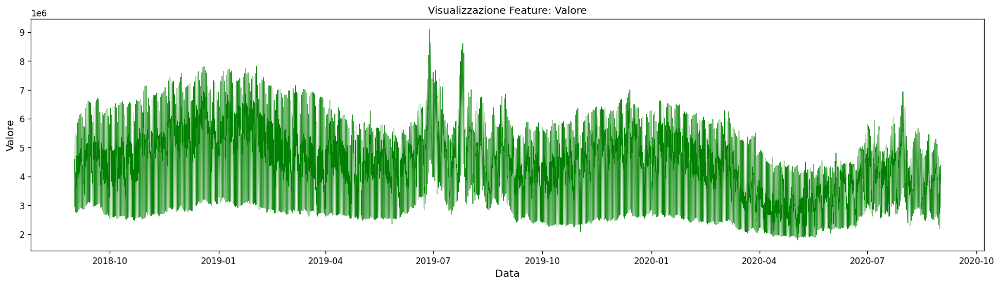

In [42]:
#Eseguo una prima rappresentazione base per capire l'andamento della feature "Valore":
plt.figure(figsize=(20, 5))
plt.plot(dati['Valore'], color='green', linewidth=0.5)
plt.title("Visualizzazione Feature: Valore")
plt.ylabel('Valore', fontsize = 12)
plt.xlabel("Data", fontsize = 12)
plt.show()

#Si può osservare la presenza di outliers per quanto riguarda i mesi di Giugno e Luglio 2019, oltre che per intorno a Luglio 2020. riseptto all'andamento del periodo.

In [43]:
dati["Mese"] = dati["Mese"].astype(float)
dati["Valore"] = dati["Valore"].astype(float)

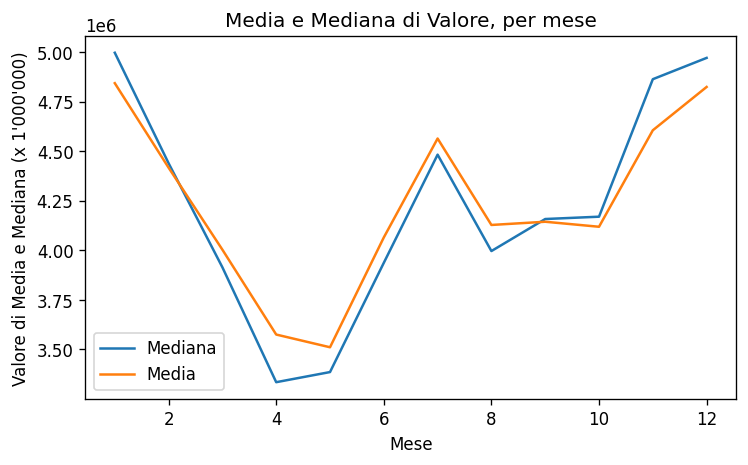

In [62]:
#[DA MIGLIORARE]
#Valore calcolando la mediana di valore per ogni mese dell'anno:
plt.figure(figsize=(7, 4))
dati.groupby("Mese")["Valore"].median().plot()
dati.groupby("Mese")["Valore"].mean().plot()
plt.title("Media e Mediana di Valore, per mese")
plt.legend(["Mediana", "Media"])
plt.ylabel("Valore di Media e Mediana (x 1'000'000)")
plt.show()

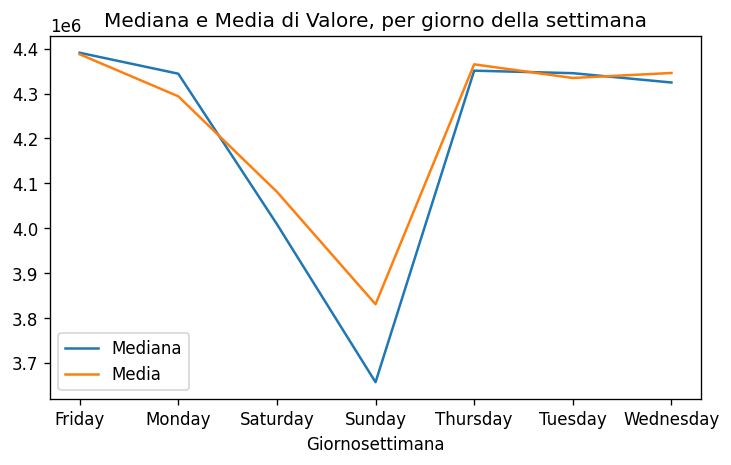

In [63]:
#[DA MIGLIORARE]
#Valore calcolando la mediana di valore per ogni mese dell'anno:
plt.figure(figsize=(7, 4))
dati.groupby("Giornosettimana")["Valore"].median().plot()
dati.groupby("Giornosettimana")["Valore"].mean().plot()
plt.title("Mediana e Media di Valore, per giorno della settimana")
plt.legend(["Mediana", "Media"])
plt.show()

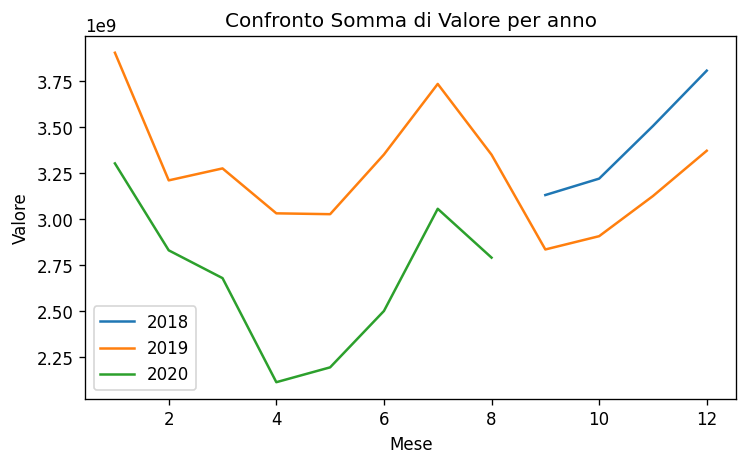

In [66]:
pv = pd.pivot_table(dati, index=dati.index.month, columns=dati.index.year, values='Valore', aggfunc='sum')
plt.figure(figsize=(7, 4))
plt.plot(pv)
plt.title("Confronto Somma di Valore per anno")
plt.xlabel("Mese")
plt.ylabel("Valore")
plt.legend(["2018", "2019", "2020"])
plt.show()

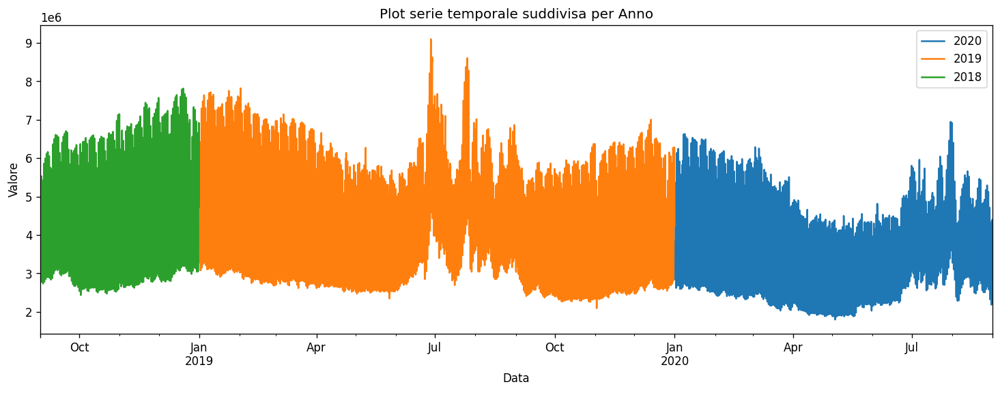

In [67]:
plt.figure(figsize=(15, 5))
dati.loc['2020', 'Valore'].plot()
dati.loc['2019', 'Valore'].plot()
dati.loc['2018', 'Valore'].plot()
plt.title("Plot serie temporale suddivisa per Anno")
plt.xlabel("Data")
plt.ylabel("Valore")
plt.legend(["2020", "2019", "2018"])
#ax.set_ylabel('Valore');

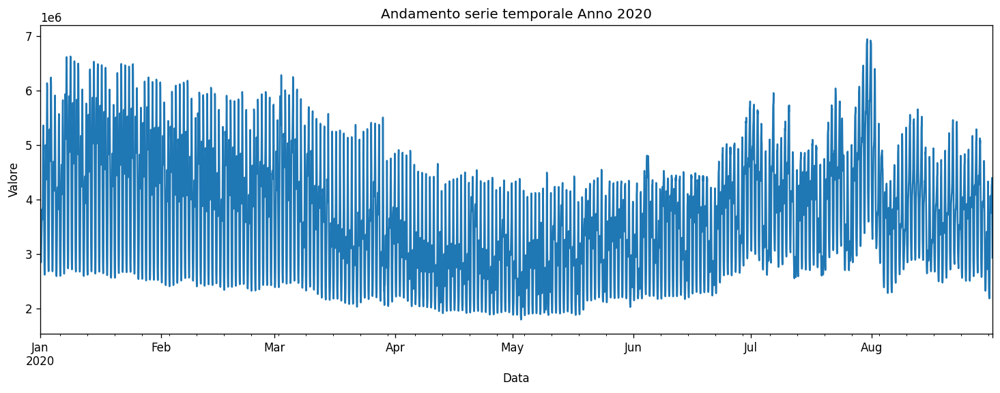

In [68]:
#Plot serie temporale per il l'anno 2020
plt.figure(figsize=(15, 5))
ax = dati.loc['2020', 'Valore'].plot()
ax.title.set_text("Andamento serie temporale Anno 2020")
ax.set_ylabel('Valore')
ax.set_xlabel('Data');

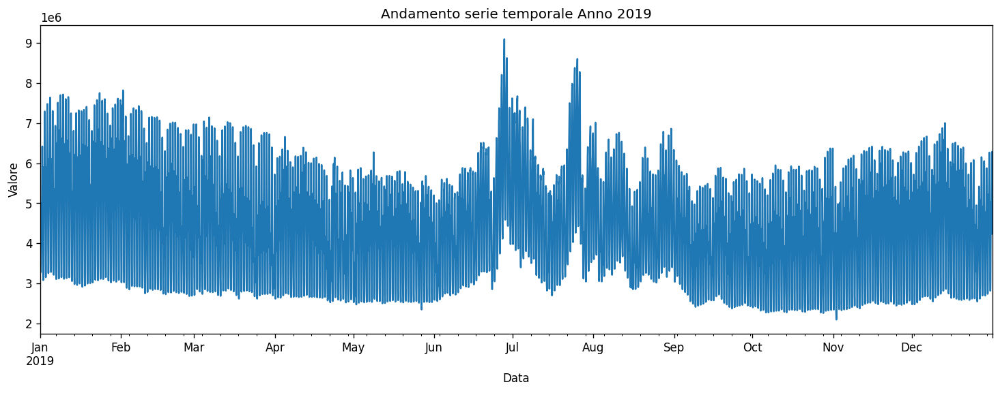

In [69]:
#Plot serie temporale per il l'anno 2019
plt.figure(figsize=(15, 5))
ax = dati.loc['2019', 'Valore'].plot()
ax.title.set_text("Andamento serie temporale Anno 2019")
ax.set_ylabel('Valore')
ax.set_xlabel('Data');

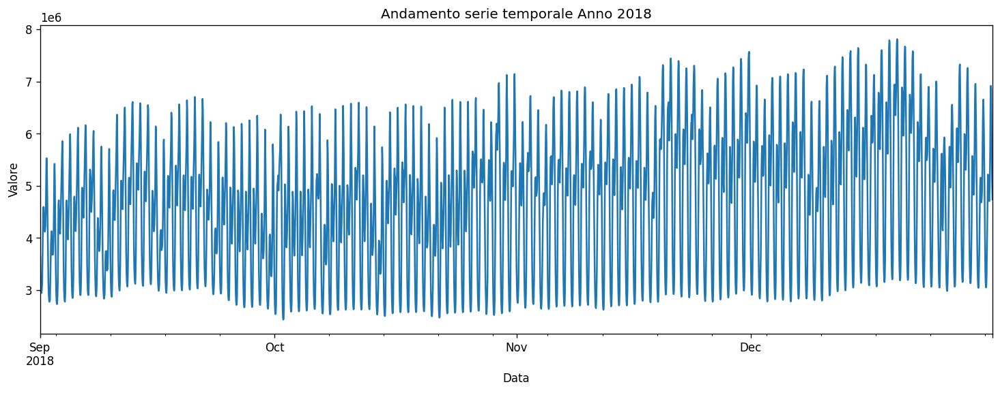

In [70]:
#Plot serie temporale per il l'anno 2018
plt.figure(figsize=(15, 5))
ax = dati.loc['2018', 'Valore'].plot()
ax.title.set_text("Andamento serie temporale Anno 2018")
ax.set_ylabel('Valore')
ax.set_xlabel('Data');

<AxesSubplot:xlabel='DataeOra'>

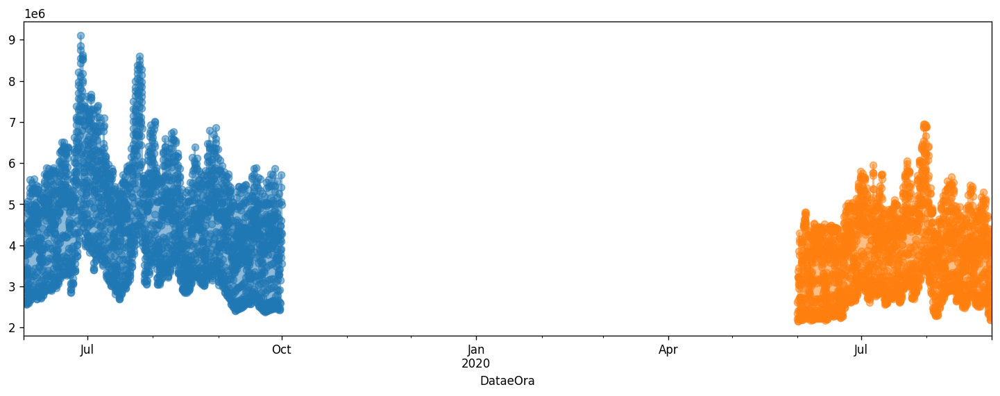

In [71]:
#Plot dei due anni senza considerare l'anno in mezzo:
plt.figure(figsize=(15, 5))
dati.loc['2019-06':'2019-09', 'Valore'].plot(marker='o', linestyle='-', alpha = 0.5)
dati.loc['2020-06':'2020-09', 'Valore'].plot(marker='o', linestyle='-', alpha = 0.5)

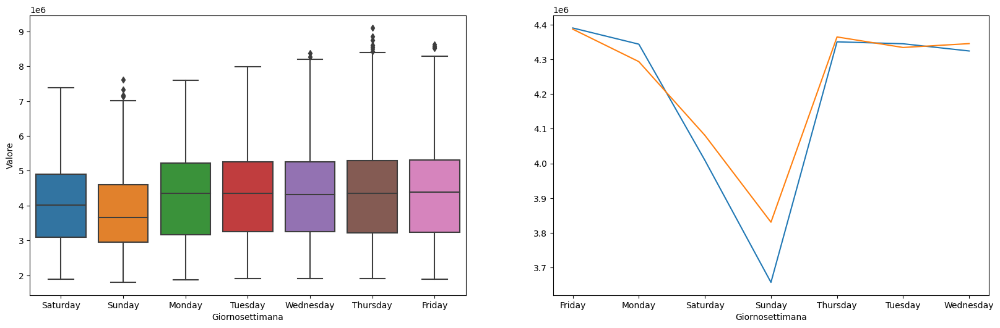

<Figure size 960x480 with 0 Axes>

<Figure size 720x360 with 0 Axes>

In [72]:
fig, axes = plt.subplots(1,2, figsize=(20,6), dpi=100)
#dati.plot(title='Trend Only', legend=False, ax=axes[0], marker='.')

#Per visualizzare i giorni della settimana in base al valore con i boxplot:
plt.figure(figsize=(8, 4))
sns.boxplot(data=dati, x='Giornosettimana', y='Valore', ax=axes[0]);

#Valore calcolando la mediana di valore per ogni mese dell'anno:
plt.figure(figsize=(6, 3))
dati.groupby("Giornosettimana")["Valore"].median().plot(ax=axes[1])
dati.groupby("Giornosettimana")["Valore"].mean().plot(ax=axes[1])
#plt.legend()
plt.show()

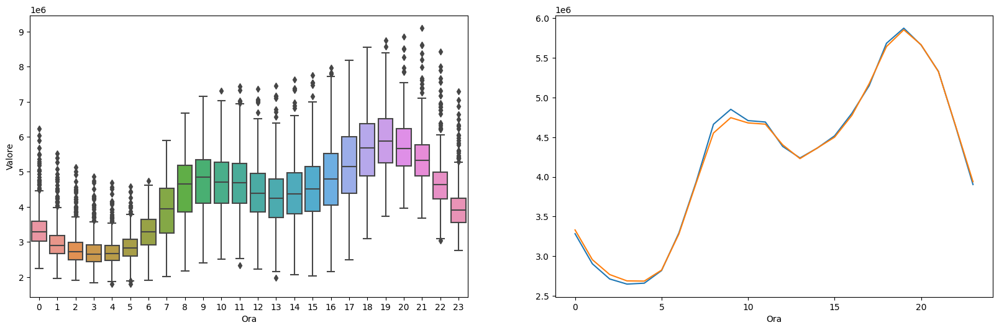

<Figure size 960x480 with 0 Axes>

<Figure size 720x360 with 0 Axes>

In [73]:
fig, axes = plt.subplots(1,2, figsize=(20,6), dpi=100)

#Per visualizzare i giorni della settimana in base al valore con i boxplot:
plt.figure(figsize=(8, 4))
sns.boxplot(data=dati, x='Ora', y='Valore', ax=axes[0]);

#Valore calcolando la mediana di valore per ogni mese dell'anno:
plt.figure(figsize=(6, 3))
dati.groupby("Ora")["Valore"].median().plot(ax=axes[1])
dati.groupby("Ora")["Valore"].mean().plot(ax=axes[1])
#plt.legend()
plt.show()

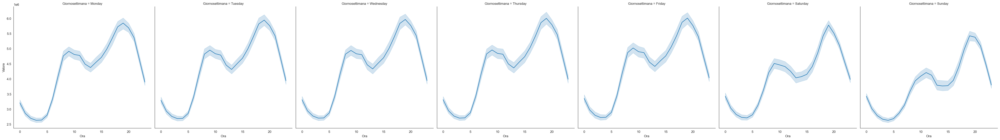

In [74]:
#Plot dell'andamento orario per giorno della settimana:
col_order=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
sns.set_style("white")
ax = sns.FacetGrid(dati, col="Giornosettimana", col_wrap=7, height=6, col_order=col_order)
ax.map(sns.lineplot, "Ora", "Valore")

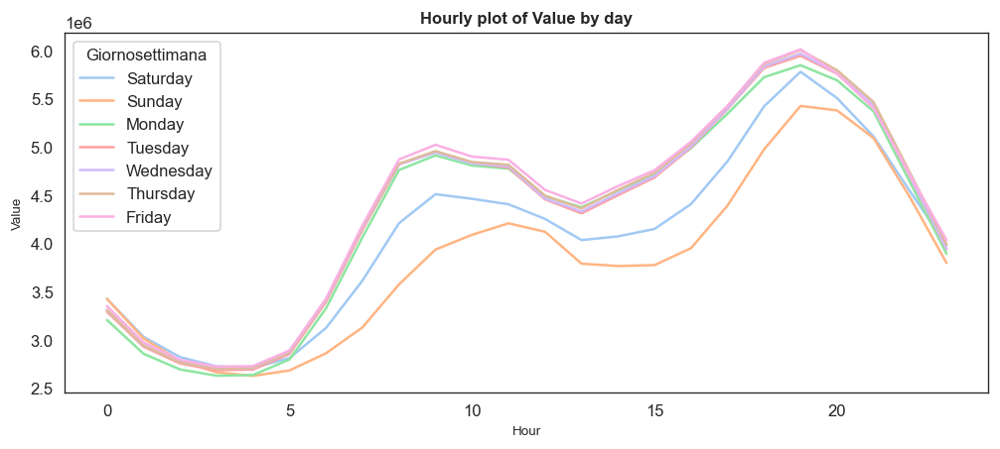

In [75]:
plt.figure(figsize=(10, 4))
sns.lineplot(dati['Ora'], dati['Valore'], hue=dati['Giornosettimana'], ci=None, palette="pastel")
plt.title('Hourly plot of Value by day', fontsize = 10, loc='center', fontdict=dict(weight='bold'))
plt.xlabel('Hour', fontsize = 8)
plt.ylabel('Value', fontsize = 8)
plt.show()

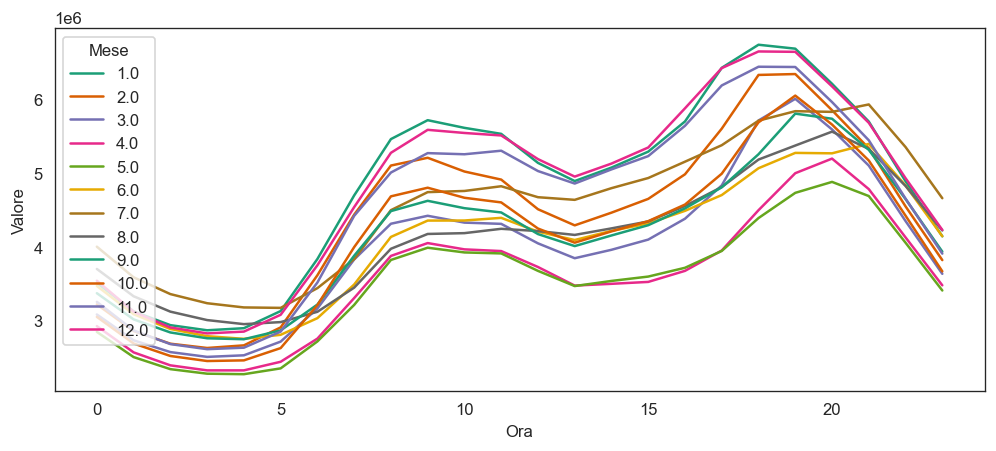

In [76]:
#Plot orario per mesi:
plt.figure(figsize=(10, 4))
sns.lineplot(x="Ora", y="Valore", data=dati, hue="Mese", palette="Dark2", ci = None);

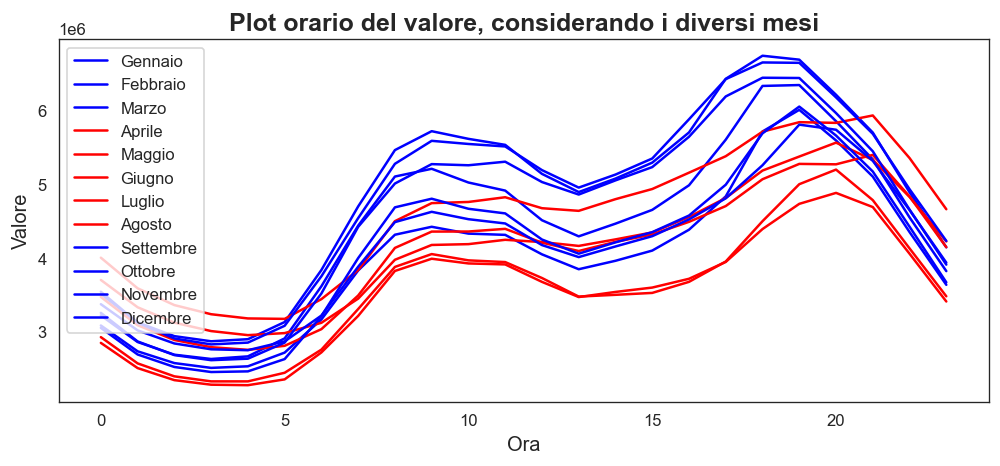

In [77]:
#Posso osservare decisamente un trend diverso per quanto riguarda i mesi estivi rispetto ad i mesi invernali:
plt.figure(figsize=(10, 4))
sns.lineplot(dati['Ora'], dati['Valore'], hue=dati['Mese'], ci = None,
             palette=["blue","blue","blue","red","red","red","red","red","blue","blue","blue","blue"])
plt.title('Plot orario del valore, considerando i diversi mesi', fontsize = 15, loc='center', fontdict=dict(weight='bold'))
plt.xlabel('Ora', fontsize = 12)
plt.ylabel('Valore', fontsize = 12)
plt.legend(['Gennaio', 'Febbraio', 'Marzo', 'Aprile', 'Maggio', 'Giugno', 'Luglio', 'Agosto', 'Settembre', 'Ottobre', 'Novembre', 'Dicembre'])
plt.show()

In [78]:
df_mean_valore_ora = dati.groupby('DataeOra', as_index=False, sort=False)['Valore'].mean()
df_mean_valore_ora.head()

,Valore
0,3646742.0
1,3273110.0
2,3069245.0
3,2969621.0
4,2944116.0


In [79]:
data_unique = dati["Data"].unique()

In [80]:
data_unique = pd.DataFrame(data_unique)
data_unique = data_unique.rename(columns = {0 : "Data"})
data_unique.head()

,Data
0,2018-09-01
1,2018-09-02
2,2018-09-03
3,2018-09-04
4,2018-09-05


In [81]:
result_media_ora = pd.concat([df_mean_valore_ora, data_unique], axis=1)
result_media_ora.head()

,Valore,Data
0,3646742.0,2018-09-01
1,3273110.0,2018-09-02
2,3069245.0,2018-09-03
3,2969621.0,2018-09-04
4,2944116.0,2018-09-05


In [82]:
result_media_ora.set_index('Data', inplace=True)

In [83]:
result_media_ora.index.rename("Data", inplace=True)
result_media_ora.head()

,Valore
Data,
2018-09-01,3646742.0
2018-09-02,3273110.0
2018-09-03,3069245.0
2018-09-04,2969621.0
2018-09-05,2944116.0


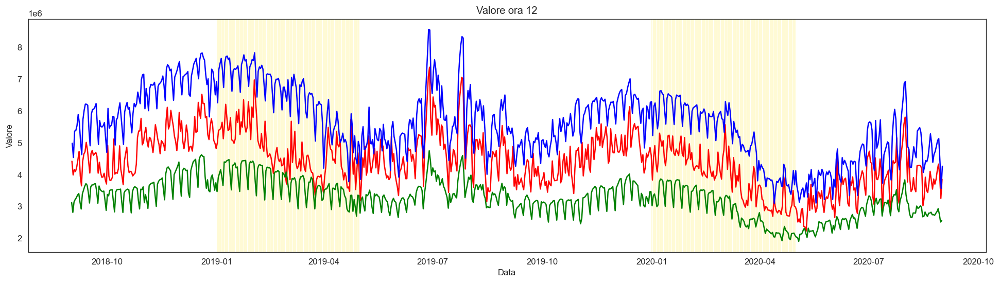

In [86]:
#Isolo solamente un'ora per osservare l'andamento generale:
ora=12
ora_diriferimento = dati[dati['Ora']== ora]
ora_2=18
ora_diriferimento_2 = dati[dati['Ora']== ora_2]
ora_3=6
ora_diriferimento_3 = dati[dati['Ora']== ora_3]


plt.figure(figsize=(20, 5))
mask = ((ora_diriferimento_3.index >= "2020-01-01 06:00:00") & (ora_diriferimento_3.index <= "2020-04-30 06:00:00"))
for i in ora_diriferimento_3[mask].index:
    plt.axvline(x=ora_diriferimento_3.index[ora_diriferimento_3.index== i], color='lemonchiffon', linewidth=1)
mask1 = ((ora_diriferimento_3.index >= "2019-01-01 06:00:00") & (ora_diriferimento_3.index <= "2019-04-30 06:00:00"))
for j in ora_diriferimento_3[mask1].index:
    plt.axvline(x=ora_diriferimento_3.index[ora_diriferimento_3.index== j], color='lemonchiffon', linewidth=1)
plt.plot(ora_diriferimento['Valore'], color='red')
plt.plot(ora_diriferimento_2['Valore'], color='blue')
plt.plot(ora_diriferimento_3['Valore'], color='green')
#plt.axvline(x=ora_diriferimento_3_prime100.index[ora_diriferimento_3.index=="2020-03-09 06:00:00"], color='lemonchiffon', linewidth=1)
mask = ((ora_diriferimento_3.index >= "2020-01-05 06:00:00") & (ora_diriferimento_3.index <= "2020-03-09 06:00:00"))
#selected = r[mask]
#plt.plot(, color = "yellow") Sarebbe da mettere anche la media nella visualizzazione per far vedere che c'è stata una flessione anche della media
plt.title('Valore ora 12'.format(ora) , fontsize = 12)
plt.xlabel("Data")
plt.ylabel("Valore")
plt.show()

In [87]:
ora_diriferimento_3_prime100 = ora_diriferimento_3.head(100)

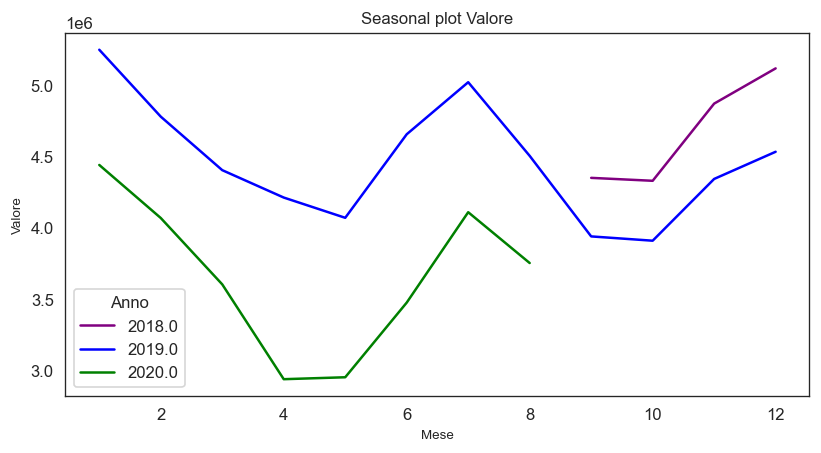

In [88]:
#Vado ad osservare la stagionalità:
plt.figure(figsize=(8, 4))
sns.lineplot(dati['Mese'].astype(float), dati['Valore'].astype(float), hue=dati['Anno'].astype(float), ci=None, palette=["purple","blue","green"])
plt.title('Seasonal plot Valore', fontsize = 10, loc='center')
plt.xlabel('Mese', fontsize = 8)
plt.ylabel('Valore', fontsize = 8)
plt.show()

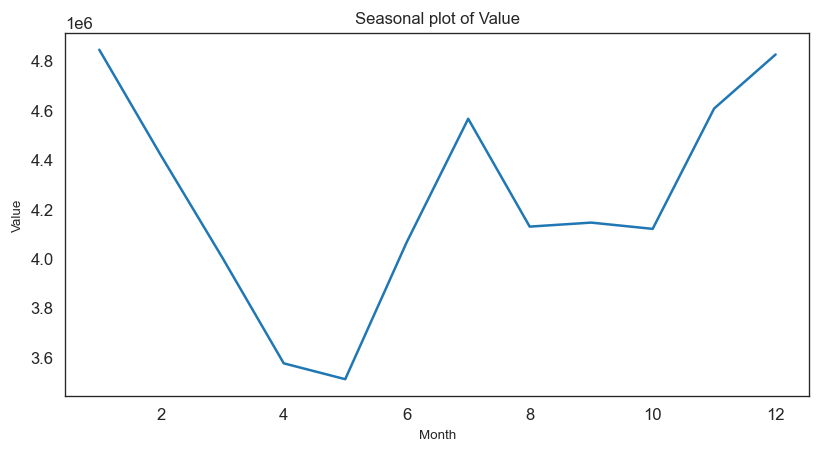

In [89]:
#Vado ad osservare la stagionalità:
plt.figure(figsize=(8, 4))
sns.lineplot(dati['Mese'].astype(float), dati['Valore'].astype(float), data=dati['Anno'].astype(float), ci = None)
plt.title('Seasonal plot of Value', fontsize = 10, loc='center')
plt.xlabel('Month', fontsize = 8)
plt.ylabel('Value', fontsize = 8)
plt.show()
#Osserviamo la crescita durante l'anno nel corso dei mesi sommando tutti i valori di value:

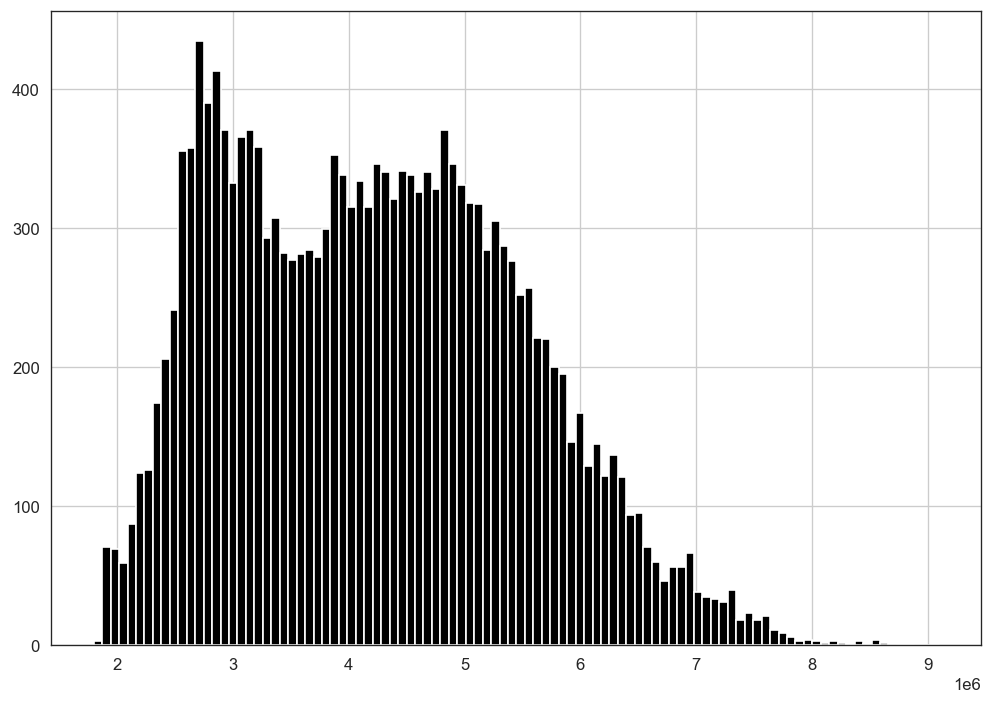

In [93]:
#Per capire meglio la distribuzione della feature "Valore"
test_dati_viz = pd.DataFrame(dati["Valore"])
test_dati_viz["Valore"].hist(color="black", bins=100);

In [94]:
ts = dati.groupby("DataeOra")["Valore"]
ts.head()

DataeOra
2018-09-01 00:00:00    3646742.0
2018-09-01 01:00:00    3273110.0
2018-09-01 02:00:00    3069245.0
2018-09-01 03:00:00    2969621.0
2018-09-01 04:00:00    2944116.0
                         ...    
2020-08-31 19:00:00    4284919.0
2020-08-31 20:00:00    4400006.0
2020-08-31 21:00:00    3965396.0
2020-08-31 22:00:00    3442262.0
2020-08-31 23:00:00    2932544.0
Name: Valore, Length: 17544, dtype: float64

Info prese da: https://towardsdatascience.com/time-series-in-python-exponential-smoothing-and-arima-processes-2c67f2a52788 

# Modelli Arima

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import pmdarima
# time series analysis
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf #per me non servono!!
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.deterministic import DeterministicProcess
import warnings
warnings.filterwarnings('ignore')

In [3]:
#Definisco una funzione per il kpss_test:
def kpss_test(series, **kw):    
    statistic, p_value, n_lags, critical_values = kpss(series, **kw)
    # Format Output
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    print(f'Result: The series is {"not " if p_value < 0.05 else ""}stationary')

In [8]:
dati=pd.read_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/dati_preprocessati.csv', header=0, low_memory=False, parse_dates=['DataeOra'])
dati.set_index('DataeOra', inplace=True)
dati.index.freq='H'
dati.head()

,Data,Ora,Valore,Mese,Giorno,Anno,Giornosettimana
DataeOra,,,,,,,
2018-09-01 00:00:00,2018-09-01,0,3646742.0,9,1,2018,Saturday
2018-09-01 01:00:00,2018-09-01,1,3273110.0,9,1,2018,Saturday
2018-09-01 02:00:00,2018-09-01,2,3069245.0,9,1,2018,Saturday
2018-09-01 03:00:00,2018-09-01,3,2969621.0,9,1,2018,Saturday
2018-09-01 04:00:00,2018-09-01,4,2944116.0,9,1,2018,Saturday


In [5]:
#Train / validation split
train_dati = dati.loc[:"2020-04-23 23:00:00"]
print("Numero di elementi presenti nel train: ", len(train_dati))
validation_dati = dati.loc["2020-04-24 00:00:00":]
print("Numero di elementi presenti nel validation: ", len(validation_dati))

Numero di elementi presenti nel train:  2021
Numero di elementi presenti nel validation:  15497


## Verificare la Stazionarietà

<AxesSubplot:>

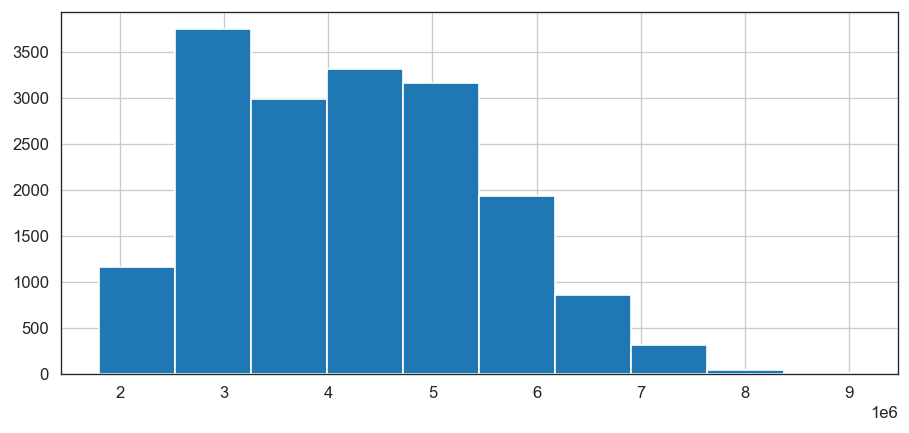

In [109]:
plt.figure(figsize=(9, 4))
dati["Valore"].hist()

In [110]:
#Test opzionale per vedere se la varianza e media variano nel tempo:
X = dati["Valore"].values
split = round(len(X) / 2)
X1, X2 = X[0:split], X[split:]
mean1, mean2 = X1.mean(), X2.mean()
var1, var2 = X1.var(), X2.var()
print('mean1=%f, mean2=%f' % (mean1, mean2))
print('variance1=%f, variance2=%f' % (var1, var2))

mean1=4627699.066689, mean2=3839093.460214
variance1=1607061437346.171387, variance2=1251632563571.640869


In [171]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    #Determing rolling statistics
    rolmean = timeseries.rolling(24).mean()
    rolstd = timeseries.rolling(24).std()
    #Plot rolling statistics:
    fig = plt.figure(figsize=(12, 8))
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show()

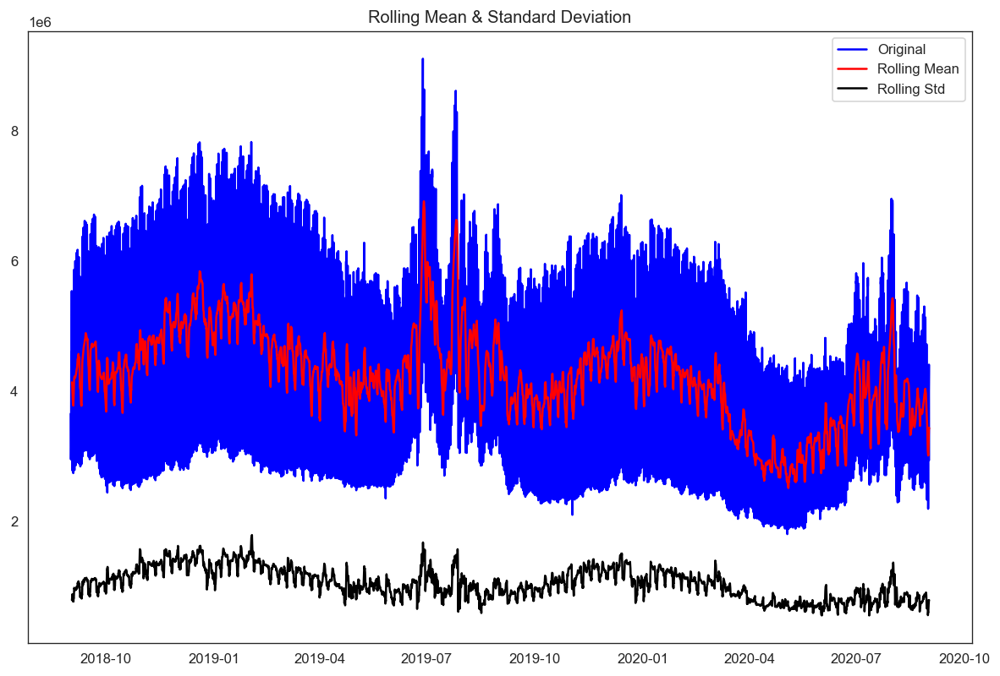

In [167]:
test_stationarity(dati.Valore)

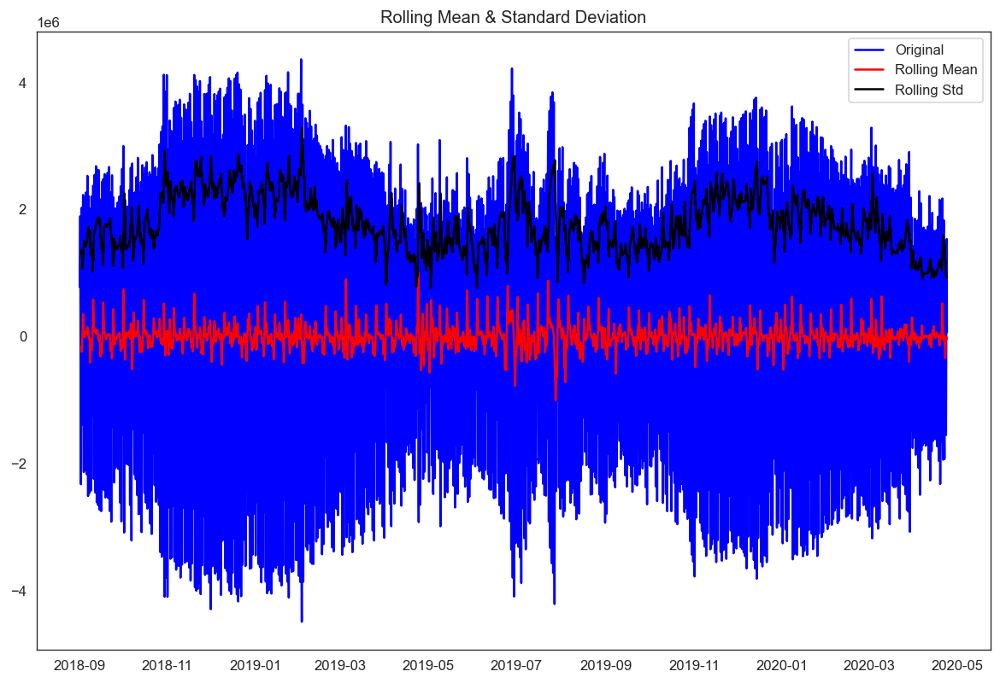

In [175]:
train_dati["Valore_diff"] = train_dati["Valore"] - train_dati["Valore"].shift(12)
test_stationarity(train_dati.Valore_diff)

#### Risorse Dickey-Fuller python: https://www.youtube.com/watch?v=bP1fbXd_XSk , https://www.youtube.com/watch?v=warCSvy1DMk

In [114]:
#[PER PRIMA COSA UTILIZZO IL TEST DICKEY - FULLER]
datitestdf = adfuller(train_dati["Valore"])
print("Valori risultato:")
print(datitestdf)
print("------------------------")
print("ADF statistic: %f" % datitestdf[0])
print("p-value: %f" % datitestdf[1])
print("Critical Values:")
for key,value in datitestdf[4].items():
      print("\t%s: %.3f" % (key, value))

if datitestdf[0] < datitestdf[4]["5%"]:
    print ("Reject Ho - Time Series is Stationary")
else:
    print ("Failed to Reject Ho - Time Series is Non-Stationary")
#Valore 0 del p-value ma perchè è veramente di piccolo valore

Valori risultato:
(-5.925080543755828, 2.454543900941714e-07, 42, 14381, {'1%': -3.4308047992224897, '5%': -2.861741000946377, '10%': -2.566876988062525}, 373548.482116547)
------------------------
ADF statistic: -5.925081
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Reject Ho - Time Series is Stationary


#### Risorse per Kpss: https://www.machinelearningplus.com/time-series/kpss-test-for-stationarity/

In [115]:
kpss_test(train_dati["Valore"])

KPSS Statistic: 8.234963053484819
p-value: 0.01
num lags: 42
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary


#### Rendere una serie storica stazionaria, risorse: https://www.analyticsvidhya.com/blog/2018/09/non-stationary-time-series-python/, https://kanoki.org/2020/04/30/time-series-analysis-and-forecasting-with-arima-python/

In [13]:
#Applico la differenza di 24 periodi:
train_dati["Valore_diff"] = train_dati["Valore"] - train_dati["Valore"].shift(24)

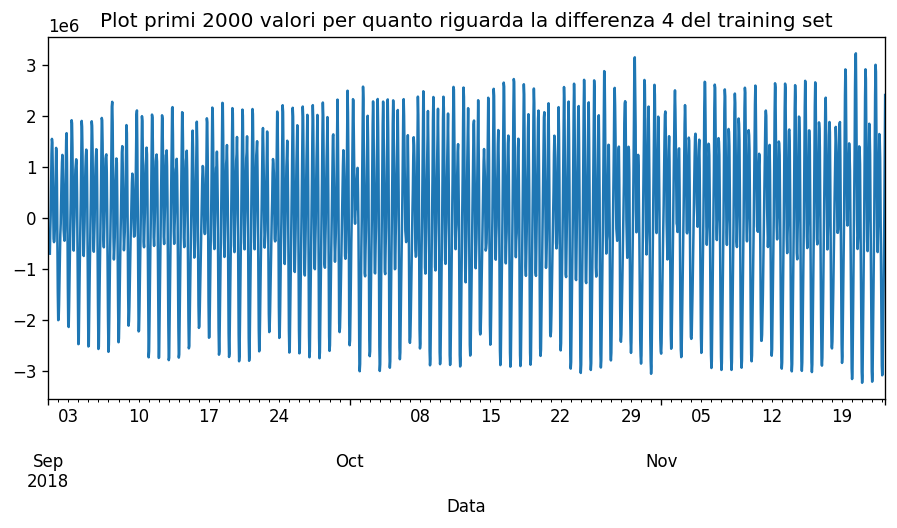

In [14]:
#Osservo applicando la differenza di 4
plt.figure(figsize=(9, 4))
plt.title("Plot primi 2000 valori per quanto riguarda la differenza 4 del training set")
train_dati["Valore_diff"][:2000] = train_dati["Valore"][:2000] - train_dati["Valore"][:2000].shift(4).dropna()
train_dati["Valore_diff"][:2000].plot()
plt.xlabel("Data");

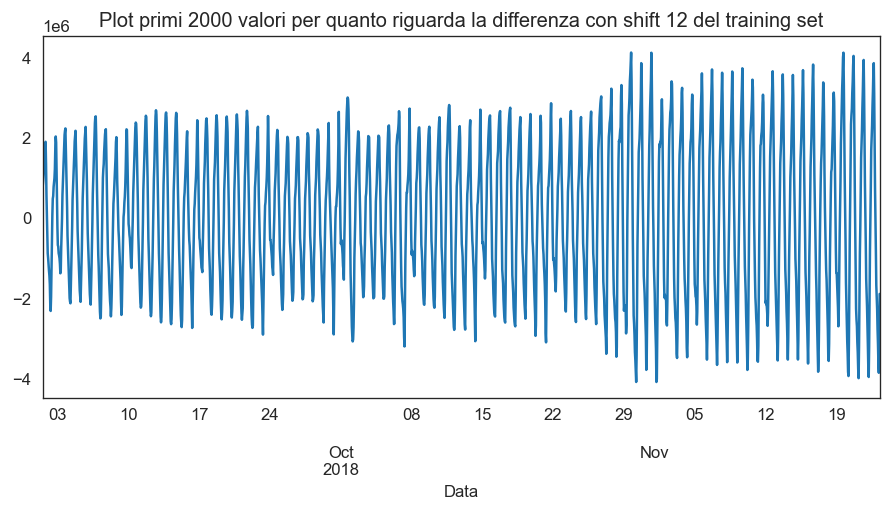

In [118]:
#Calcolo la differenza stagionale con shift 12:
plt.figure(figsize=(9, 4))
plt.title("Plot primi 2000 valori per quanto riguarda la differenza con shift 12 del training set")
train_dati["Valore_diff"][:2000] = train_dati["Valore"][:2000] - train_dati["Valore"][:2000].shift(12)
train_dati["Valore_diff"][:2000].dropna().plot()
plt.xlabel("Data");

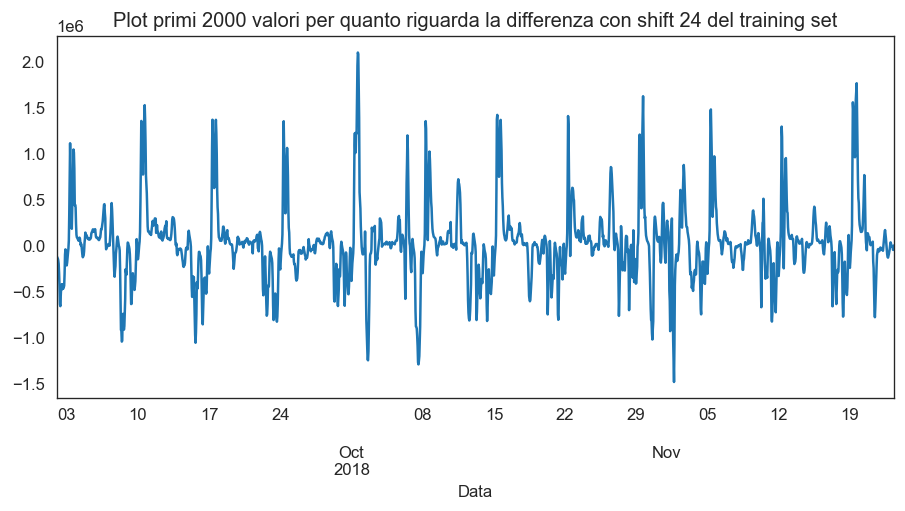

In [119]:
#Applico la differenza stagionale con shift 24
plt.figure(figsize=(9, 4))
plt.title("Plot primi 2000 valori per quanto riguarda la differenza con shift 24 del training set")
train_dati["Valore_diff"][:2000] = train_dati["Valore"][:2000] - train_dati["Valore"][:2000].shift(24)
train_dati["Valore_diff"][:2000].dropna().plot()
plt.xlabel("Data");

In [120]:
#Calcolo adf però sui valori calcolati tramite differenza di 24:
datitestdf = adfuller(train_dati["Valore_diff"].dropna())
print("Valori risultato:")
print(datitestdf)
print("------------------------")
print("ADF statistic: %f" % datitestdf[0])
print("p-value: %f" % datitestdf[1])
print("Critical Values:")
for key,value in datitestdf[4].items():
      print("\t%s: %.3f" % (key, value))

if datitestdf[0] < datitestdf[4]["5%"]:
    print ("Reject Ho - Time Series is Stationary")
else:
    print ("Failed to Reject Ho - Time Series is Non-Stationary")

Valori risultato:
(-22.324515362942293, 0.0, 42, 14357, {'1%': -3.430805559627438, '5%': -2.861741336985628, '10%': -2.5668771669327635}, 373057.924978197)
------------------------
ADF statistic: -22.324515
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Reject Ho - Time Series is Stationary


In [121]:
#Calcolo kpss però sui valori calcolati tramite differenza di 24:
kpss_test(train_dati["Valore_diff"].dropna())

KPSS Statistic: 0.0213671643845622
p-value: 0.1
num lags: 42
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is stationary


## ACF

#### Risorse Acf: https://machinelearningmastery.com/gentle-introduction-autocorrelation-partial-autocorrelation/

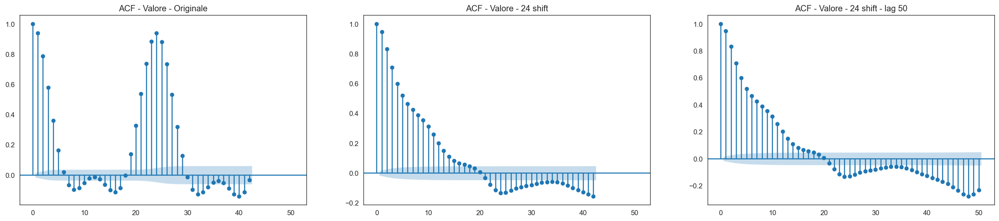

In [122]:
#Visualizzazione ACF:
from statsmodels.graphics.tsaplots import plot_acf
plt.rcParams.update({'figure.figsize':(25,5)})
fig1, axes1 = plt.subplots(1, 3, sharex=True)
plot_acf(train_dati['Valore'], ax=axes1[0])
axes1[0].set_title('ACF - Valore - Originale')
plot_acf(train_dati['Valore_diff'].dropna(), ax=axes1[1])
axes1[1].set_title('ACF - Valore - 24 shift')
plot_acf(train_dati['Valore_diff'].dropna(), ax=axes1[2], lags=50)
axes1[2].set_title('ACF - Valore - 24 shift - lag 50')
plt.show()

## PACF

#### Risorse Pacf: https://machinelearningmastery.com/gentle-introduction-autocorrelation-partial-autocorrelation/

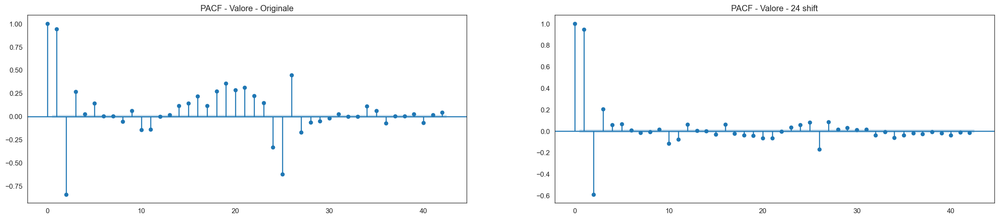

In [123]:
#Visualizzazione PACF:
from statsmodels.graphics.tsaplots import plot_pacf
plt.rcParams.update({'figure.figsize':(25,5)})
fig1, axes1 = plt.subplots(1, 2, sharex=True)
plot_pacf(train_dati['Valore'], ax=axes1[0])
axes1[0].set_title('PACF - Valore - Originale')
plot_pacf(train_dati['Valore_diff'].dropna(), ax=axes1[1])
axes1[1].set_title('PACF - Valore - 24 shift')
plt.show()

# Modello SARIMAX

#### Risorse utilizzate: https://www.statsmodels.org/stable/statespace.html, https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/, https://www.statsmodels.org/devel/examples/notebooks/generated/statespace_sarimax_stata.html?highlight=sarimax, https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/

## Test per varie impostazioni SARIMAX:

### Applico un approccio "grid search" ma manuale per selezionare il modello migliore. Non è stata applicata la forma logaritmica

In [128]:
%%time
#Modello:
model_1_sarimax = sm.tsa.statespace.SARIMAX(train_dati['Valore'], order=(0, 0, 0), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_1_sarimax = model_1_sarimax.fit(disp=0, low_memory=True)
min_1 = model_1_sarimax.loglikelihood_burn
#Train:
predicted_train_1 = fit_model_1_sarimax.get_prediction(start=train_dati.index[0], end=train_dati.index[-1])
predicted_train_1_mean = predicted_train_1.predicted_mean
mae_train_1 = np.mean(np.abs(predicted_train_1_mean - train_dati['Valore']))
mape_train_1 = np.mean(np.abs(predicted_train_1_mean - train_dati['Valore'][min_1:])/np.abs(train_dati['Valore'][min_1:]))
residui_train_1=train_dati['Valore'][min_1:]-predicted_train_1_mean
#Validation
predicted_val_1 = fit_model_1_sarimax.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_1_mean = predicted_val_1.predicted_mean
mae_val_1 = np.mean(np.abs(predicted_val_1_mean - validation_dati['Valore']))
mape_val_1 = np.mean(np.abs(predicted_val_1_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_1=validation_dati['Valore']-predicted_val_1_mean
#Print informazioni modello:
print("SARIMAX(0,0,0)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_1_sarimax.aic)
print("--------------------")
print("MAE train: ", mae_train_1)
print("MAPE train: ", mape_train_1)
print("--------------------")
print("MAE train: ", mae_val_1)
print("MAPE train: ", mape_val_1)

SARIMAX(0,0,0)(1,1,1)24
--------------------
AIC:  412513.96913490613
--------------------
MAE train:  285325.0148498014
MAPE train:  0.06201742308984951
--------------------
MAE train:  695463.8319063875
MAPE train:  0.18180272879624332
CPU times: user 1min 3s, sys: 5.54 s, total: 1min 8s
Wall time: 33.6 s


In [139]:
%%time
#Modello:
model_2_sarimax = sm.tsa.statespace.SARIMAX(train_dati['Valore'], order=(0, 0, 1), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_2_sarimax = model_2_sarimax.fit(disp=0, low_memory=True)
min_2 = model_2_sarimax.loglikelihood_burn
#Train:
predicted_train_2 = fit_model_2_sarimax.get_prediction(start=train_dati.index[0], end=train_dati.index[-1])
predicted_train_2_mean = predicted_train_2.predicted_mean
mae_train_2 = np.mean(np.abs(predicted_train_2_mean - train_dati['Valore']))
mape_train_2 = np.mean(np.abs(predicted_train_2_mean - train_dati['Valore'][min_2:])/np.abs(train_dati['Valore'][min_2:]))
residui_train_2=train_dati['Valore'][min_2:]-predicted_train_2_mean
#Validation
predicted_val_2 = fit_model_2_sarimax.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_2_mean = predicted_val_2.predicted_mean
mae_val_2 = np.mean(np.abs(predicted_val_2_mean - validation_dati['Valore']))
mape_val_2 = np.mean(np.abs(predicted_val_2_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_2=validation_dati['Valore']-predicted_val_2_mean
#Print informazioni modello:
print("SARIMAX(0,0,1)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_2_sarimax.aic)
print("--------------------")
print("MAE train: ", mae_train_2)
print("MAPE train: ", mape_train_2)
print("--------------------")
print("MAE train: ", mae_val_2)
print("MAPE train: ", mape_val_2)

SARIMAX(0,0,1)(1,1,1)24
--------------------
AIC:  401794.39229235786
--------------------
MAE train:  163874.84468772038
MAPE train:  0.0361536028310898
--------------------
MAE train:  697831.1283643247
MAPE train:  0.18236378814688423
CPU times: user 2min 1s, sys: 8.21 s, total: 2min 9s
Wall time: 1min 10s


In [140]:
%%time
#Modello:
model_3_sarimax = sm.tsa.statespace.SARIMAX(train_dati['Valore'], order=(0, 0, 2), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_3_sarimax = model_3_sarimax.fit(disp=0, low_memory=True)
min_3 = model_3_sarimax.loglikelihood_burn
#Train:
predicted_train_3 = fit_model_3_sarimax.get_prediction(start=train_dati.index[0], end=train_dati.index[-1])
predicted_train_3_mean = predicted_train_3.predicted_mean
mae_train_3 = np.mean(np.abs(predicted_train_3_mean - train_dati['Valore'][min_3:]))
mape_train_3 = np.mean(np.abs(predicted_train_3_mean - train_dati['Valore'][min_3:])/np.abs(train_dati['Valore'][min_3:]))
residui_train_3=train_dati['Valore'][min_3:]-predicted_train_3_mean
#Validation
predicted_val_3 = fit_model_3_sarimax.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_3_mean = predicted_val_3.predicted_mean
mae_val_3 = np.mean(np.abs(predicted_val_3_mean - validation_dati['Valore']))
mape_val_3 = np.mean(np.abs(predicted_val_3_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_3=validation_dati['Valore']-predicted_val_3_mean
#Print informazioni modello:
print("SARIMAX(0,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_3_sarimax.aic)
print("--------------------")
print("MAE train: ", mae_train_3)
print("MAPE train: ", mape_train_3)
print("--------------------")
print("MAE validation: ", mae_val_3)
print("MAPE validation: ", mape_val_3)

SARIMAX(0,0,2)(1,1,1)24
--------------------
AIC:  396150.1953234556
--------------------
MAE train:  110570.02165374359
MAPE train:  0.025753053516401572
--------------------
MAE validation:  697338.9058407604
MAPE validation:  0.18221923931388737
CPU times: user 2min 53s, sys: 14.7 s, total: 3min 8s
Wall time: 1min 31s


In [141]:
%%time
#Modello:
model_4_sarimax = sm.tsa.statespace.SARIMAX(train_dati['Valore'], order=(2, 0, 0), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_4_sarimax = model_4_sarimax.fit(disp=0, low_memory=True)
min_4 = model_4_sarimax.loglikelihood_burn
#Train:
predicted_train_4 = fit_model_4_sarimax.get_prediction(start=train_dati.index[0], end=train_dati.index[-1])
predicted_train_4_mean = predicted_train_4.predicted_mean
mae_train_4 = np.mean(np.abs(predicted_train_4_mean - train_dati['Valore'][min_4:]))
mape_train_4 = np.mean(np.abs(predicted_train_4_mean - train_dati['Valore'][min_4:])/np.abs(train_dati['Valore'][min_4:]))
residui_train_4=train_dati['Valore'][min_4:]-predicted_train_4_mean
#Validation
predicted_val_4 = fit_model_4_sarimax.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_4_mean = predicted_val_4.predicted_mean
mae_val_4 = np.mean(np.abs(predicted_val_4_mean - validation_dati['Valore']))
mape_val_4 = np.mean(np.abs(predicted_val_4_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_4=validation_dati['Valore']-predicted_val_4_mean
#Print informazioni modello:
print("SARIMAX(2,0,0)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_4_sarimax.aic)
print("--------------------")
print("MAE train: ", mae_train_4)
print("MAPE train: ", mape_train_4)
print("--------------------")
print("MAE validation: ", mae_val_4)
print("MAPE validation: ", mape_val_4)

SARIMAX(2,0,0)(1,1,1)24
--------------------
AIC:  373382.041967345
--------------------
MAE train:  67308.02709345777
MAPE train:  0.015628670231243216
--------------------
MAE validation:  688849.0281136713
MAPE validation:  0.18047275250729308
CPU times: user 2min 53s, sys: 13.6 s, total: 3min 7s
Wall time: 1min 38s


In [142]:
%%time
#Modello:
model_5_sarimax = sm.tsa.statespace.SARIMAX(train_dati['Valore'], order=(2, 0, 1), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_5_sarimax = model_5_sarimax.fit(disp=0, low_memory=True)
min_5 = model_5_sarimax.loglikelihood_burn
#Train:
predicted_train_5 = fit_model_5_sarimax.get_prediction(start=train_dati.index[0], end=train_dati.index[-1])
predicted_train_5_mean = predicted_train_5.predicted_mean
mae_train_5 = np.mean(np.abs(predicted_train_5_mean - train_dati['Valore'][min_5:]))
mape_train_5 = np.mean(np.abs(predicted_train_5_mean - train_dati['Valore'][min_5:])/np.abs(train_dati['Valore'][min_5:]))
residui_train_5=train_dati['Valore'][min_5:]-predicted_train_5_mean
#Validation
predicted_val_5 = fit_model_5_sarimax.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_5_mean = predicted_val_5.predicted_mean
mae_val_5 = np.mean(np.abs(predicted_val_5_mean - validation_dati['Valore']))
mape_val_5 = np.mean(np.abs(predicted_val_5_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_5=validation_dati['Valore']-predicted_val_5_mean
#Print informazioni modello:
print("SARIMAX(2,0,1)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_5_sarimax.aic)
print("--------------------")
print("MAE train: ", mae_train_5)
print("MAPE train: ", mape_train_5)
print("--------------------")
print("MAE validation: ", mae_val_5)
print("MAPE validation: ", mape_val_5)

SARIMAX(2,0,1)(1,1,1)24
--------------------
AIC:  372992.05140072963
--------------------
MAE train:  65868.88513278586
MAPE train:  0.015306031102209062
--------------------
MAE validation:  689606.9741797785
MAPE validation:  0.1806125562701369
CPU times: user 3min 47s, sys: 21.5 s, total: 4min 8s
Wall time: 2min 1s


In [143]:
%%time
#Modello:
model_6_sarimax = sm.tsa.statespace.SARIMAX(train_dati['Valore'], order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_6_sarimax = model_6_sarimax.fit(disp=0, low_memory=True)
min_6 = model_6_sarimax.loglikelihood_burn
#Train:
predicted_train_6 = fit_model_6_sarimax.get_prediction(start=train_dati.index[min_6], end=train_dati.index[-1])
predicted_train_6_mean = predicted_train_6.predicted_mean
mae_train_6 = np.mean(np.abs(predicted_train_6_mean - train_dati['Valore'][min_6:]))
mape_train_6 = np.mean(np.abs(predicted_train_6_mean - train_dati['Valore'][min_6:])/np.abs(train_dati['Valore'][min_6:]))
residui_train_6=train_dati['Valore'][min_6:]-predicted_train_6_mean
#Validation
predicted_val_6 = fit_model_6_sarimax.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_6_mean = predicted_val_6.predicted_mean
mae_val_6 = np.mean(np.abs(predicted_val_6_mean - validation_dati['Valore']))
mape_val_6 = np.mean(np.abs(predicted_val_6_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_6=validation_dati['Valore']-predicted_val_6_mean
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_6_sarimax.aic)
print("--------------------")
print("MAE train: ", mae_train_6)
print("MAPE train: ", mape_train_6)
print("--------------------")
print("MAE validation: ", mae_val_6)
print("MAPE validation: ", mape_val_6)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  372958.17654365074
--------------------
MAE train:  65678.63293216891
MAPE train:  0.015254060033557669
--------------------
MAE validation:  689695.5788572611
MAPE validation:  0.18063824061992928
CPU times: user 5min 31s, sys: 27.5 s, total: 5min 58s
Wall time: 2min 58s


In [146]:
%%time
#Modello:
model_7_sarimax = sm.tsa.statespace.SARIMAX(train_dati['Valore'], order=(1, 0, 0), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_7_sarimax = model_7_sarimax.fit(disp=0, low_memory=True)
min_7 = model_7_sarimax.loglikelihood_burn
#Train:
predicted_train_7 = fit_model_7_sarimax.get_prediction(start=train_dati.index[min_7], end=train_dati.index[-1])
predicted_train_7_mean = predicted_train_7.predicted_mean
mae_train_7 = np.mean(np.abs(predicted_train_7_mean - train_dati['Valore'][min_7:]))
mape_train_7 = np.mean(np.abs(predicted_train_7_mean - train_dati['Valore'][min_7:])/np.abs(train_dati['Valore'][min_7:]))
residui_train_7=train_dati['Valore'][min_7:]-predicted_train_7_mean
#Validation
predicted_val_7 = fit_model_7_sarimax.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_7_mean = predicted_val_7.predicted_mean
mae_val_7 = np.mean(np.abs(predicted_val_7_mean - validation_dati['Valore']))
mape_val_7 = np.mean(np.abs(predicted_val_7_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_7=validation_dati['Valore']-predicted_val_7_mean
#Print informazioni modello:
print("SARIMAX(1,0,0)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_7_sarimax.aic)
print("--------------------")
print("MAE train: ", mae_train_7)
print("MAPE train: ", mape_train_7)
print("--------------------")
print("MAE validation: ", mae_val_7)
print("MAPE validation: ", mape_val_7)

SARIMAX(1,0,0)(1,1,1)24
--------------------
AIC:  379067.62218629185
--------------------
MAE train:  85184.16836896914
MAPE train:  0.01970243335130847
--------------------
MAE validation:  685561.5762265184
MAPE validation:  0.17966014117628473
CPU times: user 2min 13s, sys: 10.1 s, total: 2min 23s
Wall time: 1min 18s


In [147]:
%%time
#Modello:
model_8_sarimax = sm.tsa.statespace.SARIMAX(train_dati['Valore'], order=(1, 0, 1), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_8_sarimax = model_8_sarimax.fit(disp=0, low_memory=True)
min_8 = model_8_sarimax.loglikelihood_burn
#Train:
predicted_train_8 = fit_model_8_sarimax.get_prediction(start=train_dati.index[min_8], end=train_dati.index[-1])
predicted_train_8_mean = predicted_train_8.predicted_mean
mae_train_8 = np.mean(np.abs(predicted_train_8_mean - train_dati['Valore'][min_8:]))
mape_train_8 = np.mean(np.abs(predicted_train_8_mean - train_dati['Valore'][min_8:])/np.abs(train_dati['Valore'][min_8:]))
residui_train_8=train_dati['Valore'][min_8:]-predicted_train_8_mean
#Validation
predicted_val_8 = fit_model_8_sarimax.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_8_mean = predicted_val_8.predicted_mean
mae_val_8 = np.mean(np.abs(predicted_val_8_mean - validation_dati['Valore']))
mape_val_8 = np.mean(np.abs(predicted_val_8_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_8=validation_dati['Valore']-predicted_val_8_mean
#Print informazioni modello:
print("SARIMAX(1,0,1)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_8_sarimax.aic)
print("--------------------")
print("MAE train: ", mae_train_8)
print("MAPE train: ", mape_train_8)
print("--------------------")
print("MAE validation: ", mae_val_8)
print("MAPE validation: ", mape_val_8)

SARIMAX(1,0,1)(1,1,1)24
--------------------
AIC:  374054.3499052885
--------------------
MAE train:  69983.96547361823
MAPE train:  0.01629352274878871
--------------------
MAE validation:  688809.4169235576
MAPE validation:  0.18038015068679075
CPU times: user 2min 28s, sys: 13.4 s, total: 2min 41s
Wall time: 1min 11s


In [148]:
%%time
#Modello:
model_9_sarimax = sm.tsa.statespace.SARIMAX(train_dati['Valore'], order=(1, 0, 2), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_9_sarimax = model_9_sarimax.fit(disp=0, low_memory=True)
min_9 = model_9_sarimax.loglikelihood_burn
#Train:
predicted_train_9 = fit_model_9_sarimax.get_prediction(start=train_dati.index[min_9], end=train_dati.index[-1])
predicted_train_9_mean = predicted_train_9.predicted_mean
mae_train_9 = np.mean(np.abs(predicted_train_9_mean - train_dati['Valore'][min_9:]))
mape_train_9 = np.mean(np.abs(predicted_train_9_mean - train_dati['Valore'][min_9:])/np.abs(train_dati['Valore'][min_9:]))
residui_train_9=train_dati['Valore'][min_9:]-predicted_train_9_mean
#Validation
predicted_val_9 = fit_model_9_sarimax.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_9_mean = predicted_val_9.predicted_mean
mae_val_9 = np.mean(np.abs(predicted_val_9_mean - validation_dati['Valore']))
mape_val_9 = np.mean(np.abs(predicted_val_9_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_9=validation_dati['Valore']-predicted_val_9_mean
#Print informazioni modello:
print("SARIMAX(1,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_9_sarimax.aic)
print("--------------------")
print("MAE train: ", mae_train_9)
print("MAPE train: ", mape_train_9)
print("--------------------")
print("MAE validation: ", mae_val_9)
print("MAPE validation: ", mape_val_9)

SARIMAX(1,0,2)(1,1,1)24
--------------------
AIC:  373165.4070475825
--------------------
MAE train:  66552.7481604238
MAPE train:  0.015468476472424731
--------------------
MAE validation:  689660.5733571894
MAPE validation:  0.18058102208723575
CPU times: user 3min 46s, sys: 31.3 s, total: 4min 17s
Wall time: 2min 19s


## Applico al modello la forma logaritmica, con lo stesso approccio precedente:

In [179]:
%%time
#Modello:
model_1_sarimax_log = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(0, 0, 0), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_1_sarimax_log = model_1_sarimax_log.fit(disp=0, low_memory=True)
min_1_log = model_1_sarimax_log.loglikelihood_burn
#Train:
predicted_train_1_log = fit_model_1_sarimax_log.get_prediction(start=train_dati.index[min_1_log], end=train_dati.index[-1])
predicted_train_1_mean_log = np.exp(predicted_train_1_log.predicted_mean)
mae_train_1_log = np.mean(np.abs(predicted_train_1_mean_log - train_dati['Valore'][min_1_log:]))
mape_train_1_log = np.mean(np.abs(predicted_train_1_mean_log - train_dati['Valore'][min_1_log:])/np.abs(train_dati['Valore'][min_1_log:]))
residui_train_1_log = train_dati['Valore'][min_1_log:] - predicted_train_1_mean_log
#Validation
predicted_val_1_log = fit_model_1_sarimax_log.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_1_mean_log = np.exp(predicted_val_1_log.predicted_mean)
mae_val_1_log = np.mean(np.abs(predicted_val_1_mean_log - validation_dati['Valore']))
mape_val_1_log = np.mean(np.abs(predicted_val_1_mean_log - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_1_log=validation_dati['Valore']-predicted_val_1_mean_log
#Print informazioni modello:
print("LOG - SARIMAX(0,0,0)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_1_sarimax_log.aic)
print("--------------------")
print("MAE train: ", mae_train_1_log)
print("MAPE train: ", mape_train_1_log)
print("--------------------")
print("MAE validation: ", mae_val_1_log)
print("MAPE validation: ", mape_val_1_log)

LOG - SARIMAX(0,0,0)(1,1,1)24
--------------------
AIC:  -29292.911616333535
--------------------
MAE train:  276194.73138084746
MAPE train:  0.06167477639146007
--------------------
MAE validation:  688041.4433513383
MAPE validation:  0.17989380801924892
CPU times: user 29.2 s, sys: 1.98 s, total: 31.2 s
Wall time: 24.8 s


In [180]:
%%time
#Modello:
model_2_sarimax_log = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(0, 0, 1), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_2_sarimax_log = model_2_sarimax_log.fit(disp=0, low_memory=True)
min_2_log = model_2_sarimax_log.loglikelihood_burn
#Train:
predicted_train_2_log = fit_model_2_sarimax_log.get_prediction(start=train_dati.index[min_2_log], end=train_dati.index[-1])
predicted_train_2_mean_log = np.exp(predicted_train_2_log.predicted_mean)
mae_train_2_log = np.mean(np.abs(predicted_train_2_mean_log - train_dati['Valore'][min_2_log:]))
mape_train_2_log = np.mean(np.abs(predicted_train_2_mean_log - train_dati['Valore'][min_2_log:])/np.abs(train_dati['Valore'][min_2_log:]))
residui_train_2_log = train_dati['Valore'][min_2_log:] - predicted_train_2_mean_log
#Validation
predicted_val_2_log = fit_model_2_sarimax_log.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_2_mean_log = np.exp(predicted_val_2_log.predicted_mean)
mae_val_2_log = np.mean(np.abs(predicted_val_2_mean_log - validation_dati['Valore']))
mape_val_2_log = np.mean(np.abs(predicted_val_2_mean_log - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_2_log=validation_dati['Valore']-predicted_val_2_mean_log
#Print informazioni modello:
print("LOG - SARIMAX(0,0,1)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_2_sarimax_log.aic)
print("--------------------")
print("MAE train: ", mae_train_2_log)
print("MAPE train: ", mape_train_2_log)
print("--------------------")
print("MAE validation: ", mae_val_2_log)
print("MAPE validation: ", mape_val_2_log)

LOG - SARIMAX(0,0,1)(1,1,1)24
--------------------
AIC:  -46049.86062475704
--------------------
MAE train:  152804.0204593785
MAPE train:  0.03445762618585959
--------------------
MAE validation:  687804.9414939845
MAPE validation:  0.17984131523942692
CPU times: user 1min 17s, sys: 2.81 s, total: 1min 20s
Wall time: 1min 9s


In [181]:
%%time
#Modello:
model_3_sarimax_log = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(0, 0, 2), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_3_sarimax_log = model_3_sarimax_log.fit(disp=0, low_memory=True)
min_3_log = model_3_sarimax_log.loglikelihood_burn
#Train:
predicted_train_3_log = fit_model_3_sarimax_log.get_prediction(start=train_dati.index[min_3_log], end=train_dati.index[-1])
predicted_train_3_mean_log = np.exp(predicted_train_3_log.predicted_mean)
mae_train_3_log = np.mean(np.abs(predicted_train_3_mean_log - train_dati['Valore'][min_3_log:]))
mape_train_3_log = np.mean(np.abs(predicted_train_3_mean_log - train_dati['Valore'][min_3_log:])/np.abs(train_dati['Valore'][min_3_log:]))
residui_train_3_log = train_dati['Valore'][min_3_log:] - predicted_train_3_mean_log
#Validation
predicted_val_3_log = fit_model_3_sarimax_log.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_3_mean_log = np.exp(predicted_val_3_log.predicted_mean)
mae_val_3_log = np.mean(np.abs(predicted_val_3_mean_log - validation_dati['Valore']))
mape_val_3_log = np.mean(np.abs(predicted_val_3_mean_log - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_3_log=validation_dati['Valore']-predicted_val_3_mean_log
#Print informazioni modello:
print("LOG - SARIMAX(0,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_3_sarimax_log.aic)
print("--------------------")
print("MAE train: ", mae_train_3_log)
print("MAPE train: ", mape_train_3_log)
print("--------------------")
print("MAE validation: ", mae_val_3_log)
print("MAPE validation: ", mape_val_3_log)

LOG - SARIMAX(0,0,2)(1,1,1)24
--------------------
AIC:  -56549.13500220018
--------------------
MAE train:  104836.06385208582
MAPE train:  0.023857265649729127
--------------------
MAE validation:  687503.9915787749
MAPE validation:  0.1797891114773321
CPU times: user 1min 31s, sys: 3.46 s, total: 1min 34s
Wall time: 1min 17s


In [152]:
%%time
#Modello:
model_4_sarimax_log = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(1, 0, 0), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_4_sarimax_log = model_4_sarimax_log.fit(disp=0, low_memory=True)
min_4_log = model_4_sarimax_log.loglikelihood_burn
#Train:
predicted_train_4_log = fit_model_4_sarimax_log.get_prediction(start=train_dati.index[min_4_log], end=train_dati.index[-1])
predicted_train_4_mean_log = np.exp(predicted_train_4_log.predicted_mean)
mae_train_4_log = np.mean(np.abs(predicted_train_4_mean_log - train_dati['Valore'][min_4_log:]))
mape_train_4_log = np.mean(np.abs(predicted_train_4_mean_log - train_dati['Valore'][min_4_log:])/np.abs(train_dati['Valore'][min_4_log:]))
residui_train_4_log = train_dati['Valore'][min_4_log:] - predicted_train_4_mean_log
#Validation
predicted_val_4_log = fit_model_4_sarimax_log.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_4_mean_log = np.exp(predicted_val_4_log.predicted_mean)
mae_val_4_log = np.mean(np.abs(predicted_val_4_mean_log - validation_dati['Valore']))
mape_val_4_log = np.mean(np.abs(predicted_val_4_mean_log - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_4_log=validation_dati['Valore']-predicted_val_4_mean_log
#Print informazioni modello:
print("LOG - SARIMAX(1,0,0)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_4_sarimax_log.aic)
print("--------------------")
print("MAE train: ", mae_train_4_log)
print("MAPE train: ", mape_train_4_log)
print("--------------------")
print("MAE validation: ", mae_val_4_log)
print("MAPE validation: ", mape_val_4_log)

LOG - SARIMAX(1,0,0)(1,1,1)24
--------------------
AIC:  -62600.04464362324
--------------------
MAE train:  82885.33949028407
MAPE train:  0.01878315575993667
--------------------
MAE validation:  679285.4541635319
MAPE validation:  0.1778437606792486
CPU times: user 54.1 s, sys: 2.08 s, total: 56.2 s
Wall time: 44.6 s


In [153]:
%%time
#Modello:
model_5_sarimax_log = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(1, 0, 1), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_5_sarimax_log = model_5_sarimax_log.fit(disp=0, low_memory=True)
min_5_log = model_5_sarimax_log.loglikelihood_burn
#Train:
predicted_train_5_log = fit_model_5_sarimax_log.get_prediction(start=train_dati.index[min_5_log], end=train_dati.index[-1])
predicted_train_5_mean_log = np.exp(predicted_train_5_log.predicted_mean)
mae_train_5_log = np.mean(np.abs(predicted_train_5_mean_log - train_dati['Valore'][min_5_log:]))
mape_train_5_log = np.mean(np.abs(predicted_train_5_mean_log - train_dati['Valore'][min_5_log:])/np.abs(train_dati['Valore'][min_5_log:]))
residui_train_5_log = train_dati['Valore'][min_5_log:] - predicted_train_5_mean_log
#Validation
predicted_val_5_log = fit_model_5_sarimax_log.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_5_mean_log = np.exp(predicted_val_5_log.predicted_mean)
mae_val_5_log = np.mean(np.abs(predicted_val_5_mean_log - validation_dati['Valore']))
mape_val_5_log = np.mean(np.abs(predicted_val_5_mean_log - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_5_log=validation_dati['Valore']-predicted_val_5_mean_log
#Print informazioni modello:
print("LOG - SARIMAX(1,0,1)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_5_sarimax_log.aic)
print("--------------------")
print("MAE train: ", mae_train_5_log)
print("MAPE train: ", mape_train_5_log)
print("--------------------")
print("MAE validation: ", mae_val_5_log)
print("MAPE validation: ", mape_val_5_log)

LOG - SARIMAX(1,0,1)(1,1,1)24
--------------------
AIC:  -67724.45499712911
--------------------
MAE train:  66755.4081465557
MAPE train:  0.015204574925633804
--------------------
MAE validation:  682798.4896110131
MAPE validation:  0.17871082205865757
CPU times: user 57.6 s, sys: 2.89 s, total: 1min
Wall time: 43.6 s


In [154]:
%%time
#Modello:
model_6_sarimax_log = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(1, 0, 2), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_6_sarimax_log = model_6_sarimax_log.fit(disp=0, low_memory=True)
min_6_log = model_6_sarimax_log.loglikelihood_burn
#Train:
predicted_train_6_log = fit_model_6_sarimax_log.get_prediction(start=train_dati.index[min_6_log], end=train_dati.index[-1])
predicted_train_6_mean_log = np.exp(predicted_train_6_log.predicted_mean)
mae_train_6_log = np.mean(np.abs(predicted_train_6_mean_log - train_dati['Valore'][min_6_log:]))
mape_train_6_log = np.mean(np.abs(predicted_train_6_mean_log - train_dati['Valore'][min_6_log:])/np.abs(train_dati['Valore'][min_6_log:]))
residui_train_6_log = train_dati['Valore'][min_6_log:] - predicted_train_6_mean_log
#Validation
predicted_val_6_log = fit_model_6_sarimax_log.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_6_mean_log = np.exp(predicted_val_6_log.predicted_mean)
mae_val_6_log = np.mean(np.abs(predicted_val_6_mean_log - validation_dati['Valore']))
mape_val_6_log = np.mean(np.abs(predicted_val_6_mean_log - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_6_log=validation_dati['Valore']-predicted_val_6_mean_log
#Print informazioni modello:
print("LOG - SARIMAX(1,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_6_sarimax_log.aic)
print("--------------------")
print("MAE train: ", mae_train_6_log)
print("MAPE train: ", mape_train_6_log)
print("--------------------")
print("MAE validation: ", mae_val_6_log)
print("MAPE validation: ", mape_val_6_log)

LOG - SARIMAX(1,0,2)(1,1,1)24
--------------------
AIC:  -68603.3676307445
--------------------
MAE train:  63261.95099990477
MAPE train:  0.014418093412347755
--------------------
MAE validation:  683518.5426551322
MAPE validation:  0.1788870082406636
CPU times: user 1min 38s, sys: 4.14 s, total: 1min 42s
Wall time: 1min 18s


In [155]:
%%time
#Modello:
model_7_sarimax_log = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 0), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_7_sarimax_log = model_7_sarimax_log.fit(disp=0, low_memory=True)
min_7_log = model_7_sarimax_log.loglikelihood_burn
#Train:
predicted_train_7_log = fit_model_7_sarimax_log.get_prediction(start=train_dati.index[min_7_log], end=train_dati.index[-1])
predicted_train_7_mean_log = np.exp(predicted_train_7_log.predicted_mean)
mae_train_7_log = np.mean(np.abs(predicted_train_7_mean_log - train_dati['Valore'][min_7_log:]))
mape_train_7_log = np.mean(np.abs(predicted_train_7_mean_log - train_dati['Valore'][min_7_log:])/np.abs(train_dati['Valore'][min_7_log:]))
residui_train_7_log = train_dati['Valore'][min_7_log:] - predicted_train_7_mean_log
#Validation
predicted_val_7_log = fit_model_7_sarimax_log.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_7_mean_log = np.exp(predicted_val_7_log.predicted_mean)
mae_val_7_log = np.mean(np.abs(predicted_val_7_mean_log - validation_dati['Valore']))
mape_val_7_log = np.mean(np.abs(predicted_val_7_mean_log - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_7_log=validation_dati['Valore']-predicted_val_7_mean_log
#Print informazioni modello:
print("LOG - SARIMAX(2,0,0)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_7_sarimax_log.aic)
print("--------------------")
print("MAE train: ", mae_train_7_log)
print("MAPE train: ", mape_train_7_log)
print("--------------------")
print("MAE validation: ", mae_val_7_log)
print("MAPE validation: ", mape_val_7_log)

LOG - SARIMAX(2,0,0)(1,1,1)24
--------------------
AIC:  -68199.807617144
--------------------
MAE train:  64515.85062416762
MAPE train:  0.014675098217418484
--------------------
MAE validation:  682329.1150412397
MAPE validation:  0.17860827270114168
CPU times: user 1min 10s, sys: 2.96 s, total: 1min 13s
Wall time: 56.6 s


In [156]:
%%time
#Modello:
model_8_sarimax_log = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 1), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_8_sarimax_log = model_8_sarimax_log.fit(disp=0, low_memory=True)
min_8_log = model_8_sarimax_log.loglikelihood_burn
#Train:
predicted_train_8_log = fit_model_8_sarimax_log.get_prediction(start=train_dati.index[min_8_log], end=train_dati.index[-1])
predicted_train_8_mean_log = np.exp(predicted_train_8_log.predicted_mean)
mae_train_8_log = np.mean(np.abs(predicted_train_8_mean_log - train_dati['Valore'][min_8_log:]))
mape_train_8_log = np.mean(np.abs(predicted_train_8_mean_log - train_dati['Valore'][min_8_log:])/np.abs(train_dati['Valore'][min_8_log:]))
residui_train_8_log = train_dati['Valore'][min_8_log:] - predicted_train_8_mean_log
#Validation
predicted_val_8_log = fit_model_8_sarimax_log.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_8_mean_log = np.exp(predicted_val_8_log.predicted_mean)
mae_val_8_log = np.mean(np.abs(predicted_val_8_mean_log - validation_dati['Valore']))
mape_val_8_log = np.mean(np.abs(predicted_val_8_mean_log - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_8_log=validation_dati['Valore']-predicted_val_8_mean_log
#Print informazioni modello:
print("LOG - SARIMAX(2,0,1)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_8_sarimax_log.aic)
print("--------------------")
print("MAE train: ", mae_train_8_log)
print("MAPE train: ", mape_train_8_log)
print("--------------------")
print("MAE validation: ", mae_val_8_log)
print("MAPE validation: ", mape_val_8_log)

LOG - SARIMAX(2,0,1)(1,1,1)24
--------------------
AIC:  -68612.62870395258
--------------------
MAE train:  62786.02229726101
MAPE train:  0.014300619139143218
--------------------
MAE validation:  683677.5249737346
MAPE validation:  0.178937056692874
CPU times: user 1min 31s, sys: 3.99 s, total: 1min 35s
Wall time: 1min 12s


In [157]:
%%time
#Modello:
model_9_sarimax_log = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = None, enforce_stationarity=False, enforce_invertibility=False)
fit_model_9_sarimax_log = model_9_sarimax_log.fit(disp=0, low_memory=True)
min_9_log = model_9_sarimax_log.loglikelihood_burn
#Train:
predicted_train_9_log = fit_model_9_sarimax_log.get_prediction(start=train_dati.index[min_9_log], end=train_dati.index[-1])
predicted_train_9_mean_log = np.exp(predicted_train_9_log.predicted_mean)
mae_train_9_log = np.mean(np.abs(predicted_train_9_mean_log - train_dati['Valore'][min_9_log:]))
mape_train_9_log = np.mean(np.abs(predicted_train_9_mean_log - train_dati['Valore'][min_9_log:])/np.abs(train_dati['Valore'][min_9_log:]))
residui_train_9_log = train_dati['Valore'][min_9_log:] - predicted_train_9_mean_log
#Validation
predicted_val_9_log = fit_model_9_sarimax_log.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= None)
predicted_val_9_mean_log = np.exp(predicted_val_9_log.predicted_mean)
mae_val_9_log = np.mean(np.abs(predicted_val_9_mean_log - validation_dati['Valore']))
mape_val_9_log = np.mean(np.abs(predicted_val_9_mean_log - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_9_log=validation_dati['Valore']-predicted_val_9_mean_log
#Print informazioni modello:
print("LOG - SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_9_sarimax_log.aic)
print("--------------------")
print("MAE train: ", mae_train_9_log)
print("MAPE train: ", mape_train_9_log)
print("--------------------")
print("MAE validation: ", mae_val_9_log)
print("MAPE validation: ", mape_val_9_log)

LOG - SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -68685.07238952773
--------------------
MAE train:  62577.781254556445
MAPE train:  0.014258331823173287
--------------------
MAE validation:  683904.206412366
MAPE validation:  0.17898782307555836
CPU times: user 2min 12s, sys: 5.3 s, total: 2min 18s
Wall time: 1min 46s


### Risultati del MAE sul training set e sul validation set, tramite visualizzazioni di istogrammi

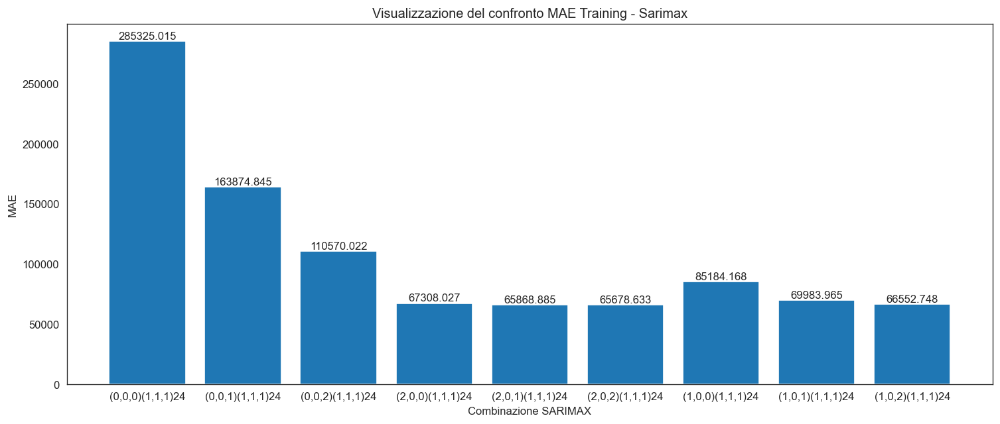

In [177]:
# SARIMAX VALORI DEL MAE 
plt.figure(figsize=(15,6)) 
height = [mae_train_1,mae_train_2,mae_train_3, mae_train_4, mae_train_5, mae_train_6, mae_train_7, mae_train_8, mae_train_9]
bars = ('(0,0,0)(1,1,1)24', '(0,0,1)(1,1,1)24', '(0,0,2)(1,1,1)24', '(2,0,0)(1,1,1)24', '(2,0,1)(1,1,1)24', '(2,0,2)(1,1,1)24', '(1,0,0)(1,1,1)24', '(1,0,1)(1,1,1)24', '(1,0,2)(1,1,1)24')
y_pos = np.arange(len(bars))
plt.bar(y_pos, height)
plt.text(0, height[0], round(mae_train_1, 3), ha = "center", va = "bottom")
plt.text(1, height[1], round(mae_train_2, 3), ha = "center", va = "bottom")
plt.text(2, height[2], round(mae_train_3, 3), ha = "center", va = "bottom")
plt.text(3, height[3], round(mae_train_4, 3), ha = "center", va = "bottom")
plt.text(4, height[4], round(mae_train_5, 3), ha = "center", va = "bottom")
plt.text(5, height[5], round(mae_train_6, 3), ha = "center", va = "bottom")
plt.text(6, height[6], round(mae_train_7, 3), ha = "center", va = "bottom")
plt.text(7, height[7], round(mae_train_8, 3), ha = "center", va = "bottom")
plt.text(8, height[8], round(mae_train_9, 3), ha = "center", va = "bottom")
plt.xticks(y_pos, bars)
plt.title("Visualizzazione del confronto MAE Training - Sarimax")
plt.xlabel("Combinazione SARIMAX")
plt.ylabel("MAE")
plt.show()

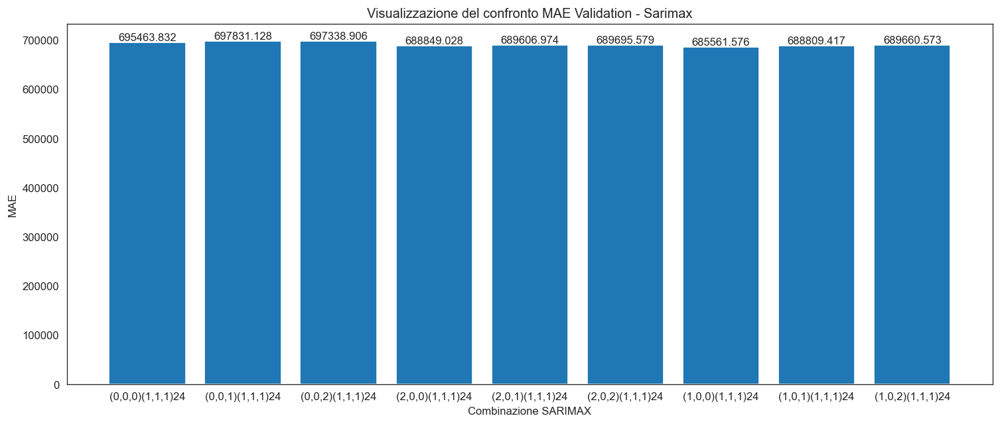

In [178]:
# SARIMAX VALORI DEL MAE 
plt.figure(figsize=(15,6)) 
height = [mae_val_1,mae_val_2,mae_val_3, mae_val_4, mae_val_5, mae_val_6, mae_val_7, mae_val_8, mae_val_9]
bars = ('(0,0,0)(1,1,1)24', '(0,0,1)(1,1,1)24', '(0,0,2)(1,1,1)24', '(2,0,0)(1,1,1)24', '(2,0,1)(1,1,1)24', '(2,0,2)(1,1,1)24', '(1,0,0)(1,1,1)24', '(1,0,1)(1,1,1)24', '(1,0,2)(1,1,1)24')
y_pos = np.arange(len(bars))
plt.bar(y_pos, height)
plt.text(0, height[0], round(mae_val_1, 3), ha = "center", va = "bottom")
plt.text(1, height[1], round(mae_val_2, 3), ha = "center", va = "bottom")
plt.text(2, height[2], round(mae_val_3, 3), ha = "center", va = "bottom")
plt.text(3, height[3], round(mae_val_4, 3), ha = "center", va = "bottom")
plt.text(4, height[4], round(mae_val_5, 3), ha = "center", va = "bottom")
plt.text(5, height[5], round(mae_val_6, 3), ha = "center", va = "bottom")
plt.text(6, height[6], round(mae_val_7, 3), ha = "center", va = "bottom")
plt.text(7, height[7], round(mae_val_8, 3), ha = "center", va = "bottom")
plt.text(8, height[8], round(mae_val_9, 3), ha = "center", va = "bottom")
plt.xticks(y_pos, bars)
plt.title("Visualizzazione del confronto MAE Validation - Sarimax")
plt.xlabel("Combinazione SARIMAX")
plt.ylabel("MAE")
plt.show()

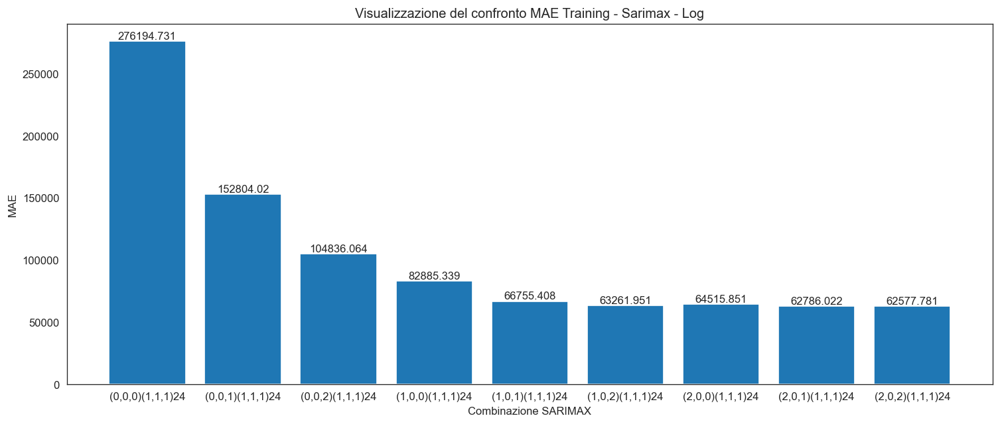

In [182]:
#SARIMAX VALORI DEL MAE - LOG
plt.figure(figsize=(15,6)) 
height = [mae_train_1_log,mae_train_2_log,mae_train_3_log, mae_train_4_log, mae_train_5_log, mae_train_6_log, mae_train_7_log, mae_train_8_log, mae_train_9_log]
bars = ('(0,0,0)(1,1,1)24', '(0,0,1)(1,1,1)24', '(0,0,2)(1,1,1)24', '(1,0,0)(1,1,1)24', '(1,0,1)(1,1,1)24', '(1,0,2)(1,1,1)24', '(2,0,0)(1,1,1)24', '(2,0,1)(1,1,1)24', '(2,0,2)(1,1,1)24')
y_pos = np.arange(len(bars))
plt.bar(y_pos, height)
plt.text(0, height[0], round(mae_train_1_log, 3), ha = "center", va = "bottom")
plt.text(1, height[1], round(mae_train_2_log, 3), ha = "center", va = "bottom")
plt.text(2, height[2], round(mae_train_3_log, 3), ha = "center", va = "bottom")
plt.text(3, height[3], round(mae_train_4_log, 3), ha = "center", va = "bottom")
plt.text(4, height[4], round(mae_train_5_log, 3), ha = "center", va = "bottom")
plt.text(5, height[5], round(mae_train_6_log, 3), ha = "center", va = "bottom")
plt.text(6, height[6], round(mae_train_7_log, 3), ha = "center", va = "bottom")
plt.text(7, height[7], round(mae_train_8_log, 3), ha = "center", va = "bottom")
plt.text(8, height[8], round(mae_train_9_log, 3), ha = "center", va = "bottom")
plt.xticks(y_pos, bars)
plt.title("Visualizzazione del confronto MAE Training - Sarimax - Log")
plt.xlabel("Combinazione SARIMAX")
plt.ylabel("MAE")
plt.show()

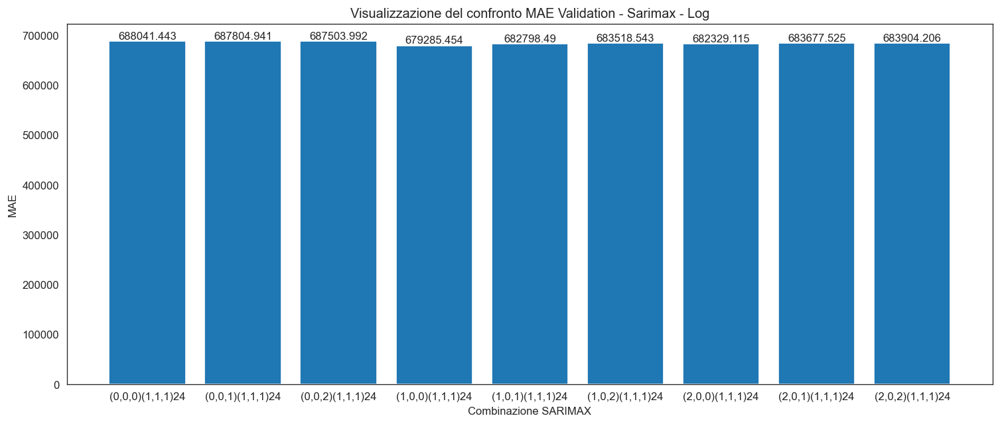

In [184]:
#SARIMAX VALORI DEL MAE - LOG
plt.figure(figsize=(15,6)) 
height = [mae_val_1_log,mae_val_2_log,mae_val_3_log, mae_val_4_log, mae_val_5_log, mae_val_6_log, mae_val_7_log, mae_val_8_log, mae_val_9_log]
bars = ('(0,0,0)(1,1,1)24', '(0,0,1)(1,1,1)24', '(0,0,2)(1,1,1)24', '(1,0,0)(1,1,1)24', '(1,0,1)(1,1,1)24', '(1,0,2)(1,1,1)24', '(2,0,0)(1,1,1)24', '(2,0,1)(1,1,1)24', '(2,0,2)(1,1,1)24')
y_pos = np.arange(len(bars))
plt.bar(y_pos, height)
plt.text(0, height[0], round(mae_val_1_log, 3), ha = "center", va = "bottom")
plt.text(1, height[1], round(mae_val_2_log, 3), ha = "center", va = "bottom")
plt.text(2, height[2], round(mae_val_3_log, 3), ha = "center", va = "bottom")
plt.text(3, height[3], round(mae_val_4_log, 3), ha = "center", va = "bottom")
plt.text(4, height[4], round(mae_val_5_log, 3), ha = "center", va = "bottom")
plt.text(5, height[5], round(mae_val_6_log, 3), ha = "center", va = "bottom")
plt.text(6, height[6], round(mae_val_7_log, 3), ha = "center", va = "bottom")
plt.text(7, height[7], round(mae_val_8_log, 3), ha = "center", va = "bottom")
plt.text(8, height[8], round(mae_val_9_log, 3), ha = "center", va = "bottom")
plt.xticks(y_pos, bars)
plt.title("Visualizzazione del confronto MAE Validation - Sarimax - Log")
plt.xlabel("Combinazione SARIMAX")
plt.ylabel("MAE")
plt.show()

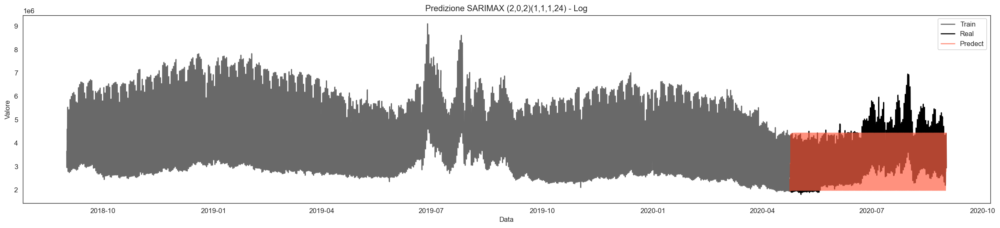

In [191]:
#[ESEGUO IL PLOT CONSIDERANDO LA PREDIZIONE SUL VALIDATION, PLOTTANDO ANCHE I DATI DEL TRAINING]
plt.figure(figsize=(25, 5))
plt.title('Predizione SARIMAX (2,0,2)(1,1,1,24) - Log')
plt.plot(train_dati['Valore'], color='dimgrey', label='Training')
plt.plot(validation_dati['Valore'], color='black', label='Validation')
plt.plot(predicted_val_6_mean_log, color='tomato', label='Predect - validation', alpha=0.7)
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

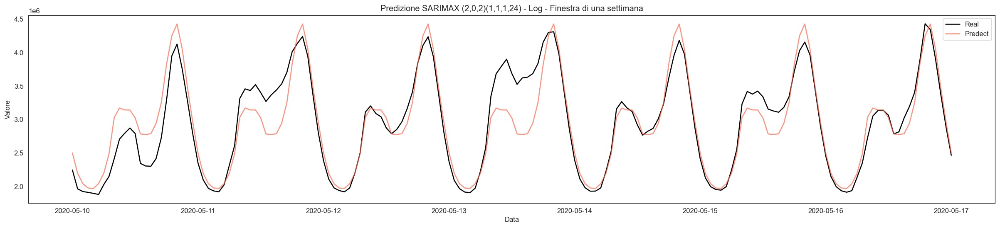

In [192]:
#[ESEGUO IL PLOT CONSIDERANDO LA PREDIZIONE SUL VALIDATION, PLOTTANDO ANCHE I DATI DEL TRAINING]
plt.figure(figsize=(25, 5))
plt.title('Predizione SARIMAX (2,0,2)(1,1,1,24) - Log - Finestra di una settimana')
plt.plot(validation_dati['Valore'][pd.Timestamp('2020-05-10'):pd.Timestamp('2020-05-17')], color='black', label='Real')
plt.plot(predicted_val_6_mean_log[pd.Timestamp('2020-05-10'):pd.Timestamp('2020-05-17')], color='tomato', label='Predect', alpha=0.7)
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()
#Osserviamo che coglie la stagionalità giornaliera, ma non quella infrasettimanale ne annua.

# Risolvo la stagionalità settimanale con serie di Fourier

In [196]:
dati.head()

,Data,Ora,Valore,Mese,Giorno,Anno,Giornosettimana
DataeOra,,,,,,,
2018-09-01 00:00:00,2018-09-01,0,3646742.0,9,1,2018,Saturday
2018-09-01 01:00:00,2018-09-01,1,3273110.0,9,1,2018,Saturday
2018-09-01 02:00:00,2018-09-01,2,3069245.0,9,1,2018,Saturday
2018-09-01 03:00:00,2018-09-01,3,2969621.0,9,1,2018,Saturday
2018-09-01 04:00:00,2018-09-01,4,2944116.0,9,1,2018,Saturday


In [6]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf #per me non servono!!
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.deterministic import DeterministicProcess

### Risoluzione stagionalità settimanale con serie di Fourier, anche in questo caso ho utilizzato un approccio "grid search" manuale, andando piano piano ad avvicinarmi al valore migliore in base ai risultati del MAE sul validation

In [6]:
#Periodo 168 assegnato come 24 * 7 = 168
four_sett_fourier10 = DeterministicProcess(dati.index,  period=168, fourier=10)
four_sett_fourier10 = four_sett_fourier10.in_sample()
train_fourier10=four_sett_fourier10[:len(train_dati)]
val_fourier10=four_sett_fourier10[len(train_dati):]

In [202]:
%%time
#Modello:
model_sarimax_fourier1 = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_fourier10, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier1 = model_sarimax_fourier1.fit(disp=0, low_memory=True)
min_fourier1 = model_sarimax_fourier1.loglikelihood_burn
#Train:
predicted_train_fourier1 = fit_model_sarimax_fourier1.get_prediction(start=train_dati.index[min_fourier1], end=train_dati.index[-1])
predicted_train_fourier1_mean = np.exp(predicted_train_fourier1.predicted_mean)
mae_train_fourier1 = np.mean(np.abs(predicted_train_fourier1_mean - train_dati['Valore'][min_fourier1:]))
#Validation
predicted_val_fourier1 = fit_model_sarimax_fourier1.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_fourier10)
predicted_val_fourier1_mean = np.exp(predicted_val_fourier1.predicted_mean)
mae_val_fourier1 = np.mean(np.abs(predicted_val_fourier1_mean - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier1.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier1)
print("--------------------")
print("MAE validation: ", mae_val_fourier1)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -63221.78244841133
--------------------
MAE train:  76563.91927331752
--------------------
MAE validation:  1038681.8415570264
CPU times: user 1h 15min 15s, sys: 11min 43s, total: 1h 26min 58s
Wall time: 34min 50s


In [6]:
#Periodo 168 assegnato come 24 * 7 = 168
four_sett_fourier5 = DeterministicProcess(dati.index,  period=168, fourier=5)
four_sett_fourier5 = four_sett_fourier5.in_sample()
train_fourier5=four_sett_fourier5[:len(train_dati)]
val_fourier5=four_sett_fourier5[len(train_dati):]

In [204]:
%%time
#Modello:
model_sarimax_fourier1 = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_fourier5, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier1 = model_sarimax_fourier1.fit(disp=0, low_memory=True)
min_fourier1 = model_sarimax_fourier1.loglikelihood_burn
#Train:
predicted_train_fourier1 = fit_model_sarimax_fourier1.get_prediction(start=train_dati.index[min_fourier1], end=train_dati.index[-1])
predicted_train_fourier1_mean = np.exp(predicted_train_fourier1.predicted_mean)
mae_train_fourier1 = np.mean(np.abs(predicted_train_fourier1_mean - train_dati['Valore'][min_fourier1:]))
#Validation
predicted_val_fourier1 = fit_model_sarimax_fourier1.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_fourier5)
predicted_val_fourier1_mean = np.exp(predicted_val_fourier1.predicted_mean)
mae_val_fourier1 = np.mean(np.abs(predicted_val_fourier1_mean - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier1.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier1)
print("--------------------")
print("MAE validation: ", mae_val_fourier1)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -69189.45393985197
--------------------
MAE train:  62678.37174484954
--------------------
MAE validation:  679112.7754049818
CPU times: user 34min 13s, sys: 4min 26s, total: 38min 39s
Wall time: 15min 22s


In [205]:
#Periodo 168 assegnato come 24 * 7 = 168
four_sett_fourier20 = DeterministicProcess(dati.index,  period=168, fourier=20)
four_sett_fourier20 = four_sett_fourier20.in_sample()
train_fourier20=four_sett_fourier20[:len(train_dati)]
val_fourier20=four_sett_fourier20[len(train_dati):]

In [206]:
%%time
#Modello:
model_sarimax_fourier2 = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_fourier20, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier2 = model_sarimax_fourier2.fit(disp=0, low_memory=True)
min_fourier2 = model_sarimax_fourier2.loglikelihood_burn
#Train:
predicted_train_fourier2 = fit_model_sarimax_fourier2.get_prediction(start=train_dati.index[min_fourier2], end=train_dati.index[-1])
predicted_train_fourier2_mean = np.exp(predicted_train_fourier2.predicted_mean)
mae_train_fourier2 = np.mean(np.abs(predicted_train_fourier2_mean - train_dati['Valore'][min_fourier2:]))
#Validation
predicted_val_fourier2 = fit_model_sarimax_fourier2.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_fourier20)
predicted_val_fourier2_mean = np.exp(predicted_val_fourier2.predicted_mean)
mae_val_fourier2 = np.mean(np.abs(predicted_val_fourier2_mean - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier2.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier2)
print("--------------------")
print("MAE validation: ", mae_val_fourier2)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -66779.42032712318
--------------------
MAE train:  66057.68829306957
--------------------
MAE validation:  3312927.014668667
CPU times: user 3h 15min 17s, sys: 30min 5s, total: 3h 45min 22s
Wall time: 1h 17min 49s


In [222]:
#Periodo 168 assegnato come 24 * 7 = 168
four_sett_fourier11 = DeterministicProcess(dati.index,  period=168, fourier=11)
four_sett_fourier11 = four_sett_fourier11.in_sample()
train_fourier11=four_sett_fourier11[:len(train_dati)]
val_fourier11=four_sett_fourier11[len(train_dati):]

In [223]:
%%time
#Modello:
model_sarimax_fourier11 = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_fourier11, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier11= model_sarimax_fourier11.fit(disp=0, low_memory=True)
min_fourier11 = model_sarimax_fourier11.loglikelihood_burn
#Train:
predicted_train_fourier11 = fit_model_sarimax_fourier11.get_prediction(start=train_dati.index[min_fourier11], end=train_dati.index[-1])
predicted_train_fourier11_mean = np.exp(predicted_train_fourier11.predicted_mean)
mae_train_fourier11 = np.mean(np.abs(predicted_train_fourier11_mean - train_dati['Valore'][min_fourier11:]))
#Validation
predicted_val_fourier11 = fit_model_sarimax_fourier11.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_fourier11)
predicted_val_fourier11_mean = np.exp(predicted_val_fourier11.predicted_mean)
mae_val_fourier11 = np.mean(np.abs(predicted_val_fourier11_mean - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier11.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier11)
print("--------------------")
print("MAE validation: ", mae_val_fourier11)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -64358.788150895634
--------------------
MAE train:  71117.08688423531
--------------------
MAE validation:  3210785.791062674
CPU times: user 1h 21min 55s, sys: 13min 31s, total: 1h 35min 26s
Wall time: 39min 5s


In [224]:
#Periodo 168 assegnato come 24 * 7 = 168
four_sett_fourier7 = DeterministicProcess(dati.index,  period=168, fourier=7)
four_sett_fourier7 = four_sett_fourier7.in_sample()
train_fourier7=four_sett_fourier7[:len(train_dati)]
val_fourier7=four_sett_fourier7[len(train_dati):]

In [225]:
%%time
#Modello:
model_sarimax_fourier7 = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_fourier7, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier7= model_sarimax_fourier7.fit(disp=0, low_memory=True)
min_fourier7 = model_sarimax_fourier7.loglikelihood_burn
#Train:
predicted_train_fourier7 = fit_model_sarimax_fourier7.get_prediction(start=train_dati.index[min_fourier7], end=train_dati.index[-1])
predicted_train_fourier7_mean = np.exp(predicted_train_fourier7.predicted_mean)
mae_train_fourier7 = np.mean(np.abs(predicted_train_fourier7_mean - train_dati['Valore'][min_fourier7:]))
#Validation
predicted_val_fourier7 = fit_model_sarimax_fourier7.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_fourier7)
predicted_val_fourier7_mean = np.exp(predicted_val_fourier7.predicted_mean)
mae_val_fourier7 = np.mean(np.abs(predicted_val_fourier7_mean - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier7.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier7)
print("--------------------")
print("MAE validation: ", mae_val_fourier7)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -64522.43947301011
--------------------
MAE train:  70917.19472781767
--------------------
MAE validation:  702108.8257151396
CPU times: user 50min 57s, sys: 6min 54s, total: 57min 52s
Wall time: 23min 12s


In [226]:
#Periodo 168 assegnato come 24 * 7 = 168
four_sett_fourier4 = DeterministicProcess(dati.index,  period=168, fourier=4)
four_sett_fourier4 = four_sett_fourier4.in_sample()
train_fourier4=four_sett_fourier4[:len(train_dati)]
val_fourier4=four_sett_fourier4[len(train_dati):]

In [227]:
%%time
#Modello:
model_sarimax_fourier4 = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_fourier4, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier4= model_sarimax_fourier4.fit(disp=0, low_memory=True)
min_fourier4 = model_sarimax_fourier4.loglikelihood_burn
#Train:
predicted_train_fourier4 = fit_model_sarimax_fourier4.get_prediction(start=train_dati.index[min_fourier4], end=train_dati.index[-1])
predicted_train_fourier4_mean = np.exp(predicted_train_fourier4.predicted_mean)
mae_train_fourier4 = np.mean(np.abs(predicted_train_fourier4_mean - train_dati['Valore'][min_fourier4:]))
#Validation
predicted_val_fourier4 = fit_model_sarimax_fourier4.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_fourier4)
predicted_val_fourier4_mean = np.exp(predicted_val_fourier4.predicted_mean)
mae_val_fourier4 = np.mean(np.abs(predicted_val_fourier4_mean - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier4.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier4)
print("--------------------")
print("MAE validation: ", mae_val_fourier4)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -69050.83824154711
--------------------
MAE train:  62797.66652805914
--------------------
MAE validation:  684178.9411381106
CPU times: user 27min 42s, sys: 3min 24s, total: 31min 7s
Wall time: 12min 21s


In [228]:
#Periodo 168 assegnato come 24 * 7 = 168
four_sett_fourier3 = DeterministicProcess(dati.index,  period=168, fourier=3)
four_sett_fourier3 = four_sett_fourier3.in_sample()
train_fourier3=four_sett_fourier3[:len(train_dati)]
val_fourier3=four_sett_fourier3[len(train_dati):]

In [229]:
%%time
#Modello:
model_sarimax_fourier3 = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_fourier3, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier3= model_sarimax_fourier3.fit(disp=0, low_memory=True)
min_fourier3 = model_sarimax_fourier3.loglikelihood_burn
#Train:
predicted_train_fourier3 = fit_model_sarimax_fourier3.get_prediction(start=train_dati.index[min_fourier3], end=train_dati.index[-1])
predicted_train_fourier3_mean = np.exp(predicted_train_fourier3.predicted_mean)
mae_train_fourier3 = np.mean(np.abs(predicted_train_fourier3_mean - train_dati['Valore'][min_fourier3:]))
#Validation
predicted_val_fourier3 = fit_model_sarimax_fourier3.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_fourier3)
predicted_val_fourier3_mean = np.exp(predicted_val_fourier3.predicted_mean)
mae_val_fourier3 = np.mean(np.abs(predicted_val_fourier3_mean - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier3.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier3)
print("--------------------")
print("MAE validation: ", mae_val_fourier3)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -69010.55567189193
--------------------
MAE train:  62508.986647208534
--------------------
MAE validation:  684780.7149984573
CPU times: user 21min 53s, sys: 2min 37s, total: 24min 30s
Wall time: 9min 51s


In [230]:
#Periodo 168 assegnato come 24 * 7 = 168
four_sett_fourier2 = DeterministicProcess(dati.index,  period=168, fourier=2)
four_sett_fourier2 = four_sett_fourier2.in_sample()
train_fourier2=four_sett_fourier2[:len(train_dati)]
val_fourier2=four_sett_fourier2[len(train_dati):]

In [231]:
%%time
#Modello:
model_sarimax_fourier2 = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_fourier2, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier2= model_sarimax_fourier2.fit(disp=0, low_memory=True)
min_fourier2 = model_sarimax_fourier2.loglikelihood_burn
#Train:
predicted_train_fourier2 = fit_model_sarimax_fourier2.get_prediction(start=train_dati.index[min_fourier2], end=train_dati.index[-1])
predicted_train_fourier2_mean = np.exp(predicted_train_fourier2.predicted_mean)
mae_train_fourier2 = np.mean(np.abs(predicted_train_fourier2_mean - train_dati['Valore'][min_fourier2:]))
#Validation
predicted_val_fourier2 = fit_model_sarimax_fourier2.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_fourier2)
predicted_val_fourier2_mean = np.exp(predicted_val_fourier2.predicted_mean)
mae_val_fourier2 = np.mean(np.abs(predicted_val_fourier2_mean - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier2.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier2)
print("--------------------")
print("MAE validation: ", mae_val_fourier2)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -68951.60011593932
--------------------
MAE train:  62628.27655790367
--------------------
MAE validation:  684910.1394237137
CPU times: user 17min 28s, sys: 2min 10s, total: 19min 38s
Wall time: 8min 20s


In [232]:
#Periodo 168 assegnato come 24 * 6 = 168
four_sett_fourier6 = DeterministicProcess(dati.index,  period=168, fourier=6)
four_sett_fourier6 = four_sett_fourier6.in_sample()
train_fourier6=four_sett_fourier6[:len(train_dati)]
val_fourier6=four_sett_fourier6[len(train_dati):]

In [233]:
%%time
#Modello:
model_sarimax_fourier6 = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_fourier6, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier6= model_sarimax_fourier6.fit(disp=0, low_memory=True)
min_fourier6 = model_sarimax_fourier6.loglikelihood_burn
#Train:
predicted_train_fourier6 = fit_model_sarimax_fourier6.get_prediction(start=train_dati.index[min_fourier6], end=train_dati.index[-1])
predicted_train_fourier6_mean = np.exp(predicted_train_fourier6.predicted_mean)
mae_train_fourier6 = np.mean(np.abs(predicted_train_fourier6_mean - train_dati['Valore'][min_fourier6:]))
#Validation
predicted_val_fourier6 = fit_model_sarimax_fourier6.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_fourier6)
predicted_val_fourier6_mean = np.exp(predicted_val_fourier6.predicted_mean)
mae_val_fourier6 = np.mean(np.abs(predicted_val_fourier6_mean - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier6.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier6)
print("--------------------")
print("MAE validation: ", mae_val_fourier6)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -69250.0912195918
--------------------
MAE train:  62375.78249188307
--------------------
MAE validation:  679409.3831034667
CPU times: user 39min 16s, sys: 5min 39s, total: 44min 55s
Wall time: 17min 36s


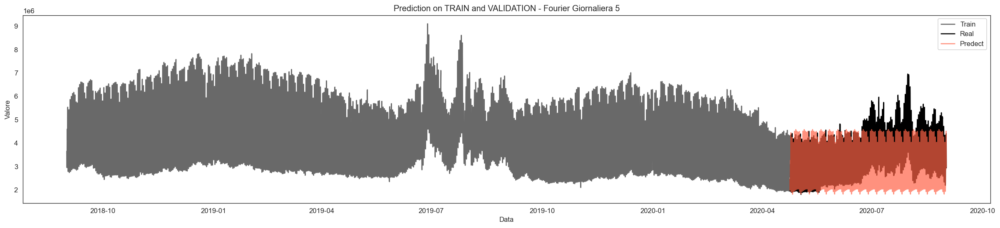

In [240]:
#[ESEGUO IL PLOT CONSIDERANDO LA PREDIZIONE SUL VALIDATION, PLOTTANDO ANCHE I DATI DEL TRAINING]
plt.figure(figsize=(25, 5))
plt.title('Prediction on TRAIN and VALIDATION - Fourier Giornaliera 5')
plt.plot(train_dati['Valore'], color='dimgrey', label='Training')
plt.plot(validation_dati['Valore'], color='black', label='Validation')
plt.plot(predicted_val_fourier1_mean, color='tomato', label='Predect - validation', alpha=0.7)
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

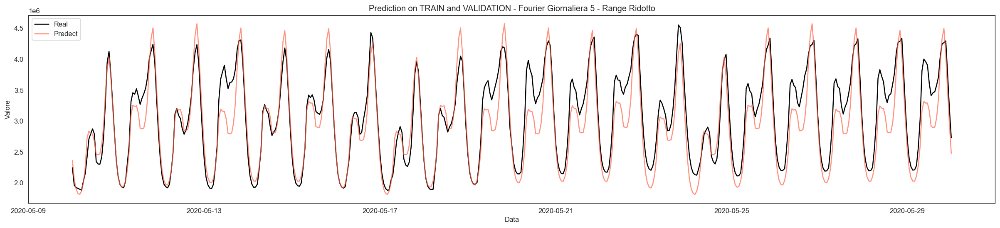

In [242]:
#[ESEGUO IL PLOT CONSIDERANDO LA PREDIZIONE SUL VALIDATION, PLOTTANDO ANCHE I DATI DEL TRAINING]
plt.figure(figsize=(25, 5))
plt.title('Prediction on TRAIN and VALIDATION - Fourier Giornaliera 5 - Range Ridotto')
plt.plot(validation_dati['Valore'][pd.Timestamp('2020-05-10'):pd.Timestamp('2020-05-30')], color='black', label='Real')
plt.plot(predicted_val_fourier1_mean[pd.Timestamp('2020-05-10'):pd.Timestamp('2020-05-30')], color='tomato', label='Predect', alpha=0.7)
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

### Risolvo il problema della stagionalità annuale, probabilmente il valore di MAE si abbasserà notevolmente

In [243]:
fourier_annuale_2 = DeterministicProcess(dati.index,  period=24*365.25, fourier=2)
four_merge_settannuale = four_sett_fourier5.merge(fourier_annuale_2.in_sample(), left_index=True, right_index=True)
train_settannuale_fourier2 = four_merge_settannuale[:len(train_dati)]
val_settannuale_fourier2 = four_merge_settannuale[len(train_dati):]

In [244]:
%%time
#Modello:
model_sarimax_fourier6comp = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_settannuale_fourier2, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier6comp = model_sarimax_fourier6comp.fit(disp=0, low_memory=True)
min_fourier6comp = model_sarimax_fourier6comp.loglikelihood_burn
#Train:
predicted_train_fourier6comp = fit_model_sarimax_fourier6comp.get_prediction(start=train_dati.index[min_fourier6comp], end=train_dati.index[-1])
predicted_train_fourier6_meancomp = np.exp(predicted_train_fourier6comp.predicted_mean)
mae_train_fourier6comp = np.mean(np.abs(predicted_train_fourier6_meancomp - train_dati['Valore'][min_fourier6comp:]))
#Validation
predicted_val_fourier6comp = fit_model_sarimax_fourier6comp.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_settannuale_fourier2)
predicted_val_fourier6_meancomp = np.exp(predicted_val_fourier6comp.predicted_mean)
mae_val_fourier6comp = np.mean(np.abs(predicted_val_fourier6_meancomp - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)26")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier6comp.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier6comp)
print("--------------------")
print("MAE validation: ", mae_val_fourier6comp)

SARIMAX(2,0,2)(1,1,1)26
--------------------
AIC:  -69228.00832265102
--------------------
MAE train:  62600.201776334274
--------------------
MAE validation:  398330.384173599
CPU times: user 47min 46s, sys: 6min 40s, total: 54min 26s
Wall time: 22min 6s


In [245]:
fourier_annuale_3 = DeterministicProcess(dati.index,  period=24*365.25, fourier=3)

four_merge_settannuale = four_sett_fourier5.merge(fourier_annuale_3.in_sample(), left_index=True, right_index=True)
#four_merge_settannuale = four_merge_settannuale.merge(fourier_quadrimenstrale_3.in_sample(), left_index=True, right_index=True)
train_settannuale_fourier3 = four_merge_settannuale[:len(train_dati)]
val_settannuale_fourier3 = four_merge_settannuale[len(train_dati):]

In [246]:
%%time
#Modello:
model_sarimax_fourier5comp = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_settannuale_fourier3, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier5comp = model_sarimax_fourier5comp.fit(disp=0, low_memory=True)
min_fourier5comp = model_sarimax_fourier5comp.loglikelihood_burn
#Train:
predicted_train_fourier5comp = fit_model_sarimax_fourier5comp.get_prediction(start=train_dati.index[min_fourier5comp], end=train_dati.index[-1])
predicted_train_fourier5_meancomp = np.exp(predicted_train_fourier5comp.predicted_mean)
mae_train_fourier5comp = np.mean(np.abs(predicted_train_fourier5_meancomp - train_dati['Valore'][min_fourier5comp:]))
#Validation
predicted_val_fourier5comp = fit_model_sarimax_fourier5comp.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_settannuale_fourier3)
predicted_val_fourier5_meancomp = np.exp(predicted_val_fourier5comp.predicted_mean)
mae_val_fourier5comp = np.mean(np.abs(predicted_val_fourier5_meancomp - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier5comp.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier5comp)
print("--------------------")
print("MAE validation: ", mae_val_fourier5comp)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -69238.39891022794
--------------------
MAE train:  62517.76608652545
--------------------
MAE validation:  346064.55334349733
CPU times: user 54min 6s, sys: 7min 43s, total: 1h 1min 50s
Wall time: 22min 59s


In [247]:
fourier_annuale_4 = DeterministicProcess(dati.index,  period=24*365.25, fourier=4)
four_merge_settannuale = four_sett_fourier5.merge(fourier_annuale_4.in_sample(), left_index=True, right_index=True)
train_settannuale_fourier4 = four_merge_settannuale[:len(train_dati)]
val_settannuale_fourier4 = four_merge_settannuale[len(train_dati):]

In [248]:
%%time
#Modello:
model_sarimax_fourier4comp = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_settannuale_fourier4, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier4comp = model_sarimax_fourier4comp.fit(disp=0, low_memory=True)
min_fourier4comp = model_sarimax_fourier4comp.loglikelihood_burn
#Train:
predicted_train_fourier4comp = fit_model_sarimax_fourier4comp.get_prediction(start=train_dati.index[min_fourier4comp], end=train_dati.index[-1])
predicted_train_fourier4_meancomp = np.exp(predicted_train_fourier4comp.predicted_mean)
mae_train_fourier4comp = np.mean(np.abs(predicted_train_fourier4_meancomp - train_dati['Valore'][min_fourier4comp:]))
#Validation
predicted_val_fourier4comp = fit_model_sarimax_fourier4comp.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_settannuale_fourier4)
predicted_val_fourier4_meancomp = np.exp(predicted_val_fourier4comp.predicted_mean)
mae_val_fourier4comp = np.mean(np.abs(predicted_val_fourier4_meancomp - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(4,4,4)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier4comp.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier4comp)
print("--------------------")
print("MAE validation: ", mae_val_fourier4comp)

SARIMAX(2,0,2)(4,4,4)24
--------------------
AIC:  -69238.35694658627
--------------------
MAE train:  62534.48356754807
--------------------
MAE validation:  342706.20567453635
CPU times: user 1h 1min 45s, sys: 8min 51s, total: 1h 10min 37s
Wall time: 25min 42s


In [7]:
fourier_annuale_5 = DeterministicProcess(dati.index,  period=24*365.25, fourier=5)
four_merge_settannuale = four_sett_fourier5.merge(fourier_annuale_5.in_sample(), left_index=True, right_index=True)
train_settannuale_fourier5 = four_merge_settannuale[:len(train_dati)]
val_settannuale_fourier5 = four_merge_settannuale[len(train_dati):]

In [8]:
%%time
#Modello:
model_sarimax_fourier1comp = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_settannuale_fourier5, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier1comp = model_sarimax_fourier1comp.fit(disp=0, low_memory=True)
min_fourier1comp = model_sarimax_fourier1comp.loglikelihood_burn
#Train:
predicted_train_fourier1comp = fit_model_sarimax_fourier1comp.get_prediction(start=train_dati.index[min_fourier1comp], end=train_dati.index[-1])
predicted_train_fourier1_meancomp = np.exp(predicted_train_fourier1comp.predicted_mean)
mae_train_fourier1comp = np.mean(np.abs(predicted_train_fourier1_meancomp - train_dati['Valore'][min_fourier1comp:]))
#Validation
predicted_val_fourier1comp = fit_model_sarimax_fourier1comp.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_settannuale_fourier5)
predicted_val_fourier1_meancomp = np.exp(predicted_val_fourier1comp.predicted_mean)
mae_val_fourier1comp = np.mean(np.abs(predicted_val_fourier1_meancomp - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier1comp.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier1comp)
print("--------------------")
print("MAE validation: ", mae_val_fourier1comp)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -69237.62221489042
--------------------
MAE train:  62569.458733641506
--------------------
MAE validation:  375028.0231670322
CPU times: user 1h 3min 43s, sys: 8min 34s, total: 1h 12min 17s
Wall time: 26min 6s


In [250]:
fourier_annuale_7 = DeterministicProcess(dati.index,  period=24*365.25, fourier=7)
four_merge_settannuale7 = four_sett_fourier5.merge(fourier_annuale_7.in_sample(), left_index=True, right_index=True)
train_settannuale_fourier7 = four_merge_settannuale7[:len(train_dati)]
val_settannuale_fourier7 = four_merge_settannuale7[len(train_dati):]

In [251]:
%%time
#Modello:
model_sarimax_fourier3comp = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_settannuale_fourier7, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier3comp = model_sarimax_fourier3comp.fit(disp=0, low_memory=True)
min_fourier3comp = model_sarimax_fourier3comp.loglikelihood_burn
#Train:
predicted_train_fourier3comp = fit_model_sarimax_fourier3comp.get_prediction(start=train_dati.index[min_fourier3comp], end=train_dati.index[-1])
predicted_train_fourier3_meancomp = np.exp(predicted_train_fourier3comp.predicted_mean)
mae_train_fourier3comp = np.mean(np.abs(predicted_train_fourier3_meancomp - train_dati['Valore'][min_fourier3comp:]))
#Validation
predicted_val_fourier3comp = fit_model_sarimax_fourier3comp.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_settannuale_fourier7)
predicted_val_fourier3_meancomp = np.exp(predicted_val_fourier3comp.predicted_mean)
mae_val_fourier3comp = np.mean(np.abs(predicted_val_fourier3_meancomp - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(3,3,3)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier3comp.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier3comp)
print("--------------------")
print("MAE validation: ", mae_val_fourier3comp)

SARIMAX(2,0,2)(3,3,3)24
--------------------
AIC:  -69241.40703794804
--------------------
MAE train:  62575.1424253204
--------------------
MAE validation:  376851.28666097275
CPU times: user 1h 27min 22s, sys: 13min 31s, total: 1h 40min 53s
Wall time: 36min 15s


In [252]:
fourier_annuale_10 = DeterministicProcess(dati.index,  period=24*365.25, fourier=10)
four_merge_settannuale_10 = four_sett_fourier5.merge(fourier_annuale_10.in_sample(), left_index=True, right_index=True)
train_settannuale_fourier10 = four_merge_settannuale_10[:len(train_dati)]
val_settannuale_fourier10 = four_merge_settannuale_10[len(train_dati):]

In [253]:
%%time
#Modello:
model_sarimax_fourier2comp = sm.tsa.statespace.SARIMAX(np.log(train_dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = train_settannuale_fourier10, enforce_stationarity=False, enforce_invertibility=False)
fit_model_sarimax_fourier2comp = model_sarimax_fourier2comp.fit(disp=0, low_memory=True)
min_fourier2comp = model_sarimax_fourier2comp.loglikelihood_burn
#Train:
predicted_train_fourier2comp = fit_model_sarimax_fourier2comp.get_prediction(start=train_dati.index[min_fourier2comp], end=train_dati.index[-1])
predicted_train_fourier2_meancomp = np.exp(predicted_train_fourier2comp.predicted_mean)
mae_train_fourier2comp = np.mean(np.abs(predicted_train_fourier2_meancomp - train_dati['Valore'][min_fourier2comp:]))
#Validation
predicted_val_fourier2comp = fit_model_sarimax_fourier2comp.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog= val_settannuale_fourier10)
predicted_val_fourier2_meancomp = np.exp(predicted_val_fourier2comp.predicted_mean)
mae_val_fourier2comp = np.mean(np.abs(predicted_val_fourier2_meancomp - validation_dati['Valore']))
#Print informazioni modello:
print("SARIMAX(2,0,2)(1,1,1)24")
print("--------------------")
print("AIC: ", fit_model_sarimax_fourier2comp.aic)
print("--------------------")
print("MAE train: ", mae_train_fourier2comp)
print("--------------------")
print("MAE validation: ", mae_val_fourier2comp)

SARIMAX(2,0,2)(1,1,1)24
--------------------
AIC:  -69261.81267976931
--------------------
MAE train:  62517.09115597677
--------------------
MAE validation:  380216.72888149094
CPU times: user 1h 56min 39s, sys: 18min 40s, total: 2h 15min 19s
Wall time: 45min 42s


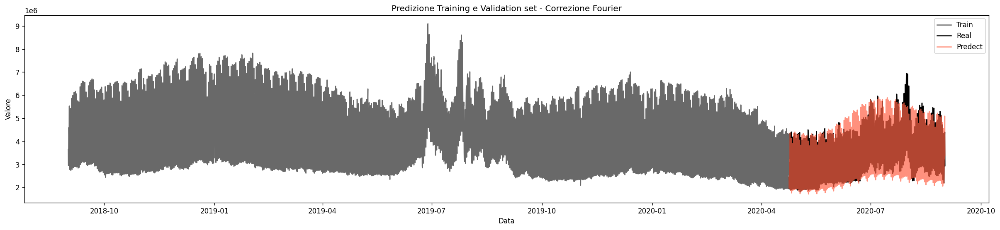

In [10]:
#[ESEGUO IL PLOT CONSIDERANDO LA PREDIZIONE SUL VALIDATION, PLOTTANDO ANCHE I DATI DEL TRAINING]
plt.figure(figsize=(25, 5))
plt.title('Predizione Training e Validation set - Correzione Fourier')
plt.plot(train_dati['Valore'], color='dimgrey', label='Training')
plt.plot(validation_dati['Valore'], color='black', label="Validation")
plt.plot(predicted_val_fourier1_meancomp , color='tomato', label='Predect - validation', alpha=0.7)
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

## Forecast con SARIMAX

In [12]:
%%time
fourierforecast_sett = DeterministicProcess(pd.date_range(start="2018-09-01 00:00:00", end="2020-10-31 23:00:00", freq='H'),  period=168, fourier=5)
fourieriforecast_ann = DeterministicProcess(pd.date_range(start="2018-09-01 00:00:00", end="2020-10-31 23:00:00", freq='H'),  period=24*365.25, fourier=4)
fourforecast_complessivo = fourierforecast_sett.in_sample().merge(fourieriforecast_ann.in_sample(), left_index=True, right_index=True)
forecast_dati=fourforecast_complessivo[:len(dati)]
forecast_test_dati=fourforecast_complessivo[len(dati):]
modelloforecast_sarimax_completo = sm.tsa.statespace.SARIMAX(np.log(dati['Valore']), order=(2, 0, 2), seasonal_order=(1, 1, 1, 24), exog = forecast_dati, enforce_stationarity=False, enforce_invertibility=False)
fit_modelloforecast_sarimax_completo = modelloforecast_sarimax_completo.fit(disp=0, low_memory=True)
print("IL MODELLO E' STATO FITTATO")
print("_______________________")
min_modelloforecast_sarimax_completo = modelloforecast_sarimax_completo.loglikelihood_burn
print("Loglikelihood: ", min_modelloforecast_sarimax_completo)
aic_modelloforecast_sarimax_completo = fit_modelloforecast_sarimax_completo.aic
print("AIC: ", aic_modelloforecast_sarimax_completo)
forecast_sarimax = fit_modelloforecast_sarimax_completo.get_prediction(start=pd.to_datetime('2020-09-01-0',  format = "%Y-%m-%d-%H"), end=pd.to_datetime('2020-10-31-23',  format = "%Y-%m-%d-%H"), exog=forecast_test_dati)
forecast_sarimax_completo = pd.DataFrame({'ARIMA':forecast_sarimax.predicted_mean, 'Date':pd.date_range(start="2020-09-01 00:00:00", end="2020-10-31 23:00:00", freq='H')})
forecast_sarimax_completo.head()

IL MODELLO E' STATO FITTATO
_______________________
Loglikelihood:  51
AIC:  -83852.26634012778
CPU times: user 1h 6min 30s, sys: 7min 20s, total: 1h 13min 51s
Wall time: 29min 12s


,ARIMA,Date
2020-09-01 00:00:00,14.748131,2020-09-01 00:00:00
2020-09-01 01:00:00,14.657587,2020-09-01 01:00:00
2020-09-01 02:00:00,14.616469,2020-09-01 02:00:00
2020-09-01 03:00:00,14.602078,2020-09-01 03:00:00
2020-09-01 04:00:00,14.605491,2020-09-01 04:00:00


In [18]:
forecast_sarimax_completo["ARIMA"] = np.exp(forecast_sarimax_completo["ARIMA"])
forecast_sarimax_completo.head(3)

,ARIMA,Date
2020-09-01 00:00:00,2.541160e+06,2020-09-01 00:00:00
2020-09-01 01:00:00,2.321182e+06,2020-09-01 01:00:00
2020-09-01 02:00:00,2.227675e+06,2020-09-01 02:00:00


### Effettuo la visualizzazione della predizione

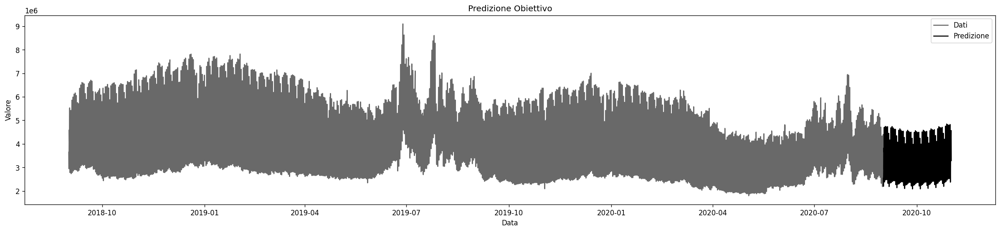

In [21]:
plt.figure(figsize=(25, 5))
plt.title('Predizione Obiettivo')
plt.plot(dati['Valore'], color='dimgrey', label='Dati')
plt.plot(forecast_sarimax_completo['ARIMA'], color='black', label='Predizione')
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

In [20]:
#Esporto i risultati:
forecast_sarimax_completo.to_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/previsionifutureSARIMAX_dataframe.csv')

# Modello UCM

In [ ]:
dati=pd.read_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/dati_preprocessati.csv', header=0, low_memory=False, parse_dates=['DataeOra'])
dati.set_index('DataeOra', inplace=True)
dati.index.freq='H'
dati.head()

In [ ]:
#Train / validation split
train_dati = dati.loc[:"2020-04-23 23:00:00"]
print("Numero di elementi presenti nel train: ", len(train_dati))
validation_dati = dati.loc["2020-04-24 00:00:00":]
print("Numero di elementi presenti nel validation: ", len(validation_dati))

## Utilizzo di un apporccio "grid search" manuale per selezionare il migliore modello:

In [7]:
lev_tre = ['rwalk', 'dconstant', 'ntrend', 'llevel', 'lldtrend', 'rwdrift', 'lltrend', 'strend', 'rtrend']

In [42]:
%%time
#Modello:
model_ucm_1 = sm.tsa.UnobservedComponents(train_dati['Valore'], "rwalk", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':9}])
fit_model_ucm_1 = model_ucm_1.fit(low_memory=True)
min_ucm_1 = model_ucm_1.loglikelihood_burn
#Train:
predicted_train_ucm_1 = fit_model_ucm_1.get_prediction(start=train_dati.index[min_ucm_1], end=train_dati.index[-1])
predicted_train_ucm_1_mean = predicted_train_ucm_1.predicted_mean
mae_train_ucm_1 = np.mean(np.abs(predicted_train_ucm_1_mean - train_dati['Valore'][min_ucm_1:]))
#Validation
predicted_val_ucm_1 = fit_model_ucm_1.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_1_mean = predicted_val_ucm_1.predicted_mean
mae_val_ucm_1 = np.mean(np.abs(predicted_val_ucm_1_mean - validation_dati['Valore']))
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_1.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_1)
print("--------------------")
print("MAE validation: ", mae_val_ucm_1)

--------------------
AIC:  470244.3314302552
--------------------
MAE train:  120837.86358102964
--------------------
MAE validation:  684343.2180934196
CPU times: user 31.5 s, sys: 6.47 s, total: 38 s
Wall time: 12.7 s


In [27]:
%%time
#Modello:
model_ucm_2 = sm.tsa.UnobservedComponents(train_dati['Valore'], "dconstant", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':9}])
fit_model_ucm_2 = model_ucm_2.fit(low_memory=True)
min_ucm_2 = model_ucm_2.loglikelihood_burn
#Train:
predicted_train_ucm_2 = fit_model_ucm_2.get_prediction(start=train_dati.index[min_ucm_2], end=train_dati.index[-1])
predicted_train_ucm_2_mean = predicted_train_ucm_2.predicted_mean
mae_train_ucm_2 = np.mean(np.abs(predicted_train_ucm_2_mean - train_dati['Valore'][min_ucm_2:]))
mape_train_ucm_2 = np.mean(np.abs(predicted_train_ucm_2_mean - train_dati['Valore'][min_ucm_2:])/np.abs(train_dati['Valore'][min_ucm_2:]))
residui_train_ucm_2=train_dati['Valore'][min_ucm_2:]-predicted_train_ucm_2_mean
#Validation
predicted_val_ucm_2 = fit_model_ucm_2.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_2_mean = predicted_val_ucm_2.predicted_mean
mae_val_ucm_2 = np.mean(np.abs(predicted_val_ucm_2_mean - validation_dati['Valore']))
mape_val_ucm_2 = np.mean(np.abs(predicted_val_ucm_2_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_ucm_2=validation_dati['Valore']-predicted_val_ucm_2_mean
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_2.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_2)
print("MAPE train: ", mape_train_ucm_2)
print("--------------------")
print("MAE validation: ", mae_val_ucm_2)
print("MAPE validation: ", mape_val_ucm_2)

--------------------
AIC:  473471.40083090146
--------------------
MAE train:  730705.7757146332
MAPE train:  0.17920389996008118
--------------------
MAE validation:  3600090.130798891
MAPE validation:  1.0781231484588678
CPU times: user 34.9 s, sys: 7.31 s, total: 42.2 s
Wall time: 18 s


In [28]:
%%time
#Modello:
model_ucm_3 = sm.tsa.UnobservedComponents(train_dati['Valore'], "ntrend", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':9}])
fit_model_ucm_3 = model_ucm_3.fit(low_memory=True)
min_ucm_3 = model_ucm_3.loglikelihood_burn
#Train:
predicted_train_ucm_3 = fit_model_ucm_3.get_prediction(start=train_dati.index[min_ucm_3], end=train_dati.index[-1])
predicted_train_ucm_3_mean = predicted_train_ucm_3.predicted_mean
mae_train_ucm_3 = np.mean(np.abs(predicted_train_ucm_3_mean - train_dati['Valore'][min_ucm_3:]))
mape_train_ucm_3 = np.mean(np.abs(predicted_train_ucm_3_mean - train_dati['Valore'][min_ucm_3:])/np.abs(train_dati['Valore'][min_ucm_3:]))
residui_train_ucm_3=train_dati['Valore'][min_ucm_3:]-predicted_train_ucm_3_mean
#Validation
predicted_val_ucm_3 = fit_model_ucm_3.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_3_mean = predicted_val_ucm_3.predicted_mean
mae_val_ucm_3 = np.mean(np.abs(predicted_val_ucm_3_mean - validation_dati['Valore']))
mape_val_ucm_3 = np.mean(np.abs(predicted_val_ucm_3_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_ucm_3=validation_dati['Valore']-predicted_val_ucm_3_mean
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_3.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_3)
print("MAPE train: ", mape_train_ucm_3)
print("--------------------")
print("MAE validation: ", mae_val_ucm_3)
print("MAPE validation: ", mape_val_ucm_3)

--------------------
AIC:  479996.85338788835
--------------------
MAE train:  730722.8781247156
MAPE train:  0.1792083656135108
--------------------
MAE validation:  3600151.767917412
MAPE validation:  1.0781421506878675
CPU times: user 34.3 s, sys: 7.36 s, total: 41.6 s
Wall time: 15.9 s


In [29]:
%%time
#Modello:
model_ucm_4 = sm.tsa.UnobservedComponents(train_dati['Valore'], "llevel", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':9}])
fit_model_ucm_4 = model_ucm_4.fit(low_memory=True)
min_ucm_4 = model_ucm_4.loglikelihood_burn
#Train:
predicted_train_ucm_4 = fit_model_ucm_4.get_prediction(start=train_dati.index[min_ucm_4], end=train_dati.index[-1])
predicted_train_ucm_4_mean = predicted_train_ucm_4.predicted_mean
mae_train_ucm_4 = np.mean(np.abs(predicted_train_ucm_4_mean - train_dati['Valore'][min_ucm_4:]))
mape_train_ucm_4 = np.mean(np.abs(predicted_train_ucm_4_mean - train_dati['Valore'][min_ucm_4:])/np.abs(train_dati['Valore'][min_ucm_4:]))
residui_train_ucm_4=train_dati['Valore'][min_ucm_4:]-predicted_train_ucm_4_mean
#Validation
predicted_val_ucm_4 = fit_model_ucm_4.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_4_mean = predicted_val_ucm_4.predicted_mean
mae_val_ucm_4 = np.mean(np.abs(predicted_val_ucm_4_mean - validation_dati['Valore']))
mape_val_ucm_4 = np.mean(np.abs(predicted_val_ucm_4_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_ucm_4=validation_dati['Valore']-predicted_val_ucm_4_mean
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_4.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_4)
print("MAPE train: ", mape_train_ucm_4)
print("--------------------")
print("MAE validation: ", mae_val_ucm_4)
print("MAPE validation: ", mape_val_ucm_4)

--------------------
AIC:  473711.22821351147
--------------------
MAE train:  123499.31944165232
MAPE train:  0.028856546667530864
--------------------
MAE validation:  680002.1538411747
MAPE validation:  0.18105625501996453
CPU times: user 1min, sys: 11.1 s, total: 1min 11s
Wall time: 21.9 s


In [53]:
%%time
#Modello:
model_ucm_5 = sm.tsa.UnobservedComponents(train_dati['Valore'], "lldtrend", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':7}])
fit_model_ucm_5 = model_ucm_5.fit(low_memory=True)
min_ucm_5 = model_ucm_5.loglikelihood_burn
#Train:
predicted_train_ucm_5 = fit_model_ucm_5.get_prediction(start=train_dati.index[min_ucm_5], end=train_dati.index[-1])
predicted_train_ucm_5_mean = predicted_train_ucm_5.predicted_mean
mae_train_ucm_5 = np.mean(np.abs(predicted_train_ucm_5_mean - train_dati['Valore'][min_ucm_5:]))
#Validation
predicted_val_ucm_5 = fit_model_ucm_5.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_5_mean = predicted_val_ucm_5.predicted_mean
mae_val_ucm_5 = np.mean(np.abs(predicted_val_ucm_5_mean - validation_dati['Valore']))
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_5.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_5)
print("--------------------")
print("MAE validation: ", mae_val_ucm_5)

--------------------
AIC:  469976.89789366064
--------------------
MAE train:  125660.18338661449
--------------------
MAE validation:  667073.5445167875
CPU times: user 52.3 s, sys: 8.7 s, total: 1min 1s
Wall time: 17.7 s


In [31]:
%%time
#Modello:
model_ucm_6 = sm.tsa.UnobservedComponents(train_dati['Valore'], "rwdrift", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':9}])
fit_model_ucm_6 = model_ucm_6.fit(low_memory=True)
min_ucm_6 = model_ucm_6.loglikelihood_burn
#Train:
predicted_train_ucm_6 = fit_model_ucm_6.get_prediction(start=train_dati.index[min_ucm_6], end=train_dati.index[-1])
predicted_train_ucm_6_mean = predicted_train_ucm_6.predicted_mean
mae_train_ucm_6 = np.mean(np.abs(predicted_train_ucm_6_mean - train_dati['Valore'][min_ucm_6:]))
mape_train_ucm_6 = np.mean(np.abs(predicted_train_ucm_6_mean - train_dati['Valore'][min_ucm_6:])/np.abs(train_dati['Valore'][min_ucm_6:]))
residui_train_ucm_6=train_dati['Valore'][min_ucm_6:]-predicted_train_ucm_6_mean
#Validation
predicted_val_ucm_6 = fit_model_ucm_6.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_6_mean = predicted_val_ucm_6.predicted_mean
mae_val_ucm_6 = np.mean(np.abs(predicted_val_ucm_6_mean - validation_dati['Valore']))
mape_val_ucm_6 = np.mean(np.abs(predicted_val_ucm_6_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_ucm_6=validation_dati['Valore']-predicted_val_ucm_6_mean
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_6.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_6)
print("MAPE train: ", mape_train_ucm_6)
print("--------------------")
print("MAE validation: ", mae_val_ucm_6)
print("MAPE validation: ", mape_val_ucm_6)

--------------------
AIC:  472148.0111333912
--------------------
MAE train:  120110.86072130986
MAPE train:  0.028049500109333332
--------------------
MAE validation:  671894.4682861624
MAPE validation:  0.17881447889323615
CPU times: user 39.7 s, sys: 6.81 s, total: 46.5 s
Wall time: 15.3 s


In [32]:
%%time
#Modello:
model_ucm_7 = sm.tsa.UnobservedComponents(train_dati['Valore'], "lltrend", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':9}])
fit_model_ucm_7 = model_ucm_7.fit(low_memory=True)
min_ucm_7 = model_ucm_7.loglikelihood_burn
#Train:
predicted_train_ucm_7 = fit_model_ucm_7.get_prediction(start=train_dati.index[min_ucm_7], end=train_dati.index[-1])
predicted_train_ucm_7_mean = predicted_train_ucm_7.predicted_mean
mae_train_ucm_7 = np.mean(np.abs(predicted_train_ucm_7_mean - train_dati['Valore'][min_ucm_7:]))
mape_train_ucm_7 = np.mean(np.abs(predicted_train_ucm_7_mean - train_dati['Valore'][min_ucm_7:])/np.abs(train_dati['Valore'][min_ucm_7:]))
residui_train_ucm_7=train_dati['Valore'][min_ucm_7:]-predicted_train_ucm_7_mean
#Validation
predicted_val_ucm_7 = fit_model_ucm_7.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_7_mean = predicted_val_ucm_7.predicted_mean
mae_val_ucm_7 = np.mean(np.abs(predicted_val_ucm_7_mean - validation_dati['Valore']))
mape_val_ucm_7 = np.mean(np.abs(predicted_val_ucm_7_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_ucm_7=validation_dati['Valore']-predicted_val_ucm_7_mean
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_7.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_7)
print("MAPE train: ", mape_train_ucm_7)
print("--------------------")
print("MAE validation: ", mae_val_ucm_7)
print("MAPE validation: ", mape_val_ucm_7)

--------------------
AIC:  475274.2717677325
--------------------
MAE train:  126545.01117473377
MAPE train:  0.029474039968493862
--------------------
MAE validation:  1366961.2067973989
MAPE validation:  0.40212000922374236
CPU times: user 1min 38s, sys: 17.5 s, total: 1min 55s
Wall time: 36.8 s


In [33]:
%%time
#Modello:
model_ucm_8 = sm.tsa.UnobservedComponents(train_dati['Valore'], "strend", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':9}])
fit_model_ucm_8 = model_ucm_8.fit(low_memory=True)
min_ucm_8 = model_ucm_8.loglikelihood_burn
#Train:
predicted_train_ucm_8 = fit_model_ucm_8.get_prediction(start=train_dati.index[min_ucm_8], end=train_dati.index[-1])
predicted_train_ucm_8_mean = predicted_train_ucm_8.predicted_mean
mae_train_ucm_8 = np.mean(np.abs(predicted_train_ucm_8_mean - train_dati['Valore'][min_ucm_8:]))
mape_train_ucm_8 = np.mean(np.abs(predicted_train_ucm_8_mean - train_dati['Valore'][min_ucm_8:])/np.abs(train_dati['Valore'][min_ucm_8:]))
residui_train_ucm_8=train_dati['Valore'][min_ucm_8:]-predicted_train_ucm_8_mean
#Validation
predicted_val_ucm_8 = fit_model_ucm_8.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_8_mean = predicted_val_ucm_8.predicted_mean
mae_val_ucm_8 = np.mean(np.abs(predicted_val_ucm_8_mean - validation_dati['Valore']))
mape_val_ucm_8 = np.mean(np.abs(predicted_val_ucm_8_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_ucm_8=validation_dati['Valore']-predicted_val_ucm_8_mean
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_8.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_8)
print("MAPE train: ", mape_train_ucm_8)
print("--------------------")
print("MAE validation: ", mae_val_ucm_8)
print("MAPE validation: ", mape_val_ucm_8)

--------------------
AIC:  475265.8575258028
--------------------
MAE train:  126549.33490759213
MAPE train:  0.029474881981038627
--------------------
MAE validation:  1361607.2916887586
MAPE validation:  0.4005916887450537
CPU times: user 1min 3s, sys: 11.6 s, total: 1min 15s
Wall time: 25.4 s


In [34]:
%%time
#Modello:
model_ucm_9 = sm.tsa.UnobservedComponents(train_dati['Valore'], "rtrend", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':9}])
fit_model_ucm_9 = model_ucm_9.fit(low_memory=True)
min_ucm_9 = model_ucm_9.loglikelihood_burn
#Train:
predicted_train_ucm_9 = fit_model_ucm_9.get_prediction(start=train_dati.index[min_ucm_9], end=train_dati.index[-1])
predicted_train_ucm_9_mean = predicted_train_ucm_9.predicted_mean
mae_train_ucm_9 = np.mean(np.abs(predicted_train_ucm_9_mean - train_dati['Valore'][min_ucm_9:]))
mape_train_ucm_9 = np.mean(np.abs(predicted_train_ucm_9_mean - train_dati['Valore'][min_ucm_9:])/np.abs(train_dati['Valore'][min_ucm_9:]))
residui_train_ucm_9=train_dati['Valore'][min_ucm_9:]-predicted_train_ucm_9_mean
#Validation
predicted_val_ucm_9 = fit_model_ucm_9.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_9_mean = predicted_val_ucm_9.predicted_mean
mae_val_ucm_9 = np.mean(np.abs(predicted_val_ucm_9_mean - validation_dati['Valore']))
mape_val_ucm_9 = np.mean(np.abs(predicted_val_ucm_9_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_ucm_9=validation_dati['Valore']-predicted_val_ucm_9_mean
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_9.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_9)
print("MAPE train: ", mape_train_ucm_9)
print("--------------------")
print("MAE validation: ", mae_val_ucm_9)
print("MAPE validation: ", mape_val_ucm_9)

--------------------
AIC:  473714.27399563283
--------------------
MAE train:  123186.55989638131
MAPE train:  0.0286712536061892
--------------------
MAE validation:  547220.7268583041
MAPE validation:  0.16116484773870315
CPU times: user 40.3 s, sys: 8.17 s, total: 48.5 s
Wall time: 17.2 s


In [35]:
%%time
#Modello:
model_ucm_10 = sm.tsa.UnobservedComponents(train_dati['Valore'], "dtrend", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':9}])
fit_model_ucm_10 = model_ucm_10.fit(low_memory=True)
min_ucm_10 = model_ucm_10.loglikelihood_burn
#Train:
predicted_train_ucm_10 = fit_model_ucm_10.get_prediction(start=train_dati.index[min_ucm_10], end=train_dati.index[-1])
predicted_train_ucm_10_mean = predicted_train_ucm_10.predicted_mean
mae_train_ucm_10 = np.mean(np.abs(predicted_train_ucm_10_mean - train_dati['Valore'][min_ucm_10:]))
mape_train_ucm_10 = np.mean(np.abs(predicted_train_ucm_10_mean - train_dati['Valore'][min_ucm_10:])/np.abs(train_dati['Valore'][min_ucm_10:]))
residui_train_ucm_10=train_dati['Valore'][min_ucm_10:]-predicted_train_ucm_10_mean
#Validation
predicted_val_ucm_10 = fit_model_ucm_10.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_10_mean = predicted_val_ucm_10.predicted_mean
mae_val_ucm_10 = np.mean(np.abs(predicted_val_ucm_10_mean - validation_dati['Valore']))
mape_val_ucm_10 = np.mean(np.abs(predicted_val_ucm_10_mean - validation_dati['Valore'])/np.abs(validation_dati['Valore']))
residui_val_ucm_10=validation_dati['Valore']-predicted_val_ucm_10_mean
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_10.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_10)
print("MAPE train: ", mape_train_ucm_10)
print("--------------------")
print("MAE validation: ", mae_val_ucm_10)
print("MAPE validation: ", mape_val_ucm_10)

--------------------
AIC:  473273.7361681386
--------------------
MAE train:  401996.30997833406
MAPE train:  0.10358226976319995
--------------------
MAE validation:  3698432.4743847433
MAPE validation:  1.142660894732863
CPU times: user 38.4 s, sys: 6.75 s, total: 45.2 s
Wall time: 15.3 s


### Visualizzazioni dei valori di MAE sul training e validation set

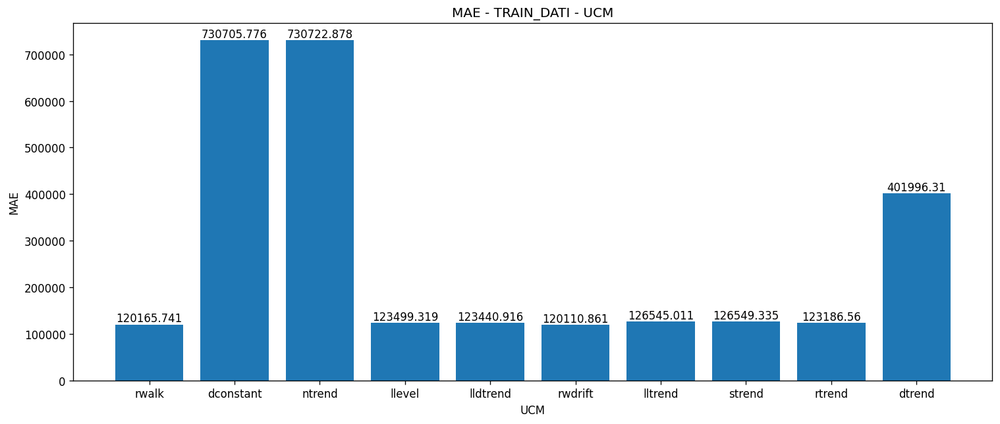

In [38]:
#SARIMAX VALORI DEL MAE del TRAIN
plt.figure(figsize=(15,6)) 
height = [mae_train_ucm_1,mae_train_ucm_2,mae_train_ucm_3, mae_train_ucm_4, mae_train_ucm_5, mae_train_ucm_6, mae_train_ucm_7, mae_train_ucm_8, mae_train_ucm_9, mae_train_ucm_10]
bars = ('rwalk', 'dconstant', 'ntrend', 'llevel', 'lldtrend', 'rwdrift', 'lltrend', 'strend', 'rtrend', "dtrend")
y_pos = np.arange(len(bars))
plt.title("MAE - TRAIN_DATI - UCM")
plt.bar(y_pos, height)
plt.text(0, height[0], round(mae_train_ucm_1, 3), ha = "center", va = "bottom")
plt.text(1, height[1], round(mae_train_ucm_2, 3), ha = "center", va = "bottom")
plt.text(2, height[2], round(mae_train_ucm_3, 3), ha = "center", va = "bottom")
plt.text(3, height[3], round(mae_train_ucm_4, 3), ha = "center", va = "bottom")
plt.text(4, height[4], round(mae_train_ucm_5, 3), ha = "center", va = "bottom")
plt.text(5, height[5], round(mae_train_ucm_6, 3), ha = "center", va = "bottom")
plt.text(6, height[6], round(mae_train_ucm_7, 3), ha = "center", va = "bottom")
plt.text(7, height[7], round(mae_train_ucm_8, 3), ha = "center", va = "bottom")
plt.text(8, height[8], round(mae_train_ucm_9, 3), ha = "center", va = "bottom")
plt.text(9, height[9], round(mae_train_ucm_10, 3), ha = "center", va = "bottom")
plt.xticks(y_pos, bars)
plt.ylabel("MAE")
plt.xlabel("UCM")
plt.show()

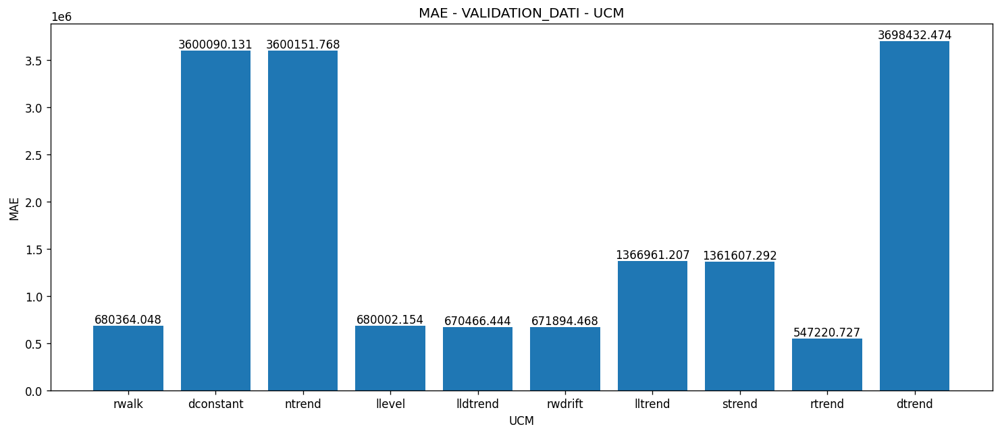

In [39]:
#SARIMAX VALORI DEL MAE del VALIDATION
plt.figure(figsize=(15,6)) 
height = [mae_val_ucm_1,mae_val_ucm_2,mae_val_ucm_3, mae_val_ucm_4, mae_val_ucm_5, mae_val_ucm_6, mae_val_ucm_7, mae_val_ucm_8, mae_val_ucm_9, mae_val_ucm_10]
bars = ('rwalk', 'dconstant', 'ntrend', 'llevel', 'lldtrend', 'rwdrift', 'lltrend', 'strend', 'rtrend', "dtrend")
y_pos = np.arange(len(bars))
plt.title("MAE - VALIDATION_DATI - UCM")
plt.bar(y_pos, height)
plt.text(0, height[0], round(mae_val_ucm_1, 3), ha = "center", va = "bottom")
plt.text(1, height[1], round(mae_val_ucm_2, 3), ha = "center", va = "bottom")
plt.text(2, height[2], round(mae_val_ucm_3, 3), ha = "center", va = "bottom")
plt.text(3, height[3], round(mae_val_ucm_4, 3), ha = "center", va = "bottom")
plt.text(4, height[4], round(mae_val_ucm_5, 3), ha = "center", va = "bottom")
plt.text(5, height[5], round(mae_val_ucm_6, 3), ha = "center", va = "bottom")
plt.text(6, height[6], round(mae_val_ucm_7, 3), ha = "center", va = "bottom")
plt.text(7, height[7], round(mae_val_ucm_8, 3), ha = "center", va = "bottom")
plt.text(8, height[8], round(mae_val_ucm_9, 3), ha = "center", va = "bottom")
plt.text(9, height[9], round(mae_val_ucm_10, 3), ha = "center", va = "bottom")
plt.xticks(y_pos, bars)
plt.xlabel("UCM")
plt.ylabel("MAE")
plt.show()

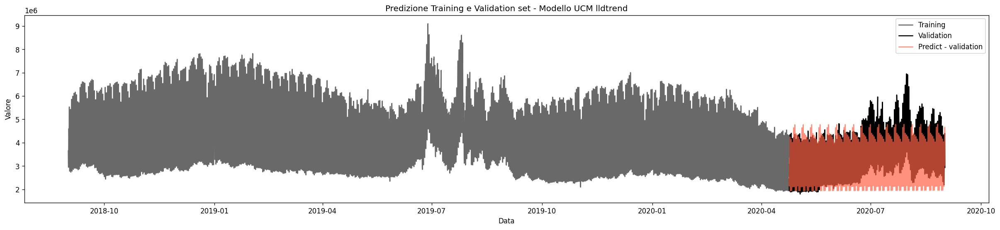

In [54]:
#[ESEGUO IL PLOT CONSIDERANDO LA PREDIZIONE SUL VALIDATION, PLOTTANDO ANCHE I DATI DEL TRAINING]
plt.figure(figsize=(25, 5))
plt.title('Predizione Training e Validation set - Modello UCM lldtrend')
plt.plot(train_dati['Valore'], color='dimgrey', label='Training')
plt.plot(validation_dati['Valore'], color='black', label='Validation')
plt.plot(predicted_val_ucm_5_mean, color='tomato', label='Predict - validation', alpha=0.7)
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

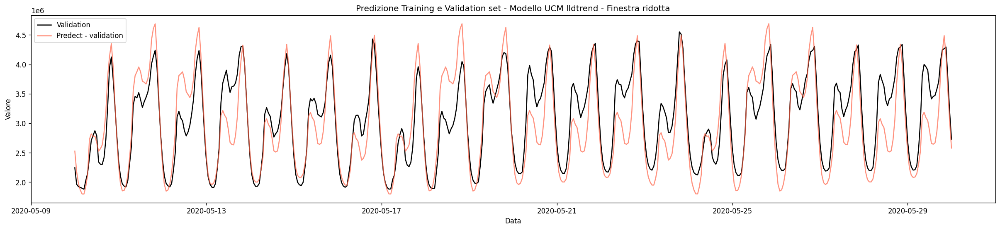

In [55]:
#[ESEGUO IL PLOT CONSIDERANDO LA PREDIZIONE SUL VALIDATION, PLOTTANDO ANCHE I DATI DEL TRAINING]
plt.figure(figsize=(25, 5))
plt.title('Predizione Training e Validation set - Modello UCM lldtrend - Finestra ridotta')
plt.plot(validation_dati['Valore'][pd.Timestamp('2020-05-10'):pd.Timestamp('2020-05-30')], color='black', label='Validation')
plt.plot(predicted_val_ucm_6_mean[pd.Timestamp('2020-05-10'):pd.Timestamp('2020-05-30')], color='tomato', label='Predect - validation', alpha=0.7)
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

In [56]:
from statsmodels.tsa.deterministic import Fourier, Seasonality, TimeTrend

In [64]:
%%time
fourier_annuale_10 = DeterministicProcess(dati.index, period = 24*365.25, fourier = 5)
fourier_annuale_10 = fourier_annuale_10.in_sample()
fourier_train_ucm10=fourier_annuale_10[:len(train_dati)]
fourier_val_ucm10=fourier_annuale_10[len(train_dati):]
#Modello:
model_ucm_1_f10 = sm.tsa.UnobservedComponents(train_dati['Valore'], "lldtrend", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':7}], exog = fourier_train_ucm10)
fit_model_ucm_1_f10 = model_ucm_1_f10.fit(low_memory=True)
min_ucm_1_f10 = model_ucm_1_f10.loglikelihood_burn
#Train:
predicted_train_ucm_1_f10 = fit_model_ucm_1_f10.get_prediction(start=train_dati.index[min_ucm_1_f10], end=train_dati.index[-1])
predicted_train_ucm_1_mean_f10 = predicted_train_ucm_1_f10.predicted_mean
mae_train_ucm_1_f10 = np.mean(np.abs(predicted_train_ucm_1_mean_f10 - train_dati['Valore'][min_ucm_1_f10:]))
#Validation
predicted_val_ucm_1_f10 = fit_model_ucm_1_f10.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1], exog = fourier_val_ucm10)
predicted_val_ucm_1_mean_f10 = predicted_val_ucm_1_f10.predicted_mean
mae_val_ucm_1_f10 = np.mean(np.abs(predicted_val_ucm_1_mean_f10 - validation_dati['Valore']))
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_1_f10.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_1_f10)
print("--------------------")
print("MAE validation: ", mae_val_ucm_1_f10)

--------------------
AIC:  469996.8978935555
--------------------
MAE train:  125660.18322441116
--------------------
MAE validation:  667073.198141091
CPU times: user 8min 37s, sys: 2min 1s, total: 10min 39s
Wall time: 2min 35s


In [63]:
%%time
#Modello:
model_ucm_1_f15 = sm.tsa.UnobservedComponents(train_dati['Valore'], "lldtrend", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':7}, {'period':24*365.25, 'harmonics':1}], cycle = True)
fit_model_ucm_1_f15 = model_ucm_1_f15.fit(low_memory=True)
min_ucm_1_f15 = model_ucm_1_f15.loglikelihood_burn
#Train:
predicted_train_ucm_1_f15 = fit_model_ucm_1_f15.get_prediction(start=train_dati.index[min_ucm_1_f15], end=train_dati.index[-1])
predicted_train_ucm_1_mean_f15 = predicted_train_ucm_1_f15.predicted_mean
mae_train_ucm_1_f15 = np.mean(np.abs(predicted_train_ucm_1_mean_f15 - train_dati['Valore'][min_ucm_1_f15:]))
#Validation
predicted_val_ucm_1_f15 = fit_model_ucm_1_f15.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_1_mean_f15 = predicted_val_ucm_1_f15.predicted_mean
mae_val_ucm_1_f15 = np.mean(np.abs(predicted_val_ucm_1_mean_f15 - validation_dati['Valore']))
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_1_f15.aic)
print("--------------------")
print("MAE training: ", mae_train_ucm_1_f15)
print("--------------------")
print("MAE validation: ", mae_val_ucm_1_f15)
#Con 2 si è abbassato notevolmente il mae

--------------------
AIC:  470886.37229341315
--------------------
MAE training:  124383.4071235789
--------------------
MAE validation:  448588.5340771042
CPU times: user 1min 24s, sys: 13.8 s, total: 1min 38s
Wall time: 28.8 s


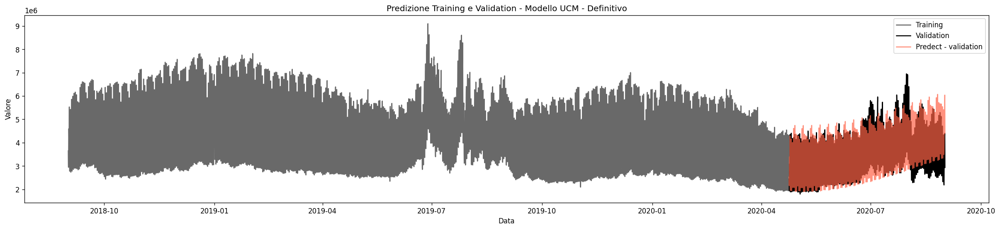

In [67]:
plt.figure(figsize=(25, 5))
plt.title('Predizione Training e Validation - Modello UCM - Definitivo')
plt.plot(train_dati['Valore'], color='dimgrey', label='Training')
plt.plot(validation_dati['Valore'], color='black', label='Validation')
plt.plot(predicted_val_ucm_1_mean_f15, color='tomato', label='Predect - validation', alpha=0.7)
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

In [66]:
%%time
#Modello:
model_ucm_1_f20 = sm.tsa.UnobservedComponents(train_dati['Valore'], "lldtrend", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':10},  {'period':24*365.25, 'harmonics':1}])
fit_model_ucm_1_f20 = model_ucm_1_f20.fit(low_memory=True)
min_ucm_1_f20 = model_ucm_1_f20.loglikelihood_burn
#Train:
predicted_train_ucm_1_f20 = fit_model_ucm_1_f20.get_prediction(start=train_dati.index[min_ucm_1_f20], end=train_dati.index[-1])
predicted_train_ucm_1_mean_f20 = predicted_train_ucm_1_f20.predicted_mean
mae_train_ucm_1_f20 = np.mean(np.abs(predicted_train_ucm_1_mean_f20 - train_dati['Valore'][min_ucm_1_f20:]))
#Validation
predicted_val_ucm_1_f20 = fit_model_ucm_1_f20.get_prediction(start=validation_dati.index[0], end=validation_dati.index[-1])
predicted_val_ucm_1_mean_f20 = predicted_val_ucm_1_f20.predicted_mean
mae_val_ucm_1_f20 = np.mean(np.abs(predicted_val_ucm_1_mean_f20 - validation_dati['Valore']))
#Print informazioni modello:
print("--------------------")
print("AIC: ", fit_model_ucm_1_f20.aic)
print("--------------------")
print("MAE train: ", mae_train_ucm_1_f20)
print("--------------------")
print("MAE validation: ", mae_val_ucm_1_f20)

--------------------
AIC:  476087.80289150955
--------------------
MAE train:  121232.55449654
--------------------
MAE validation:  445992.63824737386
CPU times: user 1min 40s, sys: 17.4 s, total: 1min 58s
Wall time: 36.7 s


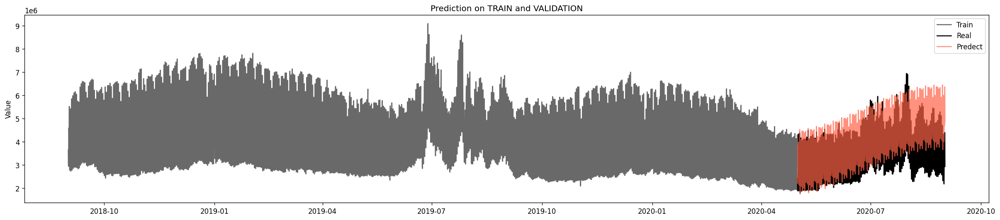

In [58]:
plt.figure(figsize=(25, 5))
plt.title('Prediction on TRAIN and VALIDATION')
plt.plot(train_dati['Valore'], color='dimgrey', label='Training')
plt.plot(validation_dati['Valore'], color='black', label='Validation')
plt.plot(predicted_val_ucm_1_mean_f20, color='tomato', label='Predect - validation', alpha=0.7)
plt.ylabel('Value')
plt.legend()
plt.show()

# Previsioni UCM

In [69]:
modelloucm_finale = sm.tsa.UnobservedComponents(dati['Valore'], "lldtrend", seasonal=24, freq_seasonal = [{'period':24*7, 'harmonics':7}, {'period':24*365.25, 'harmonics':1}], cycle = True)
fit_modelloucm_finale = modelloucm_finale.fit(low_memory=True)
previsionifutureUCM = fit_modelloucm_finale.get_prediction(start=pd.to_datetime('2020-09-01-0',  format = "%Y-%m-%d-%H"), end=pd.to_datetime('2020-10-31-23',  format = "%Y-%m-%d-%H"))
previsionifutureUCM_dataframe = pd.DataFrame({'UCM':previsionifutureUCM.predicted_mean, 'Date':pd.date_range(start="2020-09-01 00:00:00", end="2020-10-31 23:00:00", freq='H')})
previsionifutureUCM_dataframe.to_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/previsionifutureUCM_dataframe.csv')

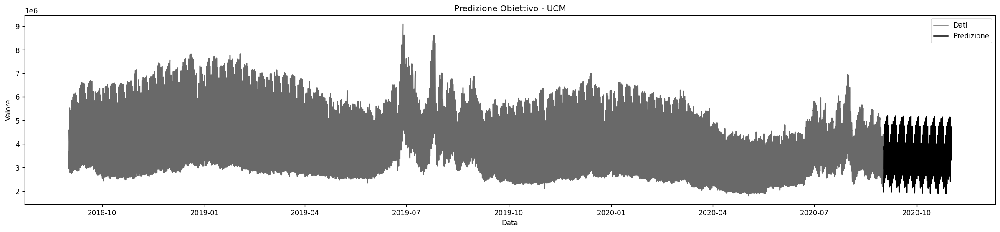

In [70]:
plt.figure(figsize=(25, 5))
plt.title('Predizione Obiettivo - UCM')
plt.plot(dati['Valore'], color='dimgrey', label='Dati')
plt.plot(previsionifutureUCM_dataframe['UCM'], color='black', label='Predizione')
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

# Prophet 

# Sviluppato su colab (allegato in un ulteriore notebook)

# MODELLI NON LINEARI - MACHINE LEARNING

In [111]:
import numpy as np
import pandas as pd
from tensorflow.keras import Sequential
from tensorflow.compat.v1.keras.layers import CuDNNLSTM
from keras.layers import LSTM, Dense, Dropout, Activation, BatchNormalization, Dropout, LeakyReLU
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [112]:
dati=pd.read_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/Progetto Streaming Data/dati_preprocessati.csv', header=0, low_memory=False, parse_dates=['DataeOra'])
dati.set_index('DataeOra', inplace=True)
dati.index.freq='H'
dati.head()

,Data,Ora,Valore,Mese,Giorno,Anno,Giornosettimana
DataeOra,,,,,,,
2018-09-01 00:00:00,2018-09-01,0,3646742.0,9,1,2018,Saturday
2018-09-01 01:00:00,2018-09-01,1,3273110.0,9,1,2018,Saturday
2018-09-01 02:00:00,2018-09-01,2,3069245.0,9,1,2018,Saturday
2018-09-01 03:00:00,2018-09-01,3,2969621.0,9,1,2018,Saturday
2018-09-01 04:00:00,2018-09-01,4,2944116.0,9,1,2018,Saturday


In [214]:
#Train / validation split
#Dato un mese in più per dare maggiore dati all'algoritmo di machine learning per apprendere dai dati:
train_dati = dati.loc[:"2020-06-23 23:00:00"]
train_dati = train_dati[["Valore"]]
print("Numero di elementi presenti nel train: ", len(train_dati))
validation_dati = dati.loc["2020-06-24 00:00:00":]
print("Numero di elementi presenti nel validation: ", len(validation_dati))

Numero di elementi presenti nel train:  15888
Numero di elementi presenti nel validation:  1656


In [215]:
train_dati_provascalato = dati.loc[:"2020-06-23 23:00:00"].copy()
train_dati_provascalato = train_dati_provascalato[["Valore"]]
train_dati_provascalato.head(3)

,Valore
DataeOra,
2018-09-01 00:00:00,3646742.0
2018-09-01 01:00:00,3273110.0
2018-09-01 02:00:00,3069245.0


In [216]:
dati_provascalato = dati
dati_provascalato = dati_provascalato[["Valore"]]
dati_provascalato.head(3)

,Valore
DataeOra,
2018-09-01 00:00:00,3646742.0
2018-09-01 01:00:00,3273110.0
2018-09-01 02:00:00,3069245.0


In [217]:
#Provvedo a scalare da 0.01 a 1 i valori di train_dati, che è il mio training:
scaler_train_dati_provascalato = None
if not scaler_train_dati_provascalato:
    scaler_train_dati_provascalato = MinMaxScaler(feature_range=(0.01, 1))
    scaler_train_dati_provascalato.fit(train_dati_provascalato)
train_dati_provascalato["Valore"] = scaler_train_dati_provascalato.transform(train_dati_provascalato)
train_dati_provascalato.head(3)

,Valore
DataeOra,
2018-09-01 00:00:00,0.260822
2018-09-01 01:00:00,0.210172
2018-09-01 02:00:00,0.182536


In [218]:
#Provvedo a scalare da 0.01 a 1 i valori di dati, che è il mio dataset completo:
scaler_dati_provascalato = None
if not scaler_dati_provascalato:
    scaler_dati_provascalato = MinMaxScaler(feature_range=(0.01, 1))
    scaler_dati_provascalato.fit(dati_provascalato)
dati_provascalato["Valore"] = scaler_dati_provascalato.transform(dati_provascalato)
dati_provascalato.head(3)

,Valore
DataeOra,
2018-09-01 00:00:00,0.260822
2018-09-01 01:00:00,0.210172
2018-09-01 02:00:00,0.182536


## ONE STEP PREDICTION - STATEFUL

In [150]:
#[ONE STEP PREDICTION - STATEFUL]
n_steps_in = 24 
n_steps_out = 1 
n_features = 1
#Eseguo lo split dei dati e sistemazione per essere utilizzati nel modello di LSTM:
X, y = list(), list()
for i in range(len(train_dati_provascalato)):
    end_ix = i + n_steps_in
    out_end_ix = end_ix + n_steps_out
    if out_end_ix > len(train_dati_provascalato):
      break
    seq_x, seq_y = list(train_dati_provascalato['Valore'][i:end_ix]), list(train_dati_provascalato['Valore'][end_ix:out_end_ix])
    X.append(seq_x)
    y.append(seq_y)
X = np.array(X)
y = np.array(y)
X = X.reshape((X.shape[0], X.shape[1], n_features))

#[MODELLO IMPLEMENTAZIONE]
batch_size = 1
# Definisco il modello:
model_lstm_stateful_osp = Sequential()
model_lstm_stateful_osp.add(LSTM(200, batch_input_shape=(batch_size, n_steps_in, n_features), stateful=True)) 
model_lstm_stateful_osp.add(LeakyReLU())
model_lstm_stateful_osp.add(Dropout(0.2))
model_lstm_stateful_osp.add(Dense(n_steps_out))
model_lstm_stateful_osp.compile(optimizer='adam', loss='mae')
#Eseguo le epoche in modo ricorsivo in maniera manuale:
for i in range(10):
	model_lstm_stateful_osp.fit(X, y, epochs=1, batch_size=batch_size, verbose=1, shuffle=False)
	model_lstm_stateful_osp.reset_states()

15864/15864 [==============================] - 123s 8ms/step - loss: 0.0145


In [151]:
%%time
#Effettuo la predizione sul validation:
prev_st=[]
x_input = np.array(train_dati_provascalato[-n_steps_in:])
#Vado ad inserire le predizioni in una lista che è stata creata per contenere le predizioni:
for i in range(len(validation_dati)):
  x_input = x_input[-n_steps_in:]
  yhat = model_lstm_stateful_osp.predict(x_input.reshape(1, n_steps_in, n_features), verbose=0, batch_size=batch_size)
  prev_st.append(yhat[0][0])
  x_input=np.vstack([x_input, yhat[0]])
  del yhat
#Sistemo le predizioni finali per ottenere un dataset finbale da utilizzare per effettuare i confronti:
prev = scaler_train_dati_provascalato.inverse_transform(np.array(prev_st).reshape(-1,1))
pred_final = pd.DataFrame(prev, index=validation_dati.index, columns=['Valore'])

CPU times: user 51.3 s, sys: 2.26 s, total: 53.5 s
Wall time: 51.1 s


In [152]:
n_steps_in = 24 
n_steps_out = 1 
n_features = 1
#Risistemo nuovamente i dati per effettuare la predizione procedere a calcolare il MAE sul training set:
X, y = list(), list()
for i in range(len(train_dati)):
    end_ix = i + n_steps_in
    out_end_ix = end_ix + n_steps_out
    if out_end_ix > len(train_dati):
      break
    seq_x, seq_y = list(train_dati['Valore'][i:end_ix]), list(train_dati['Valore'][end_ix:out_end_ix])
    X.append(seq_x)
    y.append(seq_y)
X = np.array(X)
y = np.array(y)
X = X.reshape((X.shape[0], X.shape[1], n_features))
#Effettuo il calcolo dei vari MAE sul training e validation:
print("[CALCOLO MAE - TRAINING & VALIDATION]")
print("---------------------------------")
print("MAE training set:", round(np.mean(np.abs(scaler_train_dati_provascalato.inverse_transform(model_lstm_stateful_osp.predict(X, batch_size=batch_size)) - y)), 1))
print("---------------------------------")
print("MAE validation set:", round(np.mean(np.abs(validation_dati['Valore'] - pred_final['Valore'])), 1))

[CALCOLO MAE - TRAINING & VALIDATION]
---------------------------------
MAE training set: 14117657.1
---------------------------------
MAE validation set: 917501.6


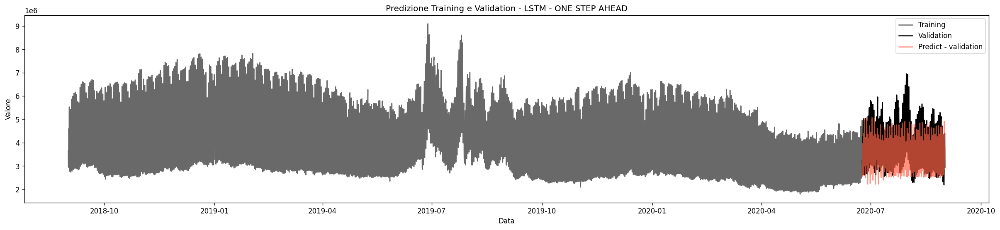

In [153]:
#Effettuo la previsione visiva:
plt.figure(figsize=(25, 5))
plt.title('Predizione Training e Validation - LSTM - ONE STEP AHEAD')
plt.plot(train_dati['Valore'], color='dimgrey', label='Training')
plt.plot(validation_dati['Valore'], color='black', label='Validation')
plt.plot(pred_final['Valore'], color='tomato', label='Predict - validation', alpha=0.7)
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

## MULTISTEP PREDICTION - STATEFUL

In [172]:
%%time
#[MULTISTEP PREDICTION - STATEFUL]
n_features = 1
n_steps_in = 30*24
n_steps_out = 69*24
X, y = list(), list()
#Eseguo lo split dei dati e sistemazione per essere utilizzati nel modello di LSTM:
for i in range(len(train_dati_provascalato)):
    end_ix = i + n_steps_in
    out_end_ix = end_ix + n_steps_out
    if out_end_ix > len(train_dati_provascalato):
      break
    seq_x, seq_y = list(train_dati_provascalato['Valore'][i:end_ix]), list(train_dati_provascalato['Valore'][end_ix:out_end_ix])
    X.append(seq_x)
    y.append(seq_y)
X = np.array(X)
y = np.array(y)
X = X.reshape((X.shape[0], X.shape[1], n_features))
#[MODELLO IMPLEMENTAZIONE]
batch_size = 1
#Definisco il modello da implementare:
model_msp_stateful = Sequential()
model_msp_stateful.add(LSTM(200, batch_input_shape=(batch_size, n_steps_in, n_features), stateful=True)) 
model_msp_stateful.add(LeakyReLU())
model_msp_stateful.add(Dropout(0.2))
model_msp_stateful.add(Dense(n_steps_out))
model_msp_stateful.compile(optimizer='adam', loss='mae')
#Eseguo le epoche in modo ricorsivo in maniera manuale:

model_msp_stateful.fit(X, y, epochs=1, batch_size=batch_size, verbose=1, shuffle=False)

13513/13513 [==============================] - 2163s 160ms/step - loss: 0.1343
CPU times: user 1h 34min 18s, sys: 22min 14s, total: 1h 56min 32s
Wall time: 36min 15s


In [173]:
#Predizione sul test set e sul validation set:
x_input = np.array(train_dati_provascalato[-n_steps_in:])
yhat = model_msp_stateful.predict(x_input.reshape(1, n_steps_in, n_features), verbose=0, batch_size=batch_size)
#Vado a creare un dataset con le informazioni delle previsioni per essere maggiormente gestibile:
pred = pd.DataFrame({'Valore': yhat[0], 'datetime': validation_dati.index})
pred.set_index('datetime', inplace=True)
pred['Valore'] = scaler_train_dati_provascalato.inverse_transform(pred)

In [174]:
n_steps_in = 24*30
n_steps_out = 69*24
n_features = 1
#Rieseguo la sistemazione dei dati per effettuare le previsioni:
X, y = list(), list()
for i in range(len(train_dati)):
    end_ix = i + n_steps_in
    out_end_ix = end_ix + n_steps_out
    if out_end_ix > len(train_dati):
      break
    seq_x, seq_y = list(train_dati['Valore'][i:end_ix]), list(train_dati['Valore'][end_ix:out_end_ix])
    X.append(seq_x)
    y.append(seq_y)
X = np.array(X)
y = np.array(y)
X = X.reshape((X.shape[0], X.shape[1], n_features))
#Effettuo il calcolo dei valori di MAE sul training e validation set:
print("[CALCOLO MAE - TRAINING E VALIDATION]")
print("--------------------------")
print("MAE train:", round(np.mean(np.abs(scaler_train_dati_provascalato.inverse_transform(model_msp_stateful.predict(X, batch_size=batch_size)) - y)), 1))
print("--------------------------")
print("MAE validation:", round(np.mean(np.abs(validation_dati['Valore'] - pred['Valore'])), 1))

[CALCOLO MAE - TRAINING E VALIDATION]
--------------------------
MAE train: 7125007.5
--------------------------
MAE validation: 927704.7


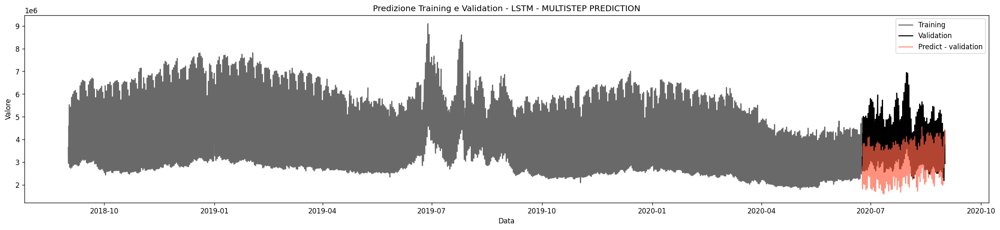

In [175]:
#Effettuo il confronto tramite le previsioni a livello di visualizzazione:
plt.figure(figsize=(25, 5))
plt.title('Predizione Training e Validation - LSTM - MULTISTEP PREDICTION')
plt.plot(train_dati['Valore'], color='dimgrey', label='Training')
plt.plot(validation_dati['Valore'], color='black', label='Validation')
plt.plot(pred['Valore'], color='tomato', label='Predict - validation', alpha=0.7)
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

## Modello ibrido

In [194]:
%%time
n_steps_in =  24*7
n_steps_out = 24*7
n_features=1
#Faccio il pre-processing dei dati a disposizione, in modo da renderli accettabili dal modello:
X, y = list(), list()
for i in range(len(train_dati_provascalato)):
    end_ix = i + n_steps_in
    out_end_ix = end_ix + n_steps_out
    if out_end_ix > len(train_dati_provascalato):
      break
    seq_x, seq_y = list(train_dati_provascalato['Valore'][i:end_ix]), list(train_dati_provascalato['Valore'][end_ix:out_end_ix])
    X.append(seq_x)
    y.append(seq_y)
X = np.array(X)
y = np.array(y)
X = X.reshape((X.shape[0], X.shape[1], n_features))
#[IMPLEMENTAZIONE MODELLO]
batch_size = 1
#definisco il modello effettivo:
model_ibrid_stateful = Sequential()
model_ibrid_stateful.add(LSTM(200, batch_input_shape=(batch_size, n_steps_in, n_features))
model_ibrid_stateful.add(LeakyReLU())
model_ibrid_stateful.add(Dropout(0.2))
model_ibrid_stateful.add(Dense(n_steps_out))
model_ibrid_stateful.compile(optimizer='adam', loss='mae')
#Uso un approccio ricorsivo dei miei dati per far andare il modello:
for i in range(2):
	model_ibrid_stateful.fit(X, y, epochs=1, batch_size=batch_size, verbose=1, shuffle=False)
	model_ibrid_stateful.reset_states()

14809/14809 [==============================] - 740s 50ms/step - loss: 0.0497
CPU times: user 47min 5s, sys: 11min 50s, total: 58min 56s
Wall time: 23min 7s


In [195]:
#Creo una lista dove andrò ad inserire le previsioni:
prev_scalato=[]
x_input = np.array(train_dati_provascalato[-n_steps_in:])
#Le previsioni vengono inserite all'interno della lista:
for i in range(int(len(validation_dati)/n_steps_out)+1):
  x_input = x_input[-n_steps_in:]
  yhat = model_ibrid_stateful.predict(x_input.reshape(1, n_steps_in, n_features), verbose=0, batch_size=batch_size)
  for j in range(n_steps_out):
    prev_scalato.append(yhat[0][j])
  x_input=np.vstack([x_input, yhat[0].reshape(yhat[0].shape[0], 1)])
  del yhat
#Creo il dataset finale con le previsioni del modello ibrido per essere poi confrontate:
prev = scaler_train_dati_provascalato.inverse_transform(np.array(prev_scalato).reshape(-1,1))
predizioni_finali = pd.DataFrame(prev[:len(validation_dati)], index=validation_dati.index, columns=['Valore'])

In [196]:
n_steps_in = 24*7
n_steps_out = 24*7
n_features = 1
#Rifaccio il preporcessing dei dati per effettuare il calcolo del MAE sul training e validation:
X, y = list(), list()
for i in range(len(train_dati)):
    end_ix = i + n_steps_in
    out_end_ix = end_ix + n_steps_out
    if out_end_ix > len(train_dati):
      break
    seq_x, seq_y = list(train_dati['Valore'][i:end_ix]), list(train_dati['Valore'][end_ix:out_end_ix])
    X.append(seq_x)
    y.append(seq_y)
X = np.array(X)
y = np.array(y)
X = X.reshape((X.shape[0], X.shape[1], n_features))
#effettuo il calcolo del mae sul training e validation con i dati di previsione:
print("[CALCOLO MAE - TRAINING E VALIDATION]")
print("--------------------------------")
print("MAE training dati:", round(np.mean(np.abs(scaler_train_dati_provascalato.inverse_transform(model_ibrid_stateful.predict(X, batch_size=batch_size)) - y)), 1))
print("--------------------------------")
print("MAE validation dati:", round(np.mean(np.abs(validation_dati['Valore'] - predizioni_finali['Valore'])), 1))

[CALCOLO MAE - TRAINING E VALIDATION]
--------------------------------
MAE training dati: 7141710.7
--------------------------------
MAE validation dati: 917879.1


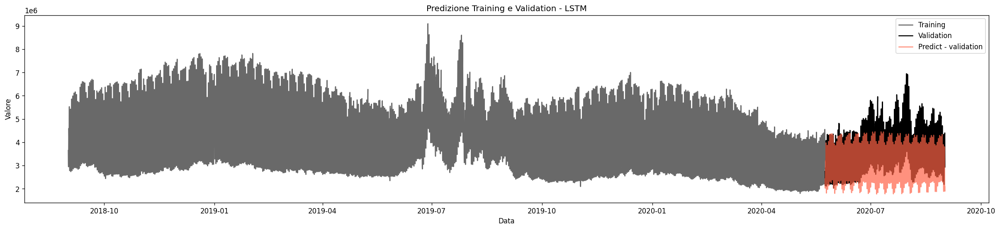

In [197]:
#Effettuo il confronto visivo per il modello con i dati di previsione:
plt.figure(figsize=(25, 5))
plt.title('Predizione Training e Validation - LSTM')
plt.plot(train_dati['Valore'], color='dimgrey', label='Training')
plt.plot(validation_dati['Valore'], color='black', label='Validation')
plt.plot(predizioni_finali['Valore'], color='tomato', label='Predict - validation', alpha=0.7)
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

## PREVISIONI LSTM

In [220]:
%%time
n_steps_in =  24*7
n_steps_out = 24*7
n_features=1
#Faccio il pre-processing dei dati a disposizione, in modo da renderli accettabili dal modello:
X, y = list(), list()
for i in range(len(dati_provascalato)):
    end_ix = i + n_steps_in
    out_end_ix = end_ix + n_steps_out
    if out_end_ix > len(dati_provascalato):
      break
    seq_x, seq_y = list(dati_provascalato['Valore'][i:end_ix]), list(dati_provascalato['Valore'][end_ix:out_end_ix])
    X.append(seq_x)
    y.append(seq_y)
X = np.array(X)
y = np.array(y)
X = X.reshape((X.shape[0], X.shape[1], n_features))
#[IMPLEMENTAZIONE MODELLO]
batch_size = 1
#definisco il modello effettivo:
model_ibrid_stateful = Sequential()
model_ibrid_stateful.add(LSTM(200, batch_input_shape=(batch_size, n_steps_in, n_features)))
model_ibrid_stateful.add(LeakyReLU())
model_ibrid_stateful.add(Dropout(0.2))
model_ibrid_stateful.add(Dense(n_steps_out))
model_ibrid_stateful.compile(optimizer='adam', loss='mae')
#Uso un approccio ricorsivo dei miei dati per far andare il modello:
model_ibrid_stateful.fit(X, y, epochs=1, batch_size=batch_size, verbose=1, shuffle=False)

17209/17209 [==============================] - 823s 48ms/step - loss: 0.0866
CPU times: user 28min 53s, sys: 7min 20s, total: 36min 13s
Wall time: 13min 48s


In [222]:
#prediction on validation set
previsioni_scalato_finali=[]
x_input = np.array(dati_provascalato[-n_steps_in:])
#Determino il numero di osservazioni nell'intervallo di previsione.
range_date=len(pd.date_range(start="2020-09-01 00:00:00", end="2020-10-31 23:00:00", freq='H'))
#Vado ad inserire le previsioni in una lista appositamente creata:
for i in range(int(range_date/n_steps_out)+7):
  x_input = x_input[-n_steps_in:]
  yhat = model_ibrid_stateful.predict(x_input.reshape(1, n_steps_in, n_features), verbose=0)
  for j in range(n_steps_out):
    previsioni_scalato_finali.append(yhat[0][j])
  x_input=np.vstack([x_input, yhat[0].reshape(yhat[0].shape[0], 1)])
  del yhat
#Ho messo +7 poichè i dati del validation erano composti da 1656 osservazioni, e lasciando +1, come nelle implementazioni precedenti, si arrivava a prevedere 1512 previsioni, così dacendo le previsioni coincidono con il validation come lunghezza.
#Creo il dataset finale con le previsioni del modello ibrido per essere poi confrontate:
prev = scaler_train_dati_provascalato.inverse_transform(np.array(previsioni_scalato_finali).reshape(-1,1))
predizioni_finali = pd.DataFrame(prev[:len(validation_dati)], index=validation_dati.index, columns=['Valore'])

In [237]:
#Procedo con il costruire il dataset finale selezionando l'intervallo di date delle predizioni:
previsioni_LSTM = pd.DataFrame({'LSTM': previsioni_scalato_finali[:range_date], 'Date': pd.date_range(start="2020-09-01 00:00:00", end="2020-10-31 23:00:00", freq='H')})
previsioni_LSTM.set_index('Date', inplace=True)
previsioni_LSTM['LSTM'] = scaler_dati_provascalato.inverse_transform(previsioni_LSTM)
#Salvo il dataset così creato:
previsioni_LSTM.to_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/previsioni_LSTM.csv')

In [2]:
#Effettuo la visualizzazione della predizione per una maggfiore utilità visiva:
plt.figure(figsize=(25, 5))
plt.title('Predizione Obiettivo - LSTM')
plt.plot(dati['Valore'], color='dimgrey', label='Dati')
plt.plot(previsioni_LSTM['LSTM'], color='black', label='Predizione')
plt.ylabel('Valore')
plt.xlabel("Data")
plt.legend()
plt.show()

# Creazione dataset finale

In [232]:
dati_input=pd.read_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/Progetto Streaming Data/dati_preprocessati.csv', header=0, low_memory=False, parse_dates=['DataeOra'])
dati_input.set_index('DataeOra', inplace=True)
dati_input.index.freq='H'
dati_input.head()

,Data,Ora,Valore,Mese,Giorno,Anno,Giornosettimana
DataeOra,,,,,,,
2018-09-01 00:00:00,2018-09-01,0,3646742.0,9,1,2018,Saturday
2018-09-01 01:00:00,2018-09-01,1,3273110.0,9,1,2018,Saturday
2018-09-01 02:00:00,2018-09-01,2,3069245.0,9,1,2018,Saturday
2018-09-01 03:00:00,2018-09-01,3,2969621.0,9,1,2018,Saturday
2018-09-01 04:00:00,2018-09-01,4,2944116.0,9,1,2018,Saturday


In [233]:
dati_output_arima = pd.read_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/Progetto Streaming Data/previsionifutureSARIMAX_dataframe.csv', header=0, low_memory=False, parse_dates=['Date'])
dati_output_arima.set_index('Unnamed: 0', inplace=True)
dati_output_arima.head()

,ARIMA,Date
Unnamed: 0,,
2020-09-01 00:00:00,2.541160e+06,2020-09-01 00:00:00
2020-09-01 01:00:00,2.321182e+06,2020-09-01 01:00:00
2020-09-01 02:00:00,2.227675e+06,2020-09-01 02:00:00
2020-09-01 03:00:00,2.195847e+06,2020-09-01 03:00:00
2020-09-01 04:00:00,2.203353e+06,2020-09-01 04:00:00


In [234]:
dati_output_ucm = pd.read_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/Progetto Streaming Data/previsionifutureUCM_dataframe.csv', header=0, low_memory=False, parse_dates=['Date'])
dati_output_ucm.set_index('Unnamed: 0', inplace=True)
dati_output_ucm.head()

,UCM,Date
Unnamed: 0,,
2020-09-01 00:00:00,2.443256e+06,2020-09-01 00:00:00
2020-09-01 01:00:00,2.135459e+06,2020-09-01 01:00:00
2020-09-01 02:00:00,1.992405e+06,2020-09-01 02:00:00
2020-09-01 03:00:00,1.950541e+06,2020-09-01 03:00:00
2020-09-01 04:00:00,1.975067e+06,2020-09-01 04:00:00


In [244]:
dati_output_prophet = pd.read_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/Progetto Streaming Data/previsioni_prophet.csv', header=0, low_memory=False, parse_dates=['Date'])
dati_output_prophet["Unnamed: 0"] = dati_output_prophet["Date"]
dati_output_prophet.set_index('Unnamed: 0', inplace=True)
dati_output_prophet.head()

,Date,PROPHET
Unnamed: 0,,
2020-09-01 00:00:00,2020-09-01 00:00:00,2.381395e+06
2020-09-01 01:00:00,2020-09-01 01:00:00,2.019451e+06
2020-09-01 02:00:00,2020-09-01 02:00:00,1.798021e+06
2020-09-01 03:00:00,2020-09-01 03:00:00,1.663986e+06
2020-09-01 04:00:00,2020-09-01 04:00:00,1.650518e+06


In [242]:
dati_output_lstm = pd.read_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/previsioni_LSTM.csv', header=0, low_memory=False, parse_dates=['Date'])
dati_output_lstm["Unnamed: 0"] = dati_output_lstm["Date"]
dati_output_lstm.set_index('Unnamed: 0', inplace=True)
dati_output_lstm.head()

,Date,LSTM
Unnamed: 0,,
2020-09-01 00:00:00,2020-09-01 00:00:00,3.064891e+06
2020-09-01 01:00:00,2020-09-01 01:00:00,2.912731e+06
2020-09-01 02:00:00,2020-09-01 02:00:00,2.695484e+06
2020-09-01 03:00:00,2020-09-01 03:00:00,2.641996e+06
2020-09-01 04:00:00,2020-09-01 04:00:00,2.558122e+06


In [243]:
dati_output_migliori = pd.merge(dati_output_arima, dati_output_ucm, on='Date')
dati_output_migliori.head()

,ARIMA,Date,UCM
0,2.541160e+06,2020-09-01 00:00:00,2.443256e+06
1,2.321182e+06,2020-09-01 01:00:00,2.135459e+06
2,2.227675e+06,2020-09-01 02:00:00,1.992405e+06
3,2.195847e+06,2020-09-01 03:00:00,1.950541e+06
4,2.203353e+06,2020-09-01 04:00:00,1.975067e+06


In [245]:
dati_output_migliori = pd.merge(dati_output_migliori, dati_output_prophet, on='Date')
dati_output_migliori.head()

,ARIMA,Date,UCM,PROPHET
0,2.541160e+06,2020-09-01 00:00:00,2.443256e+06,2.381395e+06
1,2.321182e+06,2020-09-01 01:00:00,2.135459e+06,2.019451e+06
2,2.227675e+06,2020-09-01 02:00:00,1.992405e+06,1.798021e+06
3,2.195847e+06,2020-09-01 03:00:00,1.950541e+06,1.663986e+06
4,2.203353e+06,2020-09-01 04:00:00,1.975067e+06,1.650518e+06


In [246]:
dati_output_migliori = pd.merge(dati_output_migliori, dati_output_lstm, on='Date')
dati_output_migliori.head()

,ARIMA,Date,UCM,PROPHET,LSTM
0,2.541160e+06,2020-09-01 00:00:00,2.443256e+06,2.381395e+06,3.064891e+06
1,2.321182e+06,2020-09-01 01:00:00,2.135459e+06,2.019451e+06,2.912731e+06
2,2.227675e+06,2020-09-01 02:00:00,1.992405e+06,1.798021e+06,2.695484e+06
3,2.195847e+06,2020-09-01 03:00:00,1.950541e+06,1.663986e+06,2.641996e+06
4,2.203353e+06,2020-09-01 04:00:00,1.975067e+06,1.650518e+06,2.558122e+06


In [249]:
dati_output_migliori.rename(columns={"LSTM": "ML"}, inplace=True)
dati_output_migliori = dati_output_migliori.drop(["PROPHET"], axis=1)
dati_output_migliori.head(3)

,ARIMA,Date,UCM,ML
0,2.541160e+06,2020-09-01 00:00:00,2.443256e+06,3.064891e+06
1,2.321182e+06,2020-09-01 01:00:00,2.135459e+06,2.912731e+06
2,2.227675e+06,2020-09-01 02:00:00,1.992405e+06,2.695484e+06


In [250]:
dati_output_migliori.set_index('Date', inplace=True)
dati_output_migliori.head()

,ARIMA,UCM,ML
Date,,,
2020-09-01 00:00:00,2.541160e+06,2.443256e+06,3.064891e+06
2020-09-01 01:00:00,2.321182e+06,2.135459e+06,2.912731e+06
2020-09-01 02:00:00,2.227675e+06,1.992405e+06,2.695484e+06
2020-09-01 03:00:00,2.195847e+06,1.950541e+06,2.641996e+06
2020-09-01 04:00:00,2.203353e+06,1.975067e+06,2.558122e+06


In [251]:
dati_output_migliori['Ora']=dati_output_migliori.index.hour
dati_output_migliori['Ora']=dati_output_migliori['Ora']+1
dati_output_migliori['Ora']=dati_output_migliori['Ora'].astype(str)
dati_output_migliori.head()

,ARIMA,UCM,ML,Ora
Date,,,,
2020-09-01 00:00:00,2.541160e+06,2.443256e+06,3.064891e+06,1
2020-09-01 01:00:00,2.321182e+06,2.135459e+06,2.912731e+06,2
2020-09-01 02:00:00,2.227675e+06,1.992405e+06,2.695484e+06,3
2020-09-01 03:00:00,2.195847e+06,1.950541e+06,2.641996e+06,4
2020-09-01 04:00:00,2.203353e+06,1.975067e+06,2.558122e+06,5


In [252]:
dati_output_migliori['Data']=pd.to_datetime(dati_output_migliori.index.year.astype('str')+'-'+dati_output_migliori.index.month.astype('str')+'-'+dati_output_migliori.index.day.astype('str'),  format = "%Y-%m-%d" )
dati_output_migliori.head(3)

,ARIMA,UCM,ML,Ora,Data
Date,,,,,
2020-09-01 00:00:00,2.541160e+06,2.443256e+06,3.064891e+06,1,2020-09-01
2020-09-01 01:00:00,2.321182e+06,2.135459e+06,2.912731e+06,2,2020-09-01
2020-09-01 02:00:00,2.227675e+06,1.992405e+06,2.695484e+06,3,2020-09-01


In [253]:
dati_output_migliori = dati_output_migliori[['Data', 'Ora', 'ARIMA',  'UCM', 'ML']]

In [254]:
dati_output_migliori.head()

,Data,Ora,ARIMA,UCM,ML
Date,,,,,
2020-09-01 00:00:00,2020-09-01,1,2.541160e+06,2.443256e+06,3.064891e+06
2020-09-01 01:00:00,2020-09-01,2,2.321182e+06,2.135459e+06,2.912731e+06
2020-09-01 02:00:00,2020-09-01,3,2.227675e+06,1.992405e+06,2.695484e+06
2020-09-01 03:00:00,2020-09-01,4,2.195847e+06,1.950541e+06,2.641996e+06
2020-09-01 04:00:00,2020-09-01,5,2.203353e+06,1.975067e+06,2.558122e+06


In [255]:
dati_output_migliori.to_csv('/Users/matteo/Desktop/DATA SCIENCE/Streaming data/SDMTSA_812561_1.csv', sep=';', index=False)